In [321]:
import helper_functions
import pandas as pd
import numpy as np
from sklearn import preprocessing
import dynamo as dyn
from shapely.geometry import MultiPoint
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.interpolate import interp1d
from matplotlib.patches import Patch

In [322]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [477]:
%run '../dynamo_helper_functions.ipynb'

['/net/capricorn/home/xing/soh29/.conda/envs/dynamo_06_2024/lib/python3.8/site-packages/dynamo']


package,umap-learn,trimap,tqdm,statsmodels,setuptools,seaborn,scipy,scikit-learn,python-igraph,pynndescent,pre-commit,pandas,numpy,numdifftools,numba,networkx,matplotlib,loompy,hdbscan,dynamo-release,cvxopt,colorcet
version,0.5.6,1.1.4,4.66.4,0.14.1,70.1.0,0.13.2,1.10.1,1.3.2,0.11.5,0.5.8,3.5.0,1.2.0,1.23.0,0.9.41,0.51.2,3.1,3.7.5,3.0.7,0.8.37,1.0.0,1.3.2,3.1.0


In [333]:
doses = [0,12,25,50,100,200,400,800]
phases = ['G1.S', 'S', 'G2', 'G2.M', 'M.G1']
colors = {'G1.S':'firebrick', 'S':'orange', 'G2':'yellowgreen', 'G2.M':'teal', 'M.G1':'royalblue'}
colors3 = {'G1.S':'#b22222', 'S':'#ffd700', 'G2':'#9acd32', 'G2.M':'#008080', 'M.G1':'#4b0082'}
data_path = '../../../data/'
save_path = 'generated-data/cell-cycle-data/'
plot_path = 'plots/reaction_coordinate/'
fig3_path = '../../../../../MCF_10A_scRNAseq/Figures/Figure 3/Figure images/'

In [372]:
dose12 = pd.read_csv("/net/capricorn/home/xing/soh29/Research/MCF10A/notebooks/generated_data/revelio_DC/DC_dose_12.csv", index_col=0)

In [374]:
#dose12 = dose12.drop(["RC nneighbor","RC region"], axis=1)

# Obtain initial reaction coordinates

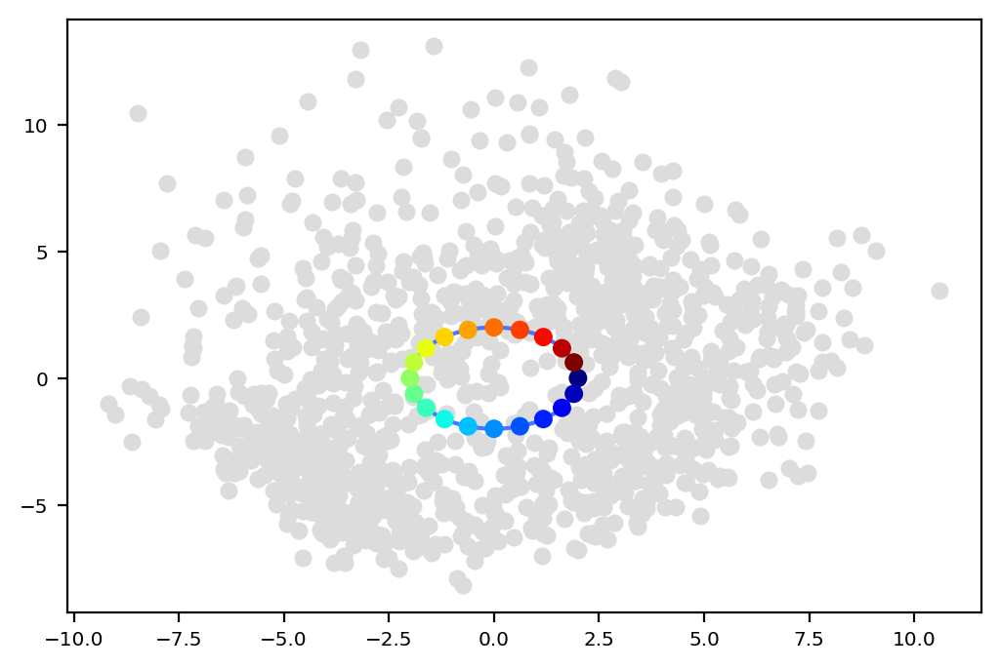

In [376]:
# approximate a circle
center_coords = np.mean(dose12[['DC1','DC2']])
n_points = 20
radius = 2 
angles = np.linspace(0, -2*np.pi, n_points, endpoint=False)
x = center_coords[0] + radius * np.cos(angles)
y = center_coords[1] + radius * np.sin(angles)
theta = np.linspace(0, 2*np.pi, 400)
dot_color=np.arange(x.
                    shape[0])
plt.scatter(dose12['DC1'], dose12['DC2'], #c=dose0['CC'].map(colors3)
           c='gainsboro', zorder=1)
plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)
plt.plot(center_coords[0] + radius * np.cos(theta),
        center_coords[1] + radius * np.sin(theta), label="Circle outline", zorder=2)
plt.show()

In [377]:
traj_arr = np.array(dose12[['DC1','DC2']])
initial_guess = np.concatenate([x[:,None], y[:,None]], axis=1)
root_state = initial_guess[0,:]
end_state = initial_guess[-1,:]
nrc = initial_guess.shape[0]

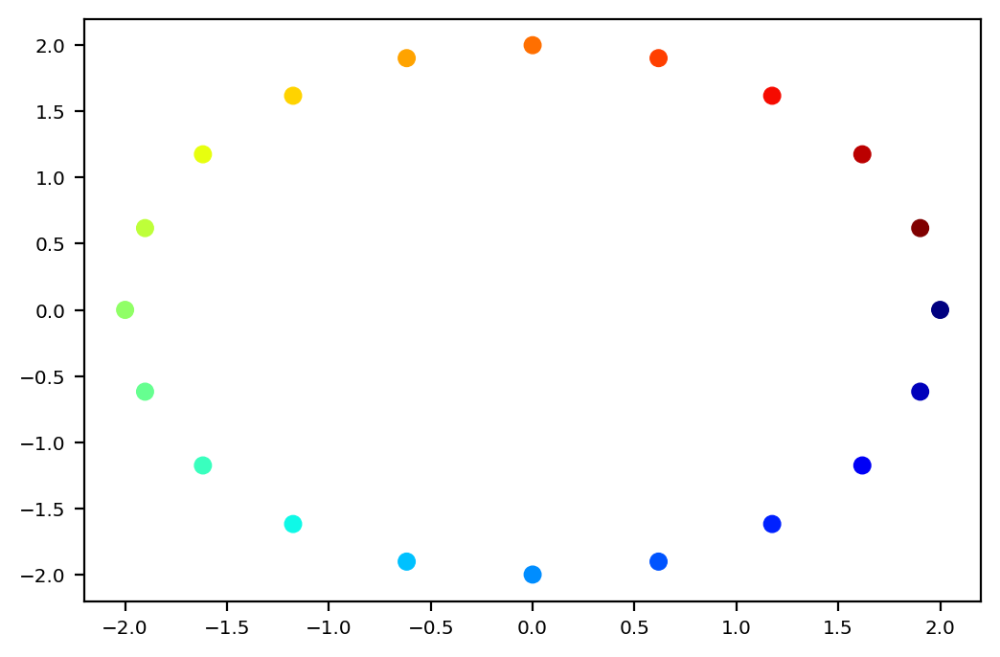

In [379]:
# plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)
# plt.show()

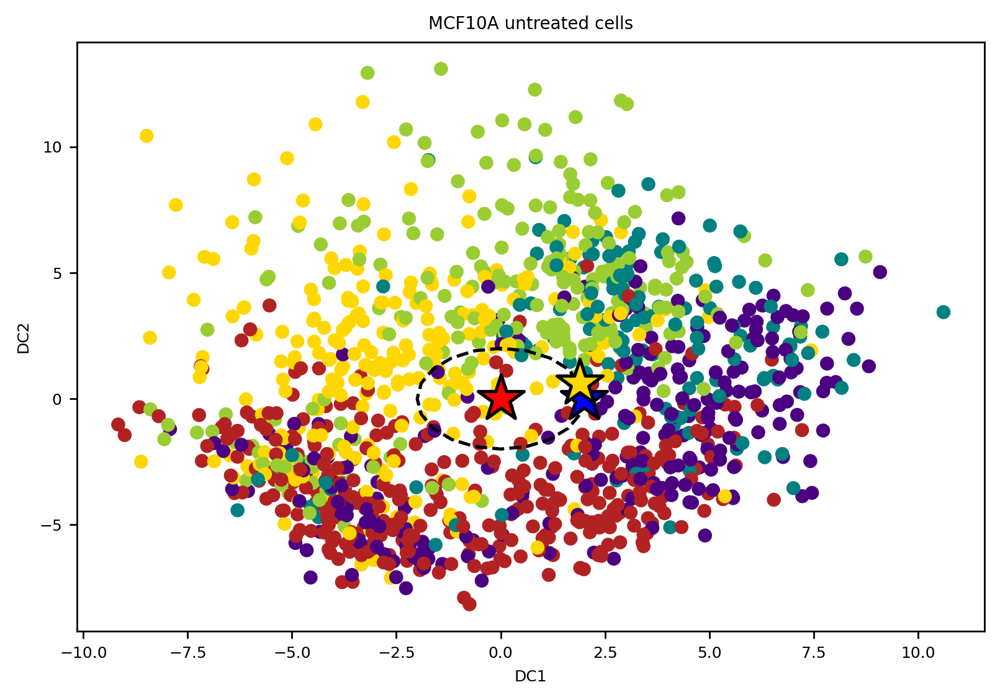

In [380]:
plt.figure(figsize=(7.5,5), dpi=125)
plt.scatter(dose12['DC1'], dose12['DC2'], c=dose12['CC'].map(colors3), zorder=1)
plt.scatter(root_state[0], root_state[1], color='blue', s=500, marker='*', linewidth=1.5, edgecolor='black', label='start', zorder=3)
plt.scatter(end_state[0], end_state[1], color='gold', s=500, marker='*', linewidth=1.5, edgecolor='black', label='end', zorder=3)
plt.scatter(center_coords[0], center_coords[1], color='red', s=500, marker='*', linewidth=1.5, edgecolor='black', zorder=2)
plt.plot(initial_guess[:,0], initial_guess[:,1], linestyle='dashed', c='black')
plt.xlabel('DC1')
plt.ylabel('DC2')
plt.title('MCF10A untreated cells')
#plt.savefig('../plots/new_CCC/dose12/string_method_start_and_endpoints.png',dpi=300)
plt.show()

In [383]:
FP=FindPath(dose12, initial_guess, "../plots/new_CCC/dose12/round1", nrc, traj_w=2,sf=1)
X0 = traj_arr
x1=root_state 
x2=end_state

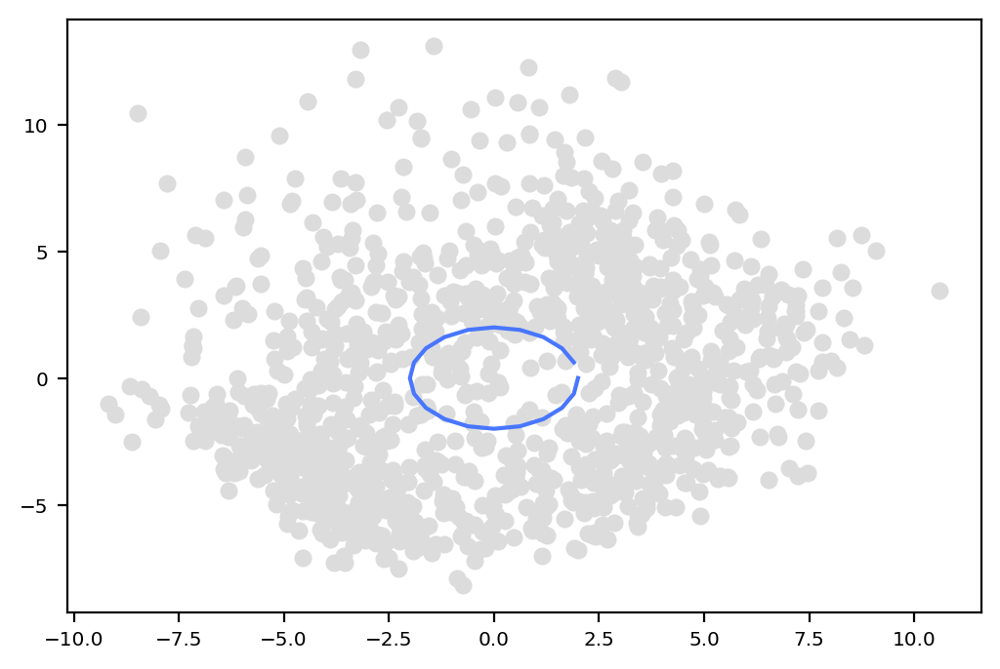

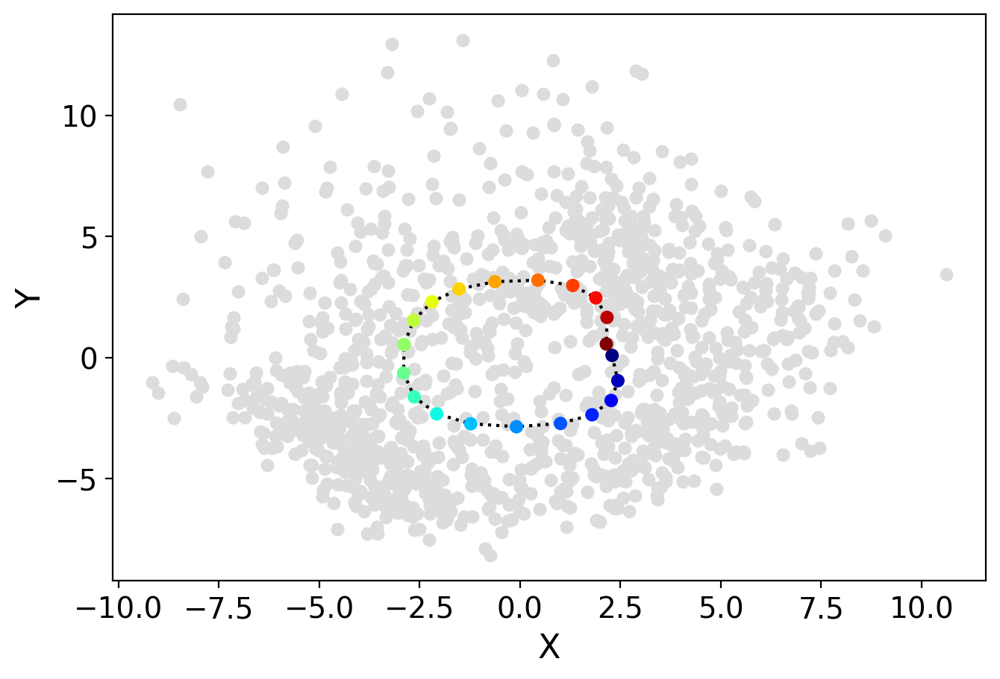

True


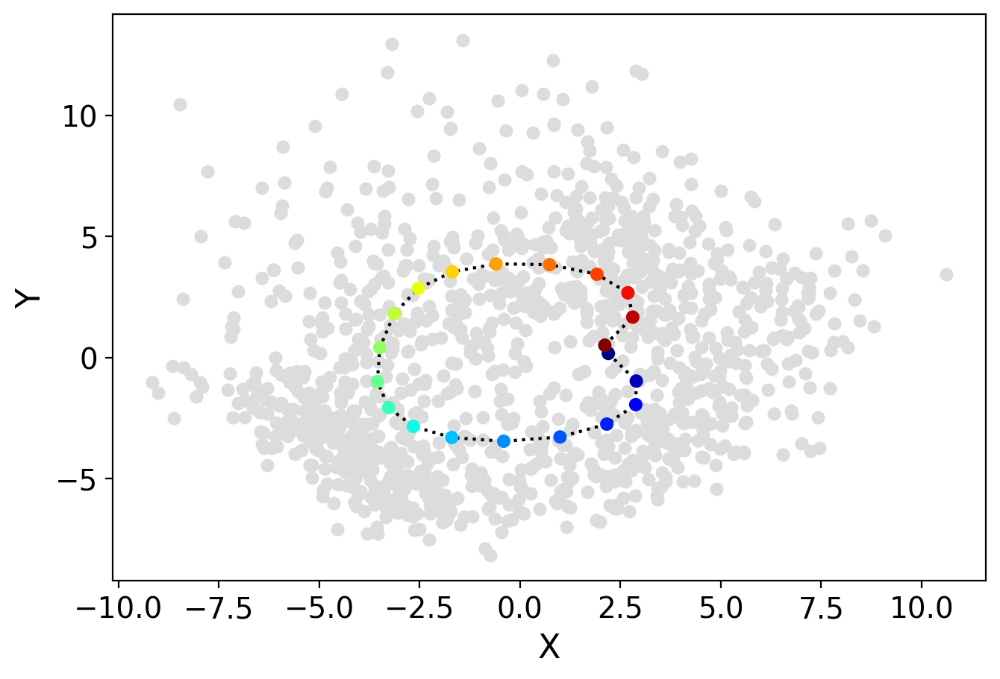

True


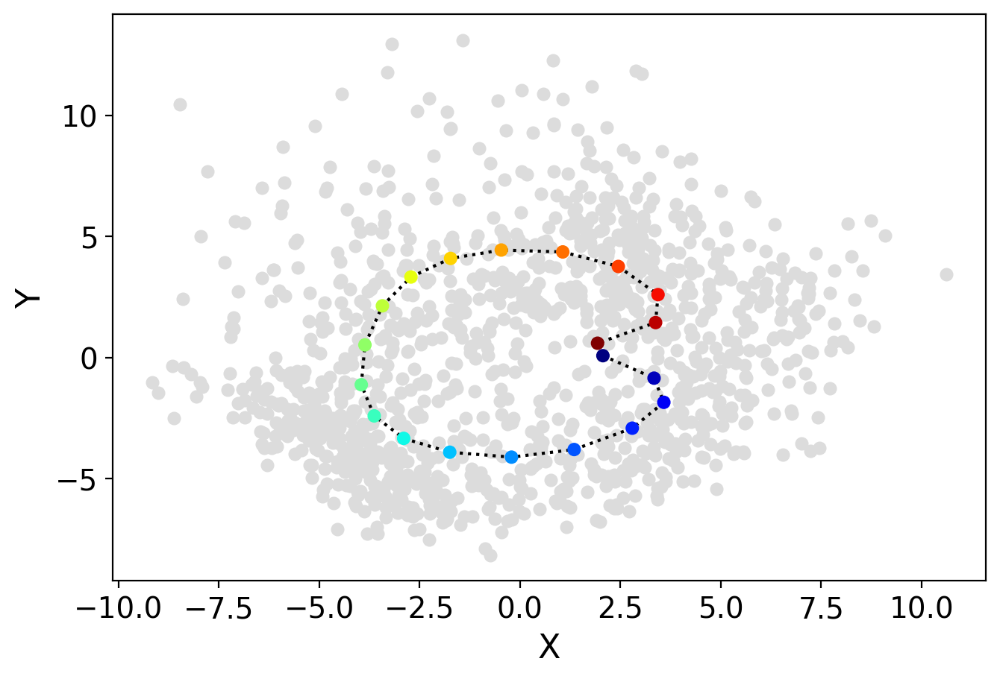

True


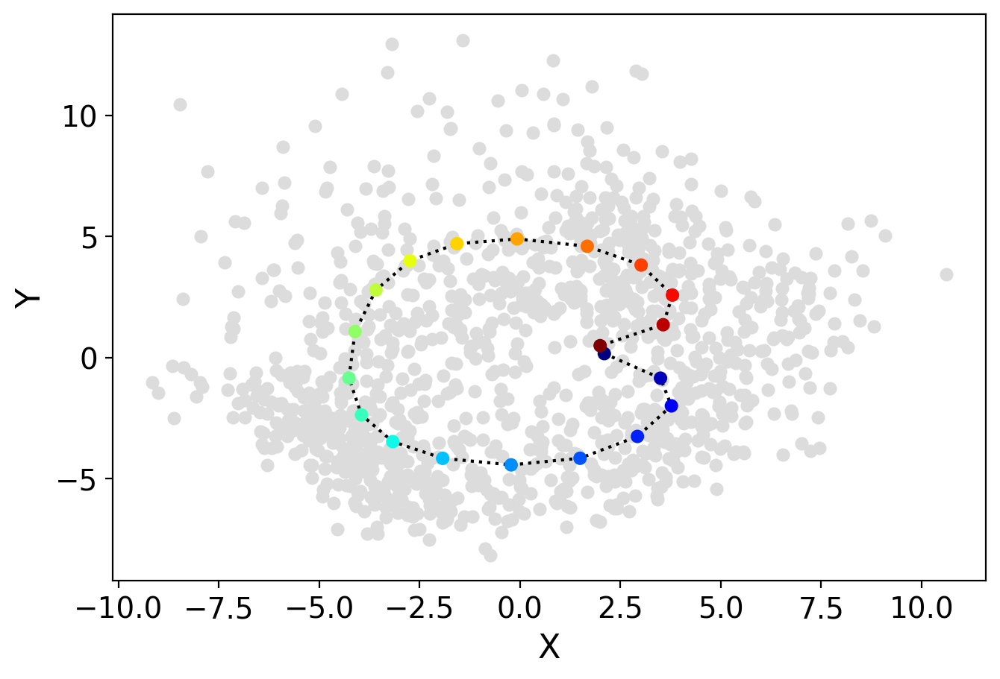

True


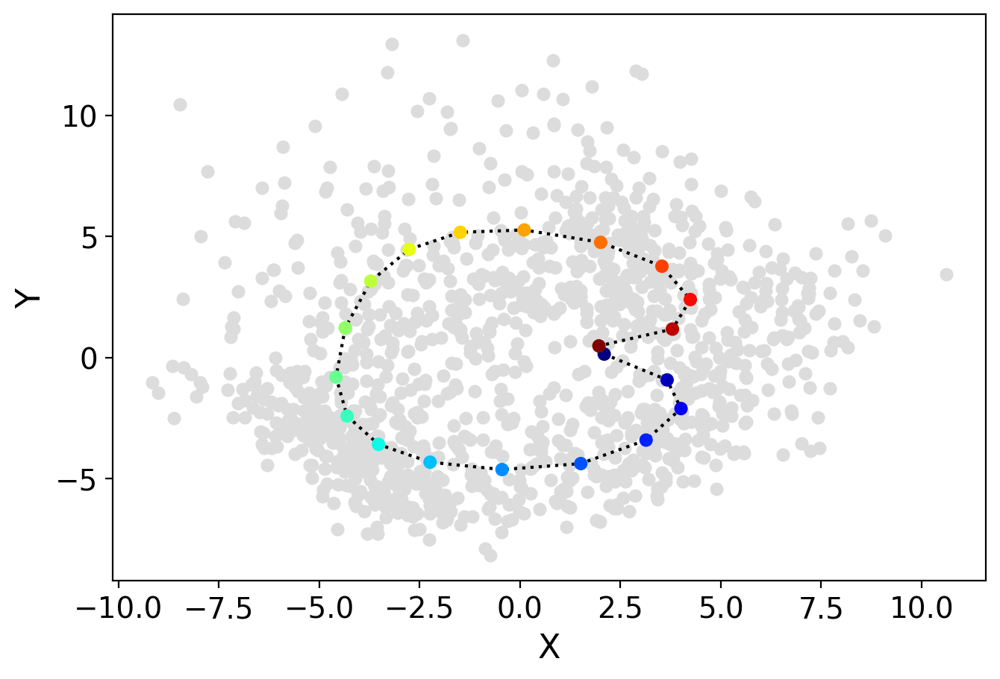

True


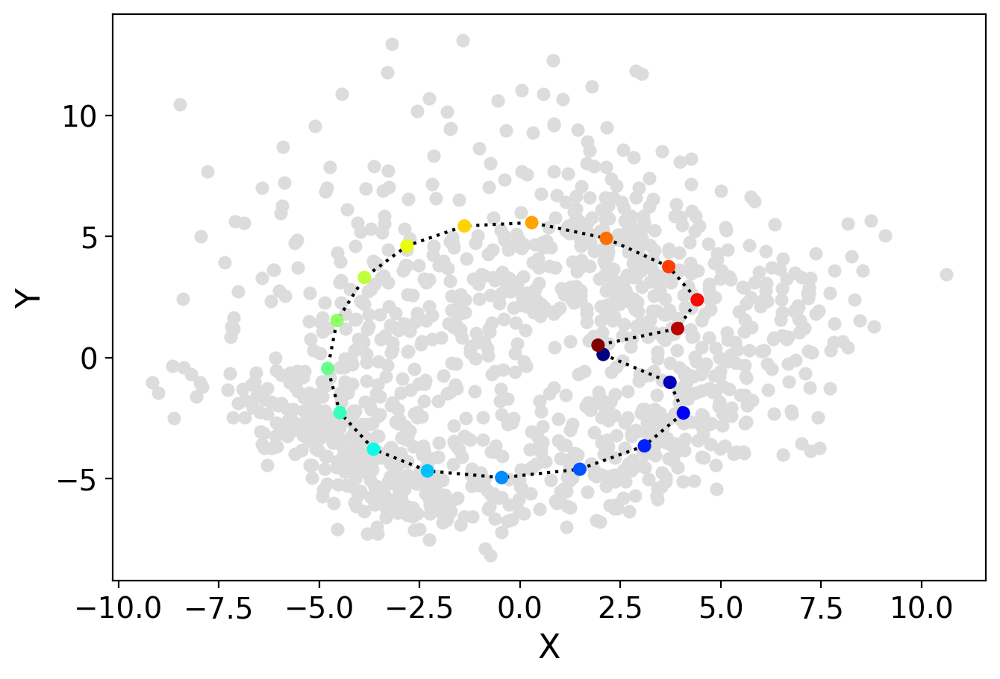

True


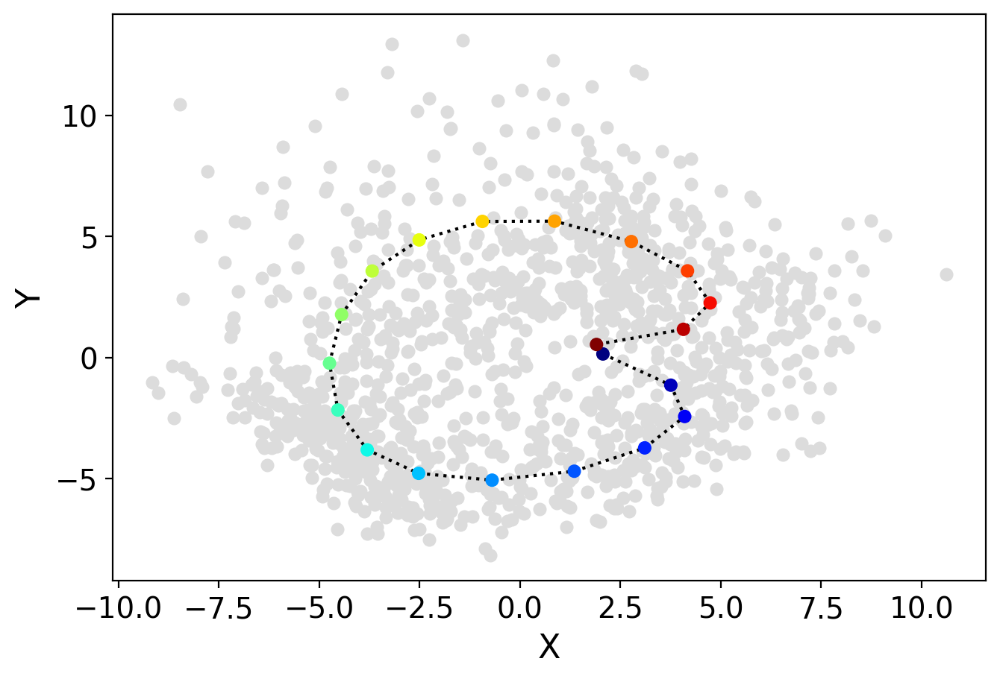

True


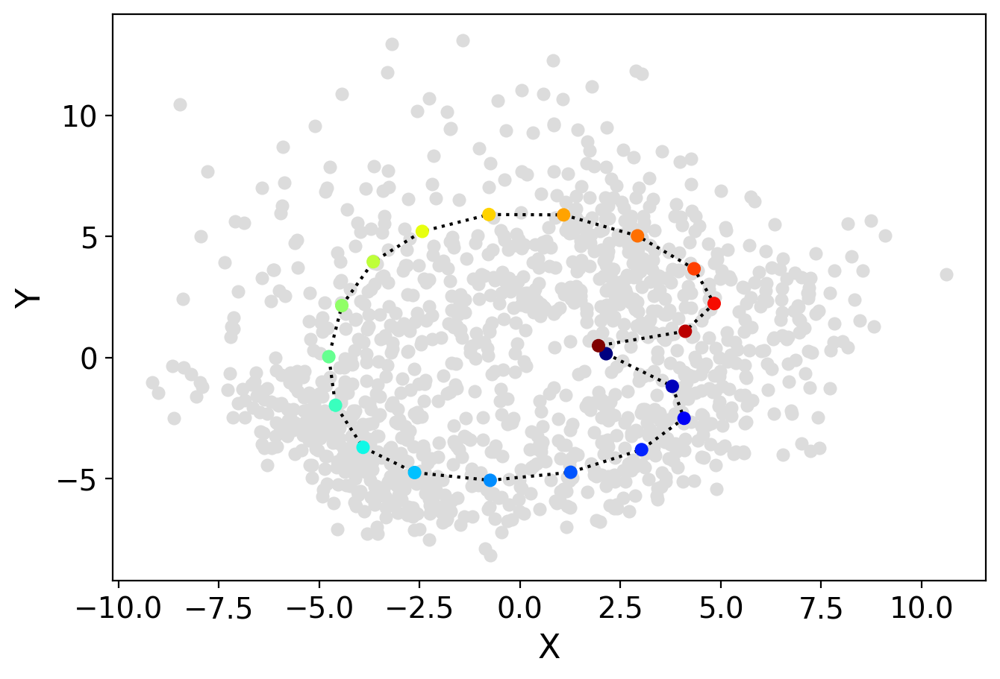

False


In [384]:
path0, data_rc0=FP.fit(x1,x2,[X0])

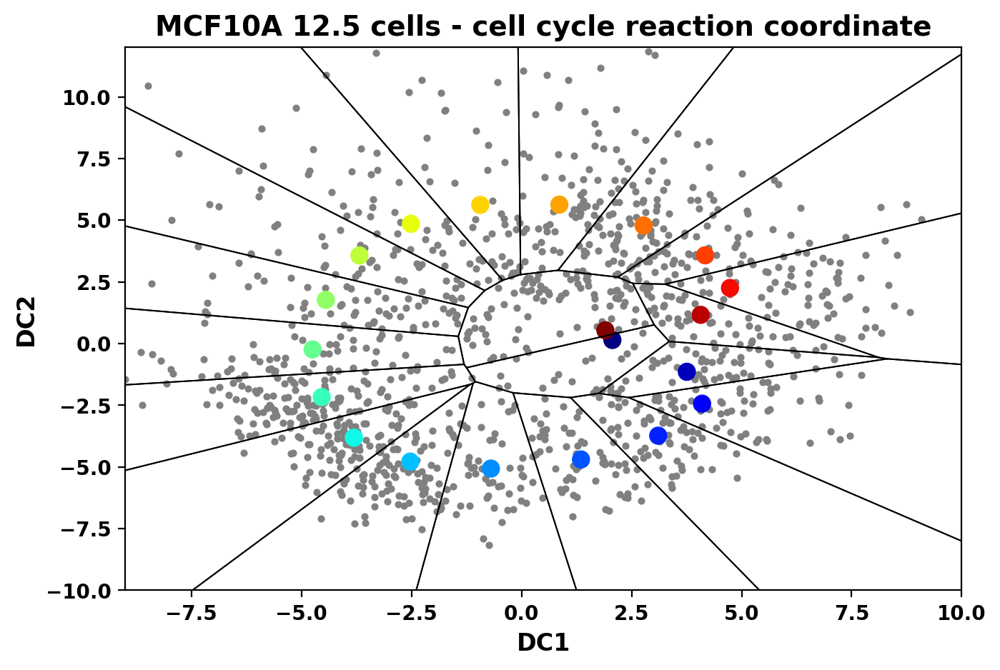

In [385]:
dot_color2=np.arange(path0.shape[0])
cm=plt.cm.get_cmap('jet')

fig,ax=plt.subplots(figsize=(7.5,5), dpi=100)
plt.scatter(dose12['DC1'], dose12['DC2'], s=10, color='grey')#,c=rho_w,cmap='viridis'

vor = Voronoi(path0[:,:2])
regions, vertices = voronoi_finite_polygons_2d(vor,radius=20)
for region in regions:
    polygon = vertices[region]
    for i in range(0,len(polygon)-1):
        plt.plot([polygon[i,0],polygon[i+1,0]], [polygon[i,1],polygon[i+1,1]], linewidth=0.7,color='k')
    plt.plot([polygon[-1,0],polygon[0,0]], [polygon[-1,1],polygon[0,1]],  linewidth=0.7,color='k')
    
plt.scatter(path0[:,0],path0[:,1],s=75,c=dot_color2,cmap=cm)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.axis([-9,10,-10,12])

plt.title('MCF10A 12.5 cells - cell cycle reaction coordinate', fontsize=14,fontweight='bold')
#plt.savefig("../plots/new_CCC/dose12/"+'dose12_voronoi_cells.png', transparent=True, dpi=300)
plt.show()

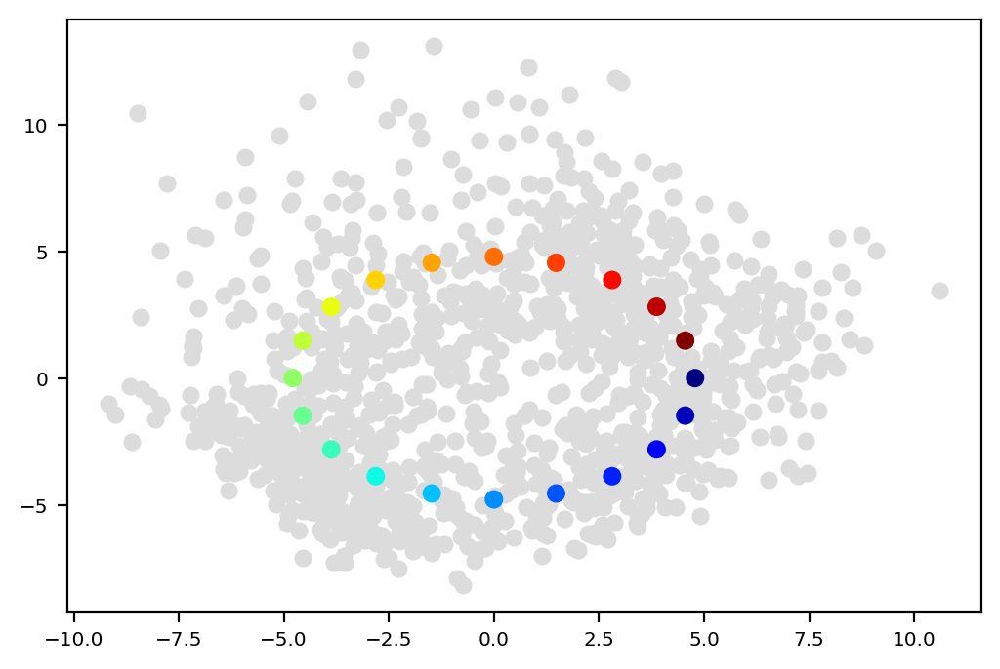

In [386]:
# approximate a circle
n_points = 20
rad = math.dist(center_coords, path0[int(path0.shape[0]/2),:])
angles = np.linspace(0, -2*np.pi, n_points, endpoint=False)
x = center_coords[0] + rad * np.cos(angles)
y = center_coords[1] + rad * np.sin(angles)
theta = np.linspace(0, 2*np.pi, 400)
dot_color=np.arange(x.
                    shape[0])
plt.scatter(dose12['DC1'], dose12['DC2'],
           c='gainsboro', zorder=1)
plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)

plt.show()

In [387]:
traj_arr = np.array(dose12[['DC1','DC2']])
second_guess = np.concatenate([x[:,None], y[:,None]], axis=1)
root_state = second_guess[0,:]
end_state = second_guess[-1,:]
nrc = second_guess.shape[0]

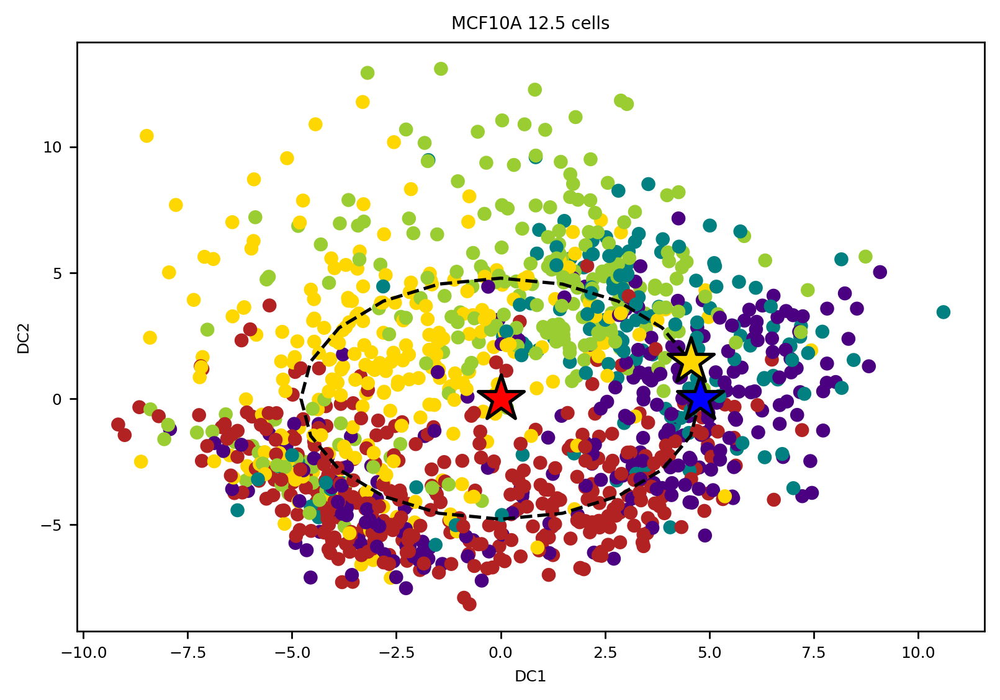

In [388]:
plt.figure(figsize=(7.5,5), dpi=125)
plt.scatter(dose12['DC1'], dose12['DC2'], c=dose12['CC'].map(colors3), zorder=1)
plt.scatter(root_state[0], root_state[1], color='blue', s=500, marker='*', linewidth=1.5, edgecolor='black', label='start', zorder=3)
plt.scatter(end_state[0], end_state[1], color='gold', s=500, marker='*', linewidth=1.5, edgecolor='black', label='end', zorder=3)
plt.scatter(center_coords[0], center_coords[1], color='red', s=500, marker='*', linewidth=1.5, edgecolor='black', zorder=2)
plt.plot(second_guess[:,0], second_guess[:,1], linestyle='dashed', c='black')
plt.xlabel('DC1')
plt.ylabel('DC2')
plt.title('MCF10A 12.5 cells')
#plt.savefig("../plots/new_CCC/dose12/"+'string_method_start_and_endpoints2.png',dpi=300)
plt.show()

In [389]:
FP=FindPath(dose12, second_guess, "../plots/new_CCC/dose12/round2", nrc,traj_w=2,sf=1)
X0 = traj_arr
root_state = second_guess[0,:]
end_state = second_guess[-1,:]
x1=root_state 
x2=end_state

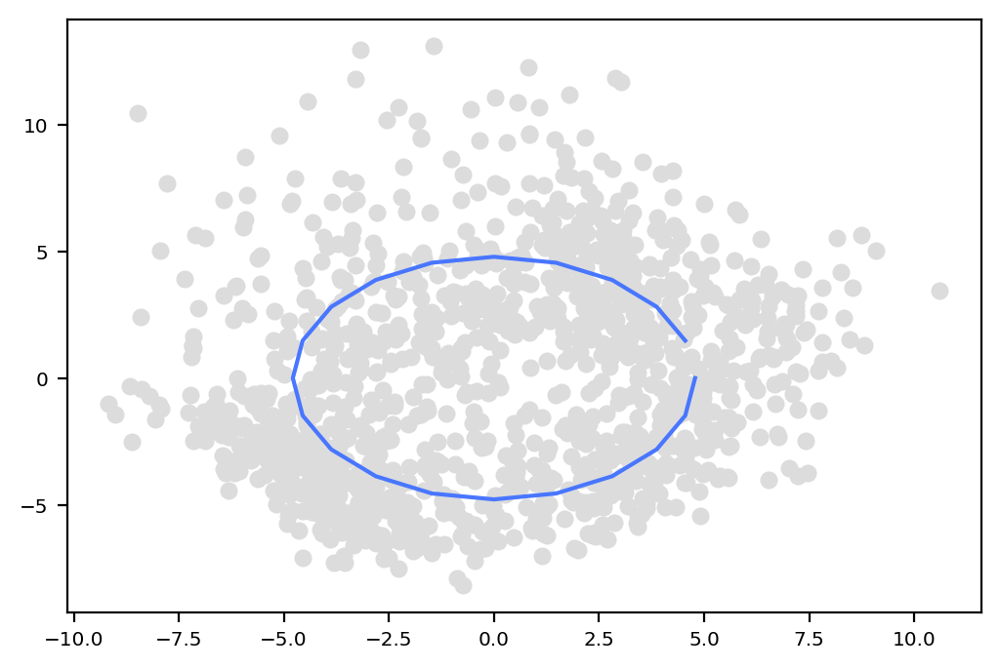

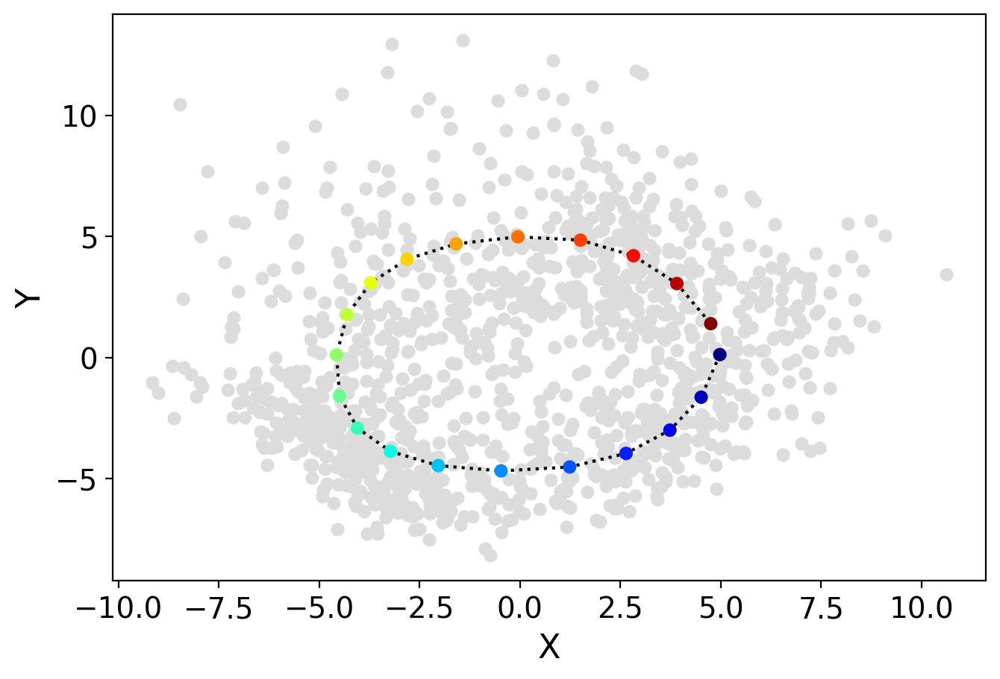

True


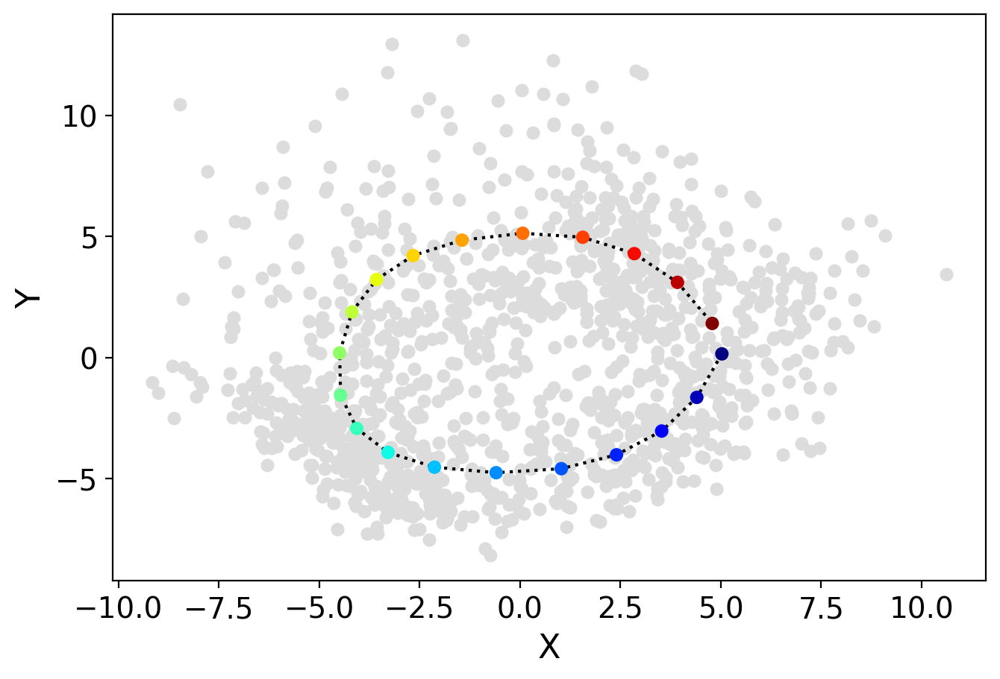

True


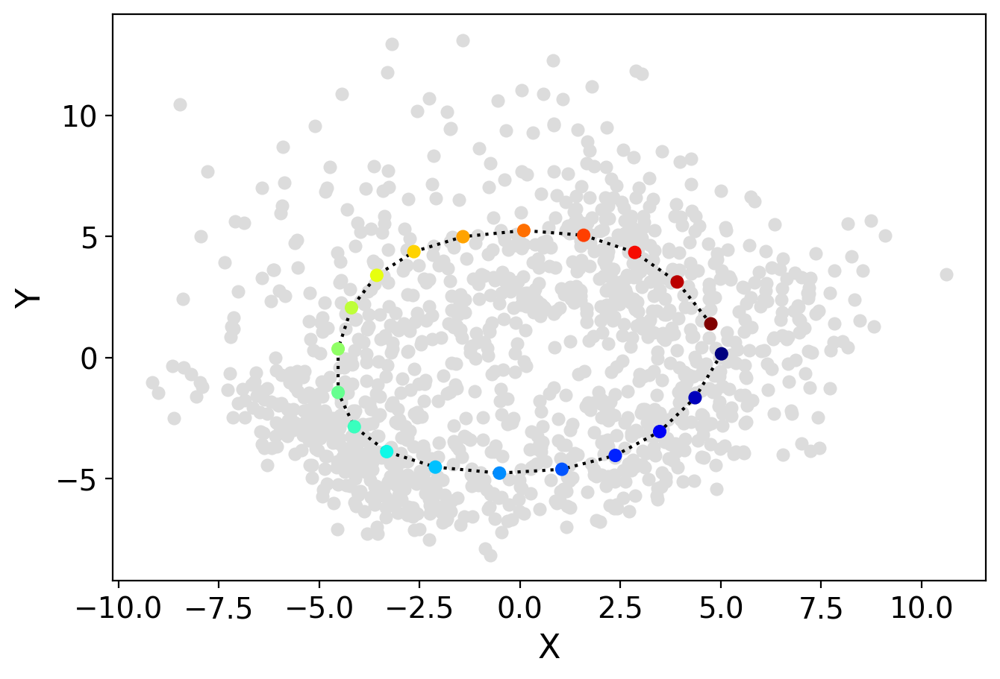

False


In [390]:
path1, data_rc0=FP.fit(x1,x2,[X0])

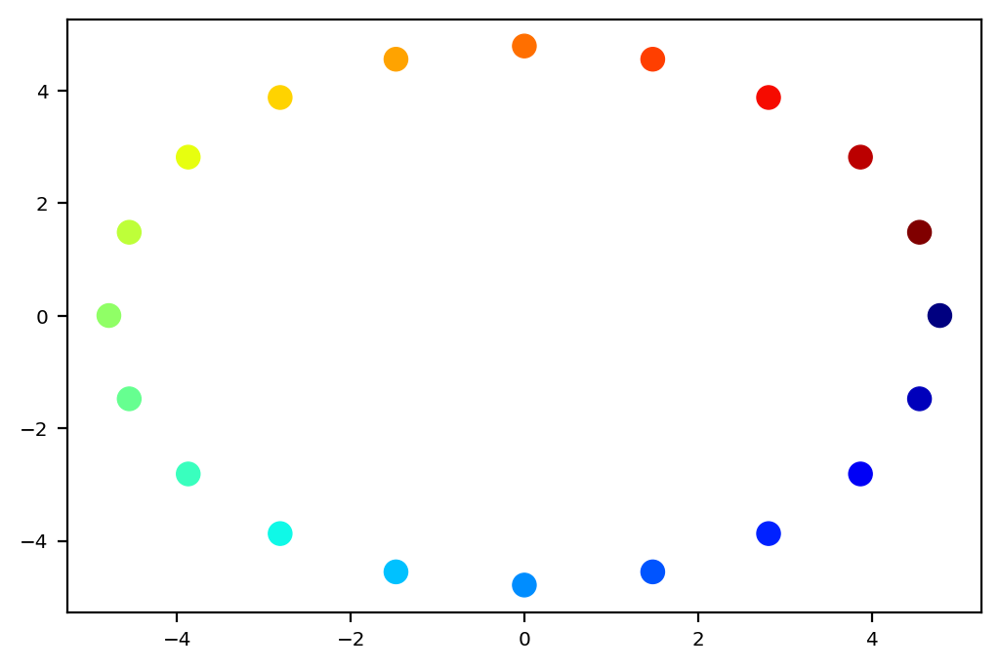

In [391]:
plt.scatter(second_guess[:,0],second_guess[:,1],s=75,c=dot_color2,cmap=cm)

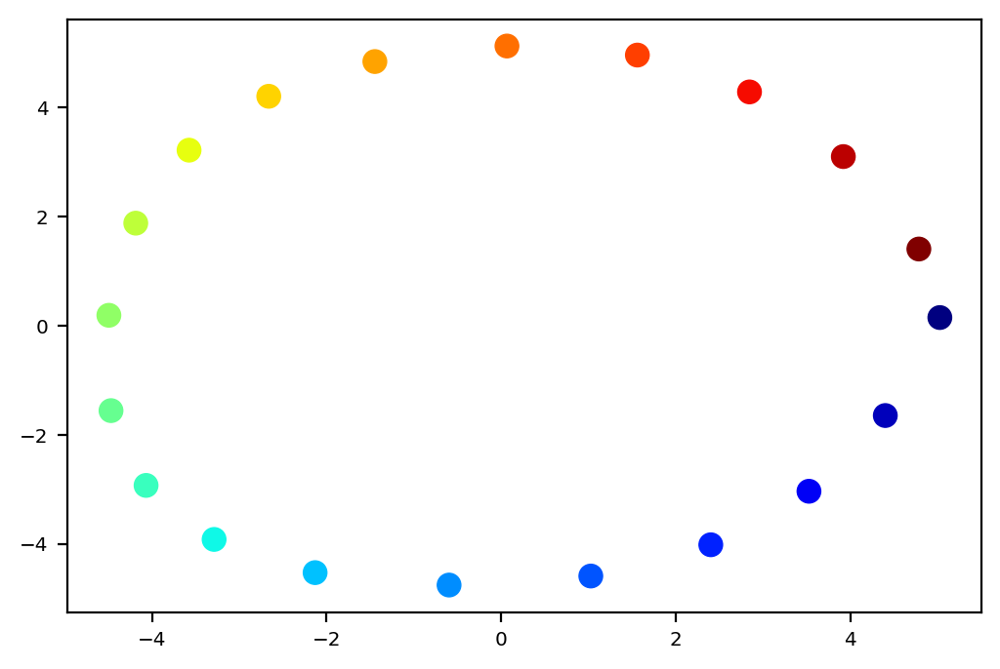

In [392]:
plt.scatter(path1[:,0],path1[:,1],s=75,c=dot_color2,cmap=cm)

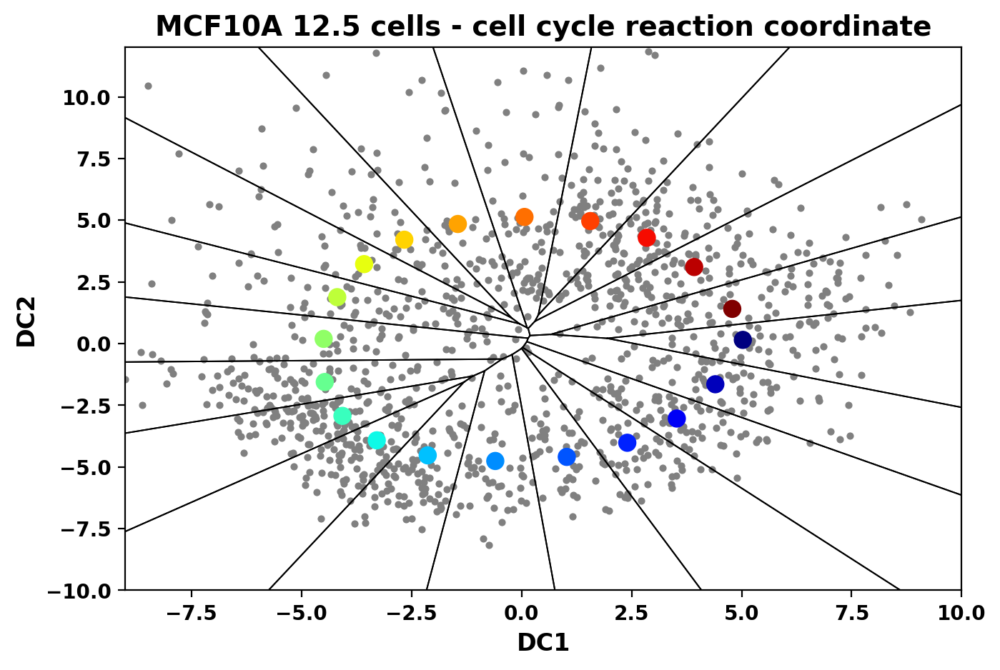

In [393]:
dot_color2=np.arange(path1.shape[0])
cm=plt.cm.get_cmap('jet')

fig,ax=plt.subplots(figsize=(7.5,5), dpi=100)
plt.scatter(dose12['DC1'], dose12['DC2'], s=10, color='grey')#,c=rho_w,cmap='viridis'

vor = Voronoi(path1[:,:2])
regions, vertices = voronoi_finite_polygons_2d(vor,radius=20)
for region in regions:
    polygon = vertices[region]
    for i in range(0,len(polygon)-1):
        plt.plot([polygon[i,0],polygon[i+1,0]], [polygon[i,1],polygon[i+1,1]], linewidth=0.7,color='k')
    plt.plot([polygon[-1,0],polygon[0,0]], [polygon[-1,1],polygon[0,1]],  linewidth=0.7,color='k')
    
plt.scatter(path1[:,0],path1[:,1],s=75,c=dot_color2,cmap=cm)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.axis([-9,10,-10,12])

plt.title('MCF10A 12.5 cells - cell cycle reaction coordinate', fontsize=14,fontweight='bold')
#plt.savefig("../plots/new_CCC/dose12/"+'dose12_voronoi_cells2.png', transparent=True, dpi=300)
plt.show()

In [394]:
#with open('generated-data/reaction-coordinate/dose0_regions', 'wb') as f:
# with open('../plots/new_CCC/dose12/dose12_regions', 'wb') as f:
#     pickle.dump(regions, f)

In [395]:
#with open('generated-data/reaction-coordinate/dose0_vertices', 'wb') as f:
# with open('../plots/new_CCC/dose12/dose12_vertices', 'wb') as f:
#     pickle.dump(vertices, f)

In [396]:
RC_regions = helper_functions.indicesToPolygon(regions, vertices)
dose12 = helper_functions.assignCoordsToReactionCoordinateRegions(dose12, RC_regions)

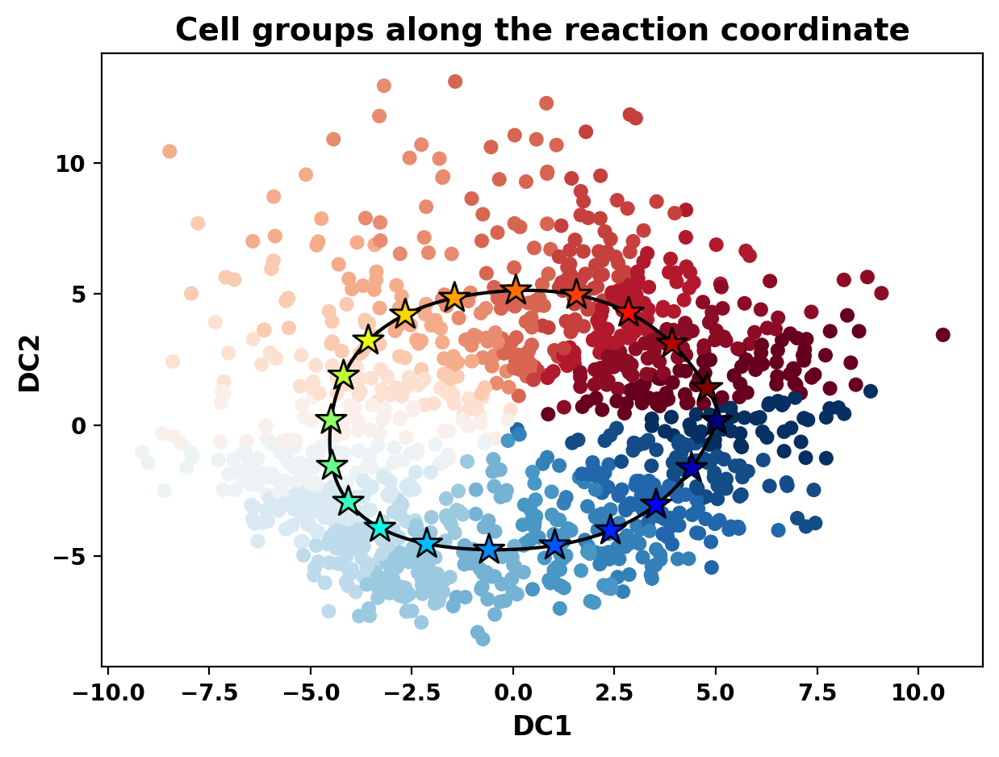

In [397]:
temp3 = np.vstack([path1, path1[0]])
x = temp3[:,0]
y = temp3[:,1]

t = np.arange(len(x))
ti = np.linspace(0, t.max(), 10 * t.size)

xi = interp1d(t, x, kind='cubic')(ti)
yi = interp1d(t, y, kind='cubic')(ti)

plt.figure(figsize = (7,5))

plt.scatter(dose12['DC1'], dose12['DC2'], c=dose12['RC region'], zorder=1)
plt.plot(xi, yi, color='black', zorder=2)
plt.scatter(path1[:,0],path1[:,1], c= np.arange(path1.shape[0]), cmap='jet' ,marker='*', s=200, edgecolor='black', linewidth=1, zorder=3)
plt.margins(0.05)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.title('Cell groups along the reaction coordinate', fontsize=14,fontweight='bold')
#plt.savefig("../plots/new_CCC/dose12/" + 'dose_initial_reaction_coordinate2.png', transparent=True, dpi=300)
plt.show()

In [398]:
# np.save('../plots/new_CCC/dose12/interp_xi.npy', xi)
# np.save('../plots/new_CCC/dose12/interp_yi.npy', yi)

In [399]:
dose12 = helper_functions.assignPointsToReactionCoordinate(dose12, xi, yi)

In [400]:
dose12.columns

Index(['DC1', 'DC2', 'DC3', 'DC4', 'DC5', 'DC6', 'DC7', 'DC8', 'DC9', 'DC10',
       ...
       'FSTL1', 'MXRA7', 'GFPT2', 'RECK', 'TMEFF1', 'KS EMT score',
       'EMT score', 'final EMT score', 'RC region', 'RC nneighbor '],
      dtype='object', length=225)

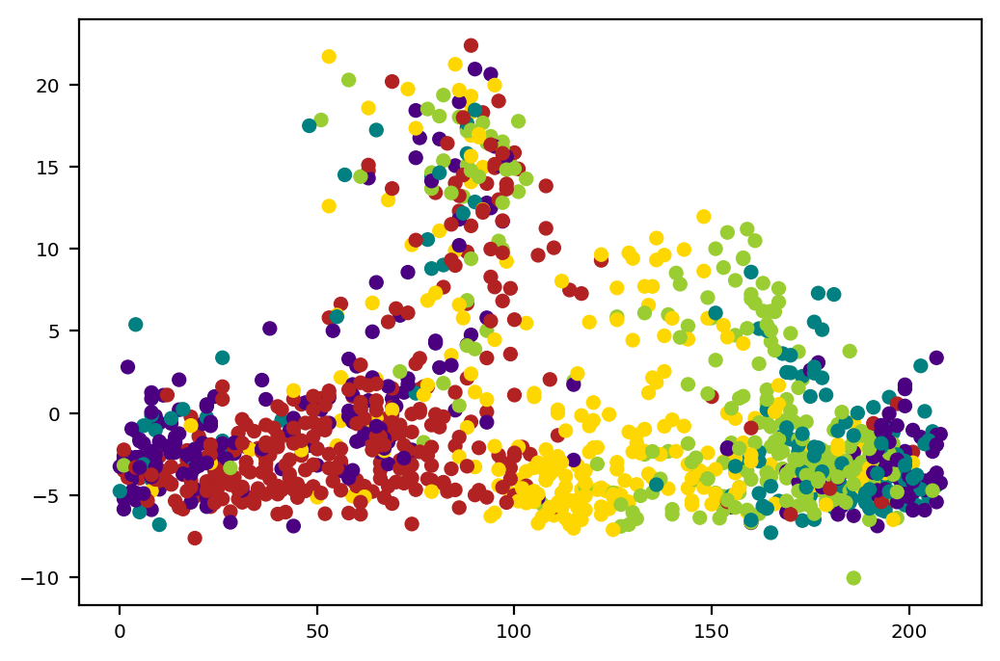

In [403]:
plt.scatter(dose12['RC nneighbor '],
            dose12['DC3'],
            c=dose12['CC'].map(colors3),
            s=25)

In [406]:
#dose12.to_csv("../plots/new_CCC/dose12/" + "DC_dose_12.csv")

In [407]:
#dose12_df = pd.read_csv("../plots/new_CCC/dose12/" + "DC_dose_12.csv", index_col=0)

# Obtain vector field

In [410]:
adata = dyn.read_loom("../../data/processed_possorted_genome_bam_RIG79.loom")
temp = np.empty((len(adata.obs),1), dtype=object)
temp.shape
for i in range(len(adata.obs)):
    temp[i] = str(int(float(adata.obs['dosage'][i])))
adata.obs['dosage'] = temp

In [411]:
additional_boundary_range = 0
i=1
dose = str(doses[i])
dose_adata = adata[(dose == adata.obs['dosage'])]

In [412]:
dose_adata.obs.index = dose_adata.obs['obs_names']

In [413]:
# Finding intersecting indexes between revelio and dataset
dose_index = dose_adata.obs.index
cc_index = dose12_df.index
cells_intersect = np.intersect1d(dose_index, cc_index)

In [414]:
new_adata = dose_adata[cells_intersect,:]
new_adata.obs.index = new_adata.obs['obs_names']
dose12_df = dose12_df.reindex(new_adata.obs.index)

cols = dose12_df.columns[2:9].tolist()
cols.insert(0, 'RC nneighbor ')

coords = np.array(dose12_df[cols])

dose12 = dose_adata[dose12_df.index,:]

In [415]:
dyn.pp.recipe_monocle(dose12, n_top_genes=2000, keep_filtered_genes=True)
dyn.tl.dynamics(dose12, model='deterministic', cores=3)
dyn.tl.reduceDimension(dose12, kwargs={})

|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...


{'filter_bool': None, 'layer': 'all', 'min_cell_s': 12.280000000000001, 'min_cell_u': 6.140000000000001, 'min_cell_p': 6.140000000000001, 'min_avg_exp_s': 0, 'min_avg_exp_u': 0, 'min_avg_exp_p': 0, 'max_avg_exp': inf, 'min_count_s': 0, 'min_count_u': 0, 'min_count_p': 0, 'shared_count': 30}


|-----> calculating size factor...


                      Accession  Chromosome       End     Start Strand  \
0             ENSG00000278704.1  GL000009.2     58376     56140      -   
1             ENSG00000277400.1  GL000194.1    115018     53590      -   
2             ENSG00000274847.1  GL000194.1    115055     53594      -   
3             ENSG00000277428.1  GL000195.1     37534     37434      -   
4             ENSG00000276256.1  GL000195.1     49164     42939      -   
...                         ...         ...       ...       ...    ...   
60663   ENSG00000237040.6_PAR_Y           Y  57062405  57062156      +   
60664  ENSG00000124333.16_PAR_Y           Y  57130289  57067865      +   
60665  ENSG00000124334.17_PAR_Y           Y  57197337  57184101      +   
60666   ENSG00000270726.6_PAR_Y           Y  57208756  57190738      +   
60667  ENSG00000182484.15_PAR_Y           Y  57212230  57207346      +   

          var_names  nCells  nCounts  pass_basic_filter  
0        BX004987.1       0      0.0              Fal

|-----> selecting genes...


None
{'min_expr_cells': 0, 'min_expr_avg': 0, 'max_expr_avg': inf, 'svr_gamma': None, 'winsorize': False, 'winsor_perc': (1, 99.5), 'sort_inverse': False}
sort by:  SVR
adata shape:  (1228, 60668)
adata shape:  (1228, 6121)
layer:  X
CM:  (1228, 6121)
CM:  (1228, 6121)
detected_bool:  [ True  True  True ...  True  True  True]
valid CM:  (1228, 6121)
mu:  [0.10658254 1.3973233  0.8497787  ... 0.26154426 0.58743745 0.20244311]
mu shape:  (6121,)
log_m:  [-3.2299569   0.4826658  -0.2348409  ... -1.934873   -0.76749283
 -2.3044116 ]


|-----> <insert> frac to var in AnnData Object.


sort by:  SVR
adata shape:  (1228, 60668)
adata shape:  (1228, 2000)
layer:  X
CM:  (1228, 2000)
CM:  (1228, 2000)
detected_bool:  [ True  True  True ...  True  True  True]
valid CM:  (1228, 2000)
mu:  [ 0.01251926 10.571889    0.14298573 ...  0.7367362   1.3405329
  0.12091074]
mu shape:  (2000,)
log_m:  [-6.3197064   3.4021614  -2.806057   ... -0.44078     0.42280662
 -3.0479858 ]


|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <insert> ntr to obs in AnnData Object.
|-----> <insert> ntr to var in AnnData Object.
|-----> cell cycle scoring...
|-----> computing cell phase...
|-----? 
Dynamo is not able to perform cell cycle staging for you automatically. 
Since dyn.pl.phase_diagram in dynamo by default colors cells by its cell-cycle stage, 
you need to set color argument accordingly if confronting errors related to this.
|
|-----> [recipe_monocle preprocess] finished [8.6366s]
|-----> calculating first/second moments begins...


X shape:  (1228, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.1
n_components:  2


|
|-----> [moments calculation] finished [13.9794s]
|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...


{'kwargs': {}}
{'n_components': 2, 'metric': 'euclidean', 'min_dist': 0.5, 'spread': 1.0, 'n_epochs': 0, 'alpha': 1.0, 'gamma': 1.0, 'negative_sample_rate': 5, 'init_pos': 'spectral', 'random_state': 0, 'densmap': False, 'dens_lambda': 2.0, 'dens_frac': 0.3, 'dens_var_shift': 0.1, 'output_dens': False, 'verbose': False}
X shape:  (1228, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.5
n_components:  2


|
|-----> [dimension_reduction projection] finished [6.1618s]


In [416]:
dose12.obsm['X_DC'] = np.array(dose12_df[['DC1','DC2','DC3','DC4','DC5','DC6','DC7','DC8','DC9','DC10']])

In [418]:
dyn.tl.cell_wise_confidence(dose12)
dose12.obs.index = dose12.obs['obs_names']

X shape:  (1228, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.1
n_components:  2


In [422]:
dose12.obsm['X_RC'] = np.array(dose12_df[['RC nneighbor ','DC3']].reindex(dose12.obs.index))

In [423]:
dyn.tl.cell_velocities(dose12, basis = 'RC', enforce = True, method='pearson', other_kernels_dict={'transform': 'sqrt'}, correct_density = True)
dyn.vf.VectorField(dose12, basis='RC', M=1000)
#dyn.vf.topography(dose0, basis='RC_adj')

|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [2.1032s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.6384s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: RC. 
        Vector field will be learned in the RC space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.


V_emb:  (1228, 2)
neighs:  [[ 563  980  846 ...  771 1215  880]
 [ 563  634   14 ...  262  898  771]
 [ 634  131  719 ... 1215 1085   76]
 ...
 [ 394  366 1167 ...  485  693  972]
 [ 366  394 1167 ...  265   24  299]
 [ 366  394  506 ... 1115 1002  644]]
X_grid:  (2500, 2)
V_grid:  (2500, 2)
mass:  [[1.70469606e-04 3.01353455e-03 8.08078131e-03 ... 2.85353400e-01
  7.21407130e-02 1.34922401e-03]
 [1.12670761e-03 1.98491916e-02 4.66717926e-02 ... 1.77006415e+00
  4.90411147e-01 1.05767890e-02]
 [5.74331632e-03 1.00573939e-01 2.10402916e-01 ... 8.33765579e+00
  2.58355472e+00 6.40673048e-02]
 ...
 [7.39163283e-41 3.72275455e-36 1.18036445e-36 ... 1.30882438e-46
  5.23484082e-44 3.93424794e-45]
 [6.56008413e-44 3.30394969e-39 1.04757505e-39 ... 3.95397009e-50
  1.93826034e-47 1.45682649e-48]
 [4.35225784e-47 2.19199033e-42 6.95008878e-43 ... 8.94514286e-54
  5.36493000e-51 4.03264617e-52]]
min_mass:  1e-05
cutoff:  (50, 50)
V_grid: (2, 50, 50)
cutoff:  [[ True  True False ... False False 

|-----> <insert> velocity_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_RC to uns in AnnData Object.
|-----> <insert> control_point_RC to obs in AnnData Object.
|-----> <insert> inlier_prob_RC to obs in AnnData Object.
|-----> <insert> obs_vf_angle_RC to obs in AnnData Object.
|
|-----> [VectorField] finished [8.7544s]


In [424]:
i=1
additional_boundary_range = 0
CC = dose12_df['CC']
CC.index = dose12.obs.index
dose12.obs['CC'] = CC

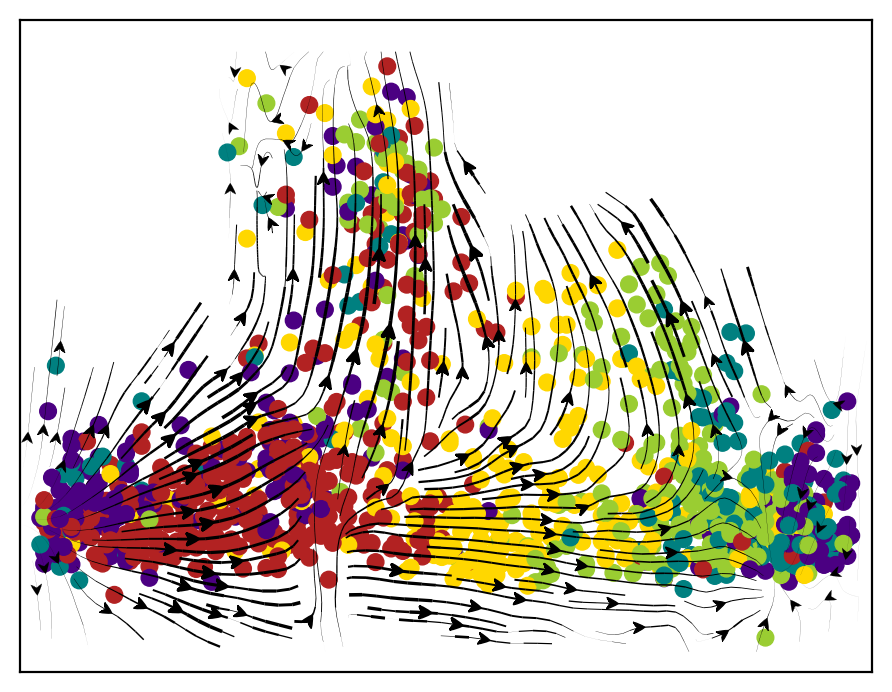

In [426]:
plt.figure(figsize=(4.5,3.5))
plt.scatter(dose12.obsm['X_RC'][:,0],
            dose12.obsm['X_RC'][:,1],
            c=dose12.obs['CC'].map(colors3))
dyn.pl.zstreamline(dose12, basis='RC')
plt.ylim(-12, 25)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/dose12/cc_emt_rep/dose12_vf.png", dpi=300)

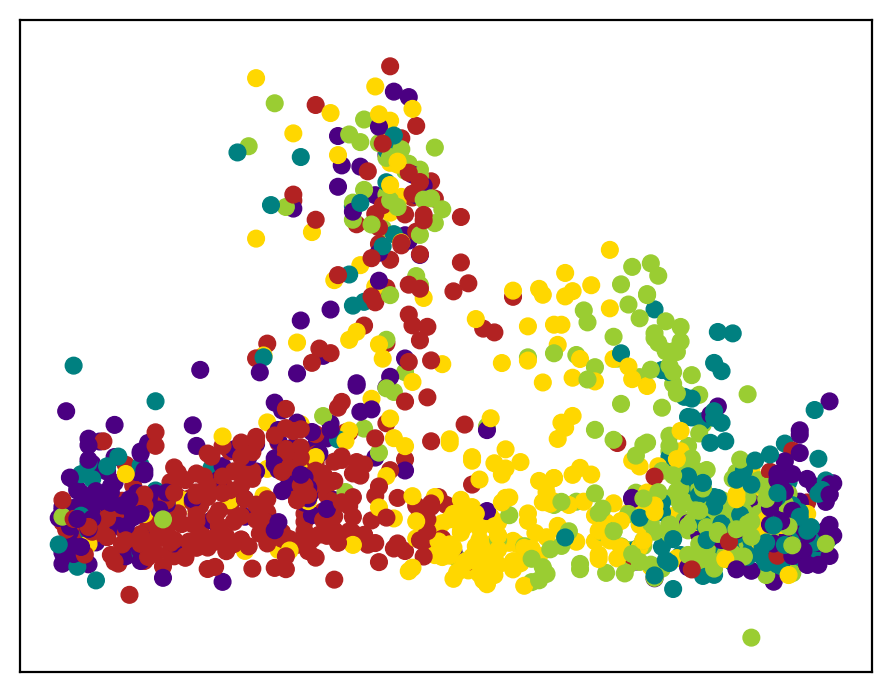

In [451]:
plt.figure(figsize=(4.5,3.5))
plt.scatter(dose12.obsm['X_RC'][:,0],
            dose12.obsm['X_RC'][:,1],
            c=dose12.obs['CC'].map(colors3))
#dyn.pl.zstreamline(dose12, basis='RC')
plt.ylim(-12, 25)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/dose12/cc_emt_rep/dose12_CC_EMT.png", dpi=300)

# Plot expression

In [427]:
X_data = dose12.X.toarray()

In [428]:
dose12.var.index = dose12.var['var_names']

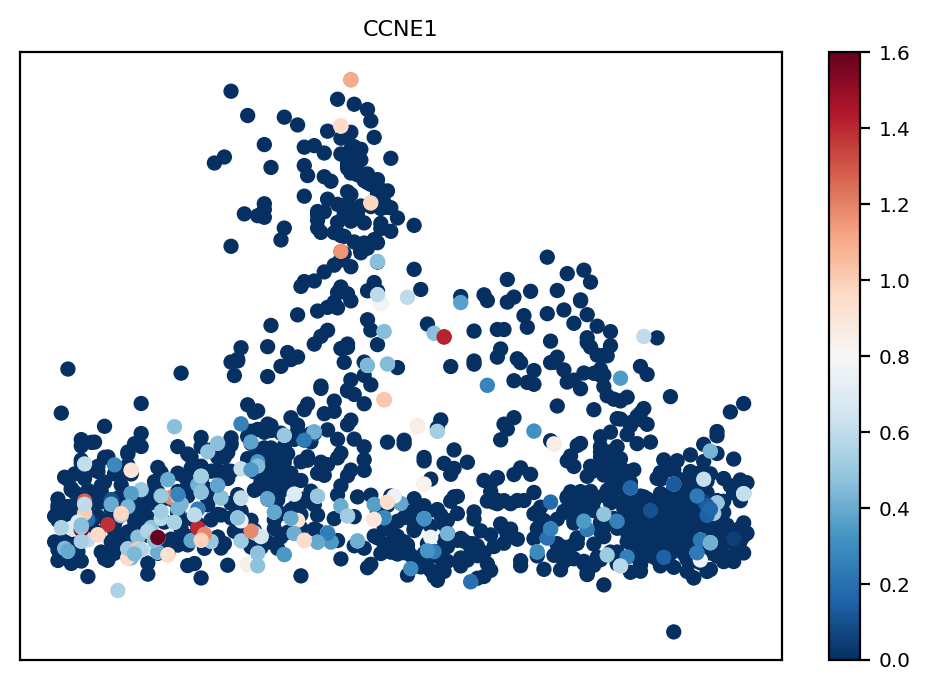

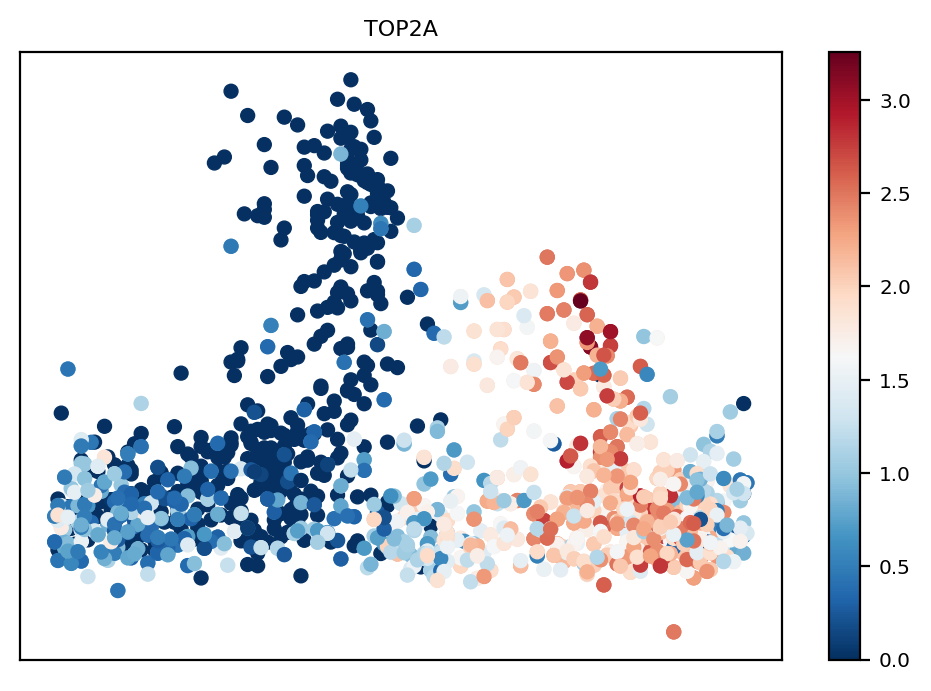

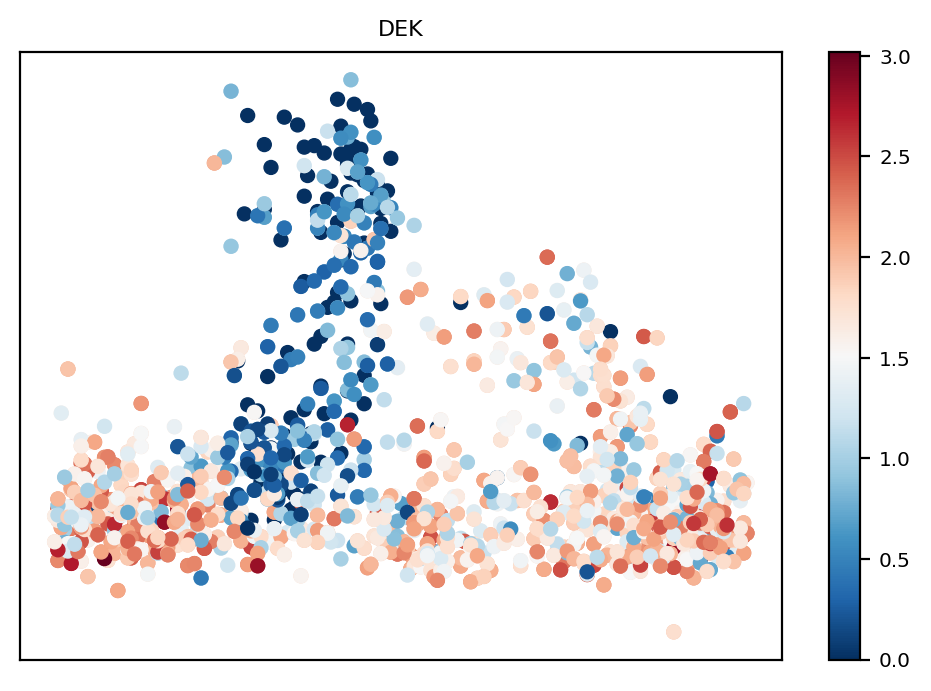

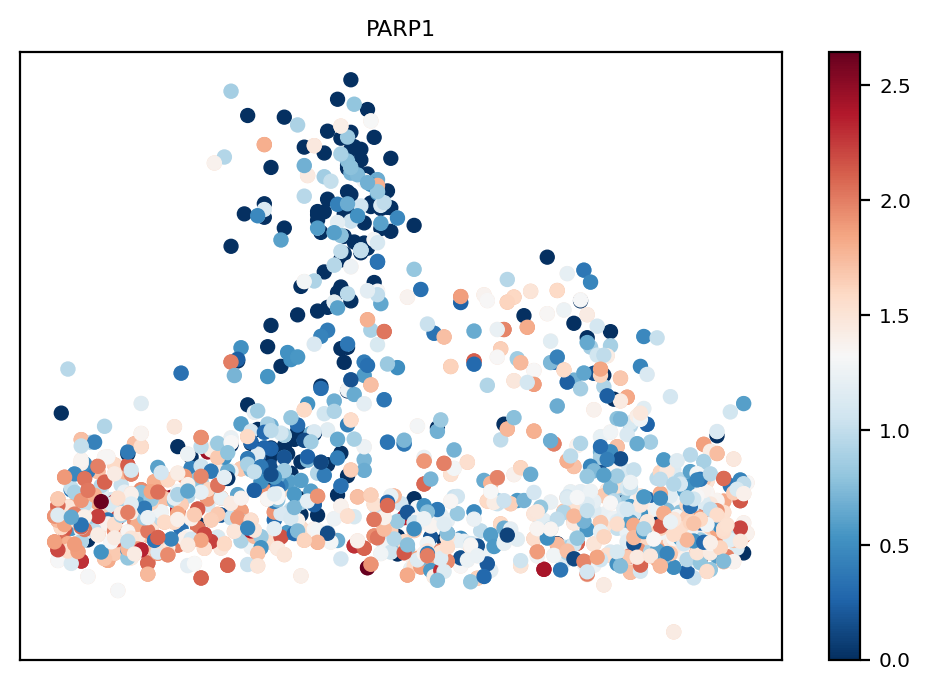

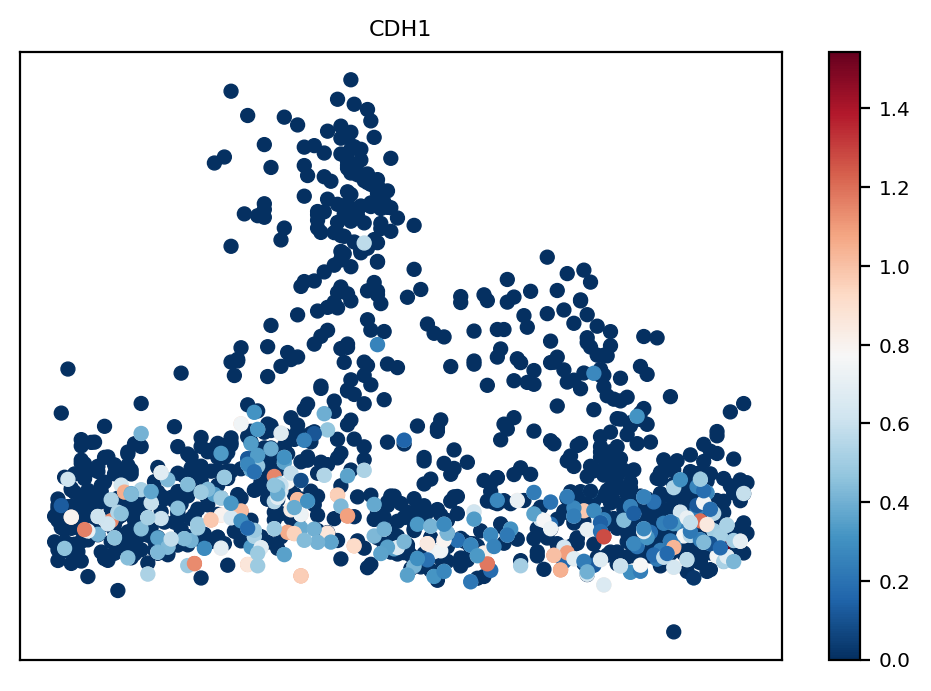

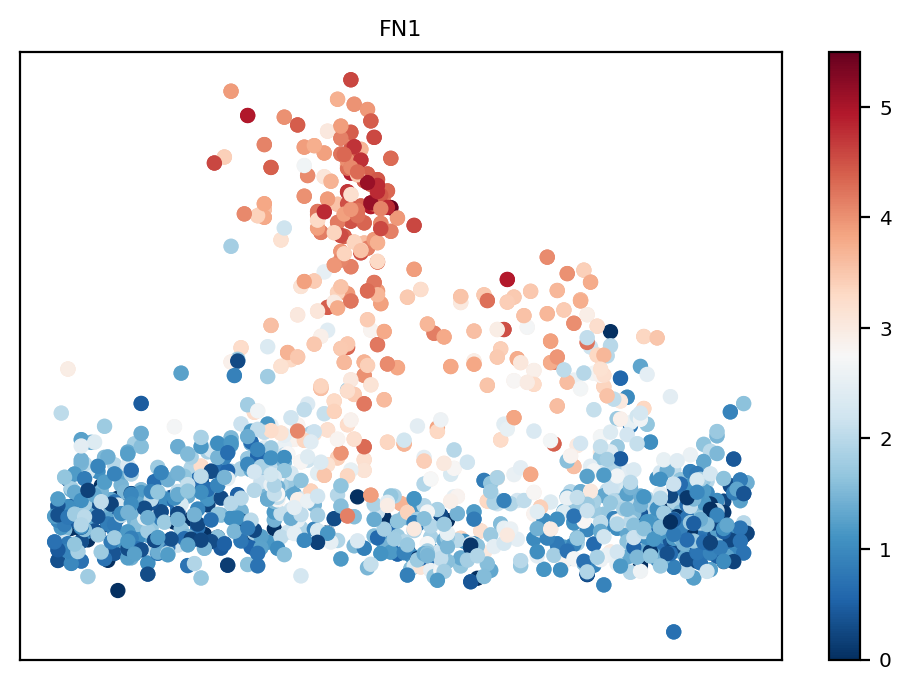

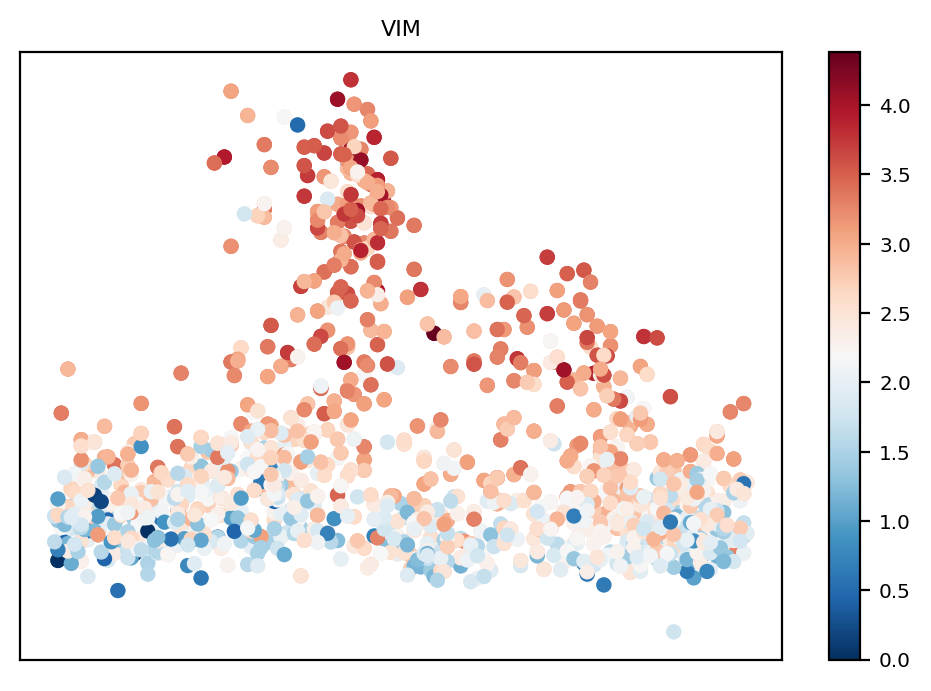

In [431]:
genes = ['CCNE1','TOP2A','DEK','PARP1','CDH1','FN1','VIM']
for gene in genes:
    gene_index = dose12.var.index.get_loc(gene)
    plt.figure(figsize=(5,3.5))
    plt.scatter(dose12.obsm['X_RC'][:,0],
                dose12.obsm['X_RC'][:,1],
                c=X_data[:,gene_index], s=25)
    temp = X_data[:,gene_index] > 0
    plt.colorbar()
    plt.scatter(dose12.obsm['X_RC'][temp,0],
                dose12.obsm['X_RC'][temp,1],
                c=X_data[temp,gene_index], s=25)
    plt.xticks([])
    plt.yticks([])
    plt.title(gene)
    plt.tight_layout()
    #plt.savefig("../plots/new_CCC/dose12/cc_emt_rep/dose12_"+gene+"_exp.png", dpi=300)
    plt.show()

# Trajectory simulation setup

In [454]:
start_pos = list(np.where(dose12.obsm['X_RC'][:,1] < -2.5)[0])
targets = list(np.where(dose12.obsm['X_RC'][:,1] > 5)[0])

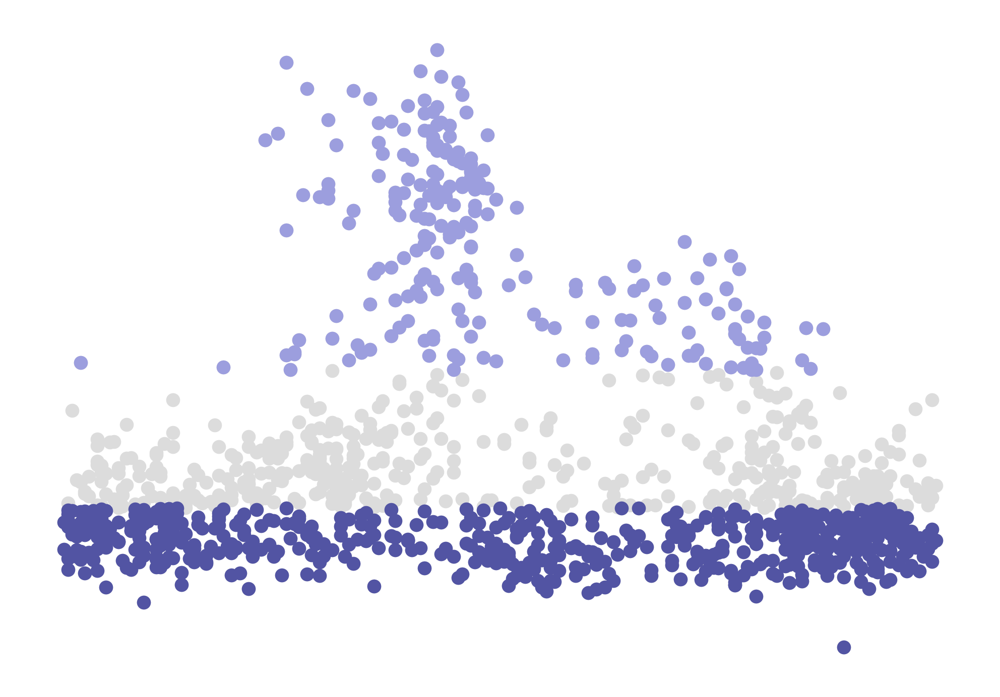

In [458]:
cmap = plt.cm.get_cmap("tab20b")
plt.figure(figsize=(5,3.5), dpi=200)
plt.subplot(1,1,1,frame_on=False)
plt.scatter(dose12.obsm['X_RC'][:,0],
            dose12.obsm['X_RC'][:,1],
            s=20,
            color='gainsboro')
plt.scatter(dose12.obsm['X_RC'][start_pos,0],
            dose12.obsm['X_RC'][start_pos,1],
            color=cmap(1),
            #color=(68,43,132),
            label='potential start points',
            s=20)
plt.scatter(dose12.obsm['X_RC'][targets,0],
            dose12.obsm['X_RC'][targets,1],
            color=cmap(3),
            label='potential end points',
            s=20)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/dose12/cc_emt_rep/dose12_trajectory_setup.png", dpi=300)

# Plot trajectories

In [460]:
with open('rerun_traj_simulations_final/dose12/k10_100_trajs_test.pkl', 'rb') as f:
    traj_list = pickle.load(f)

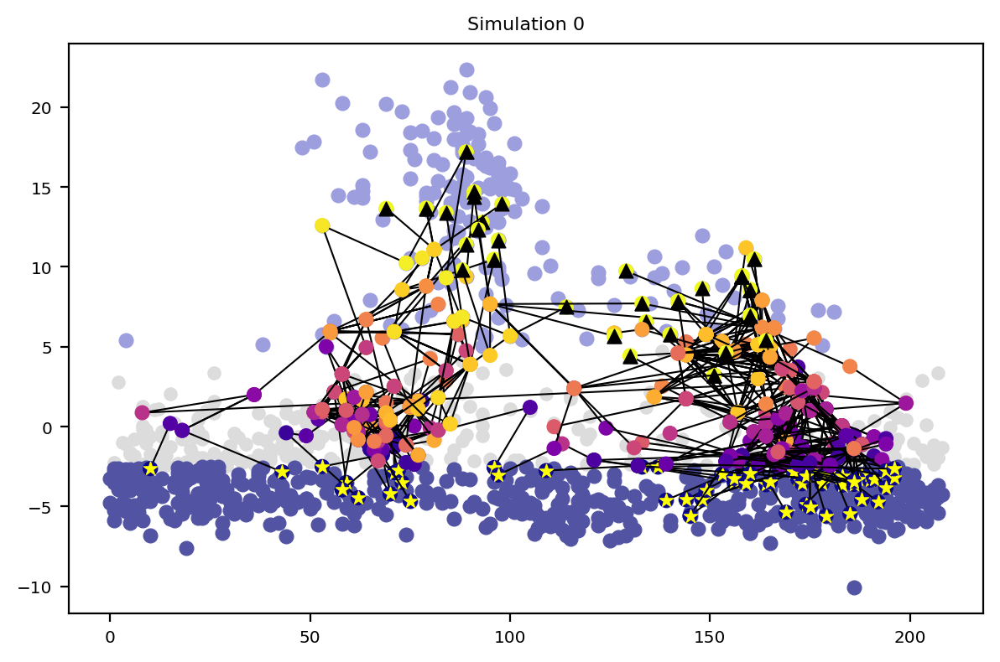

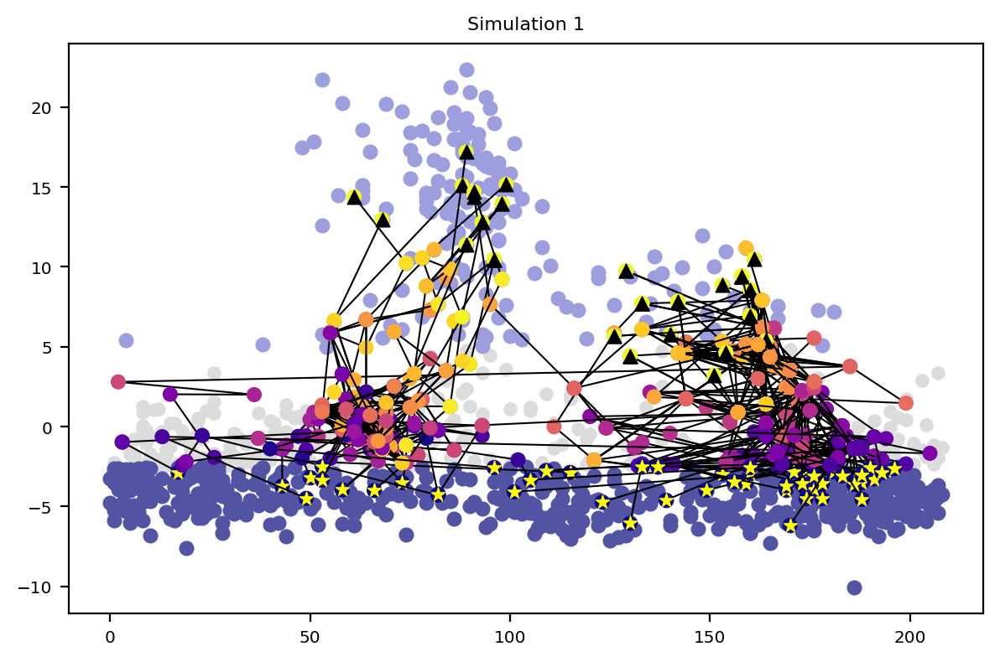

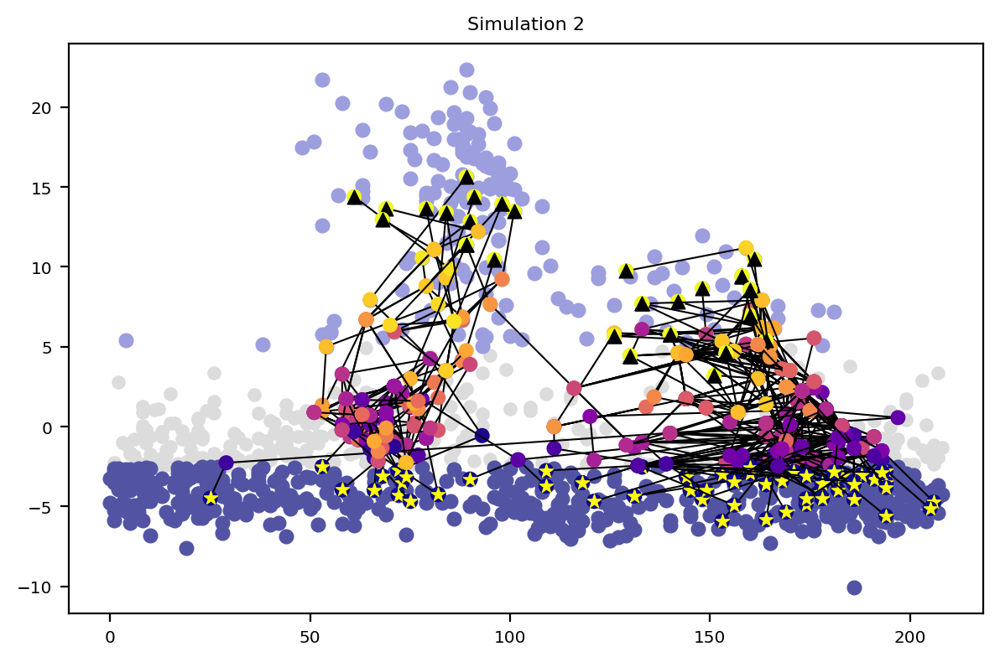

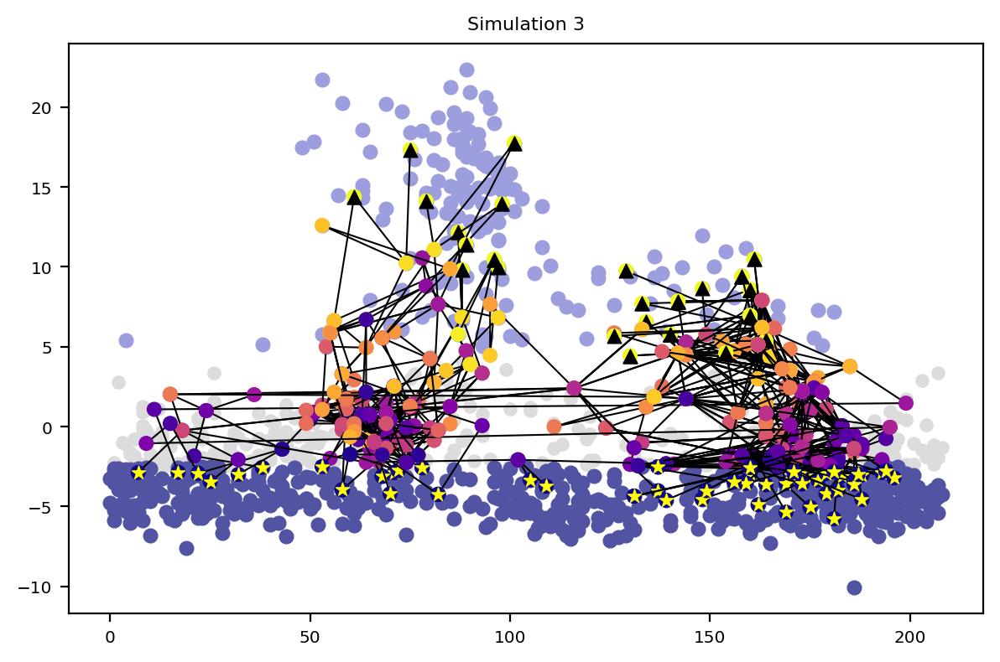

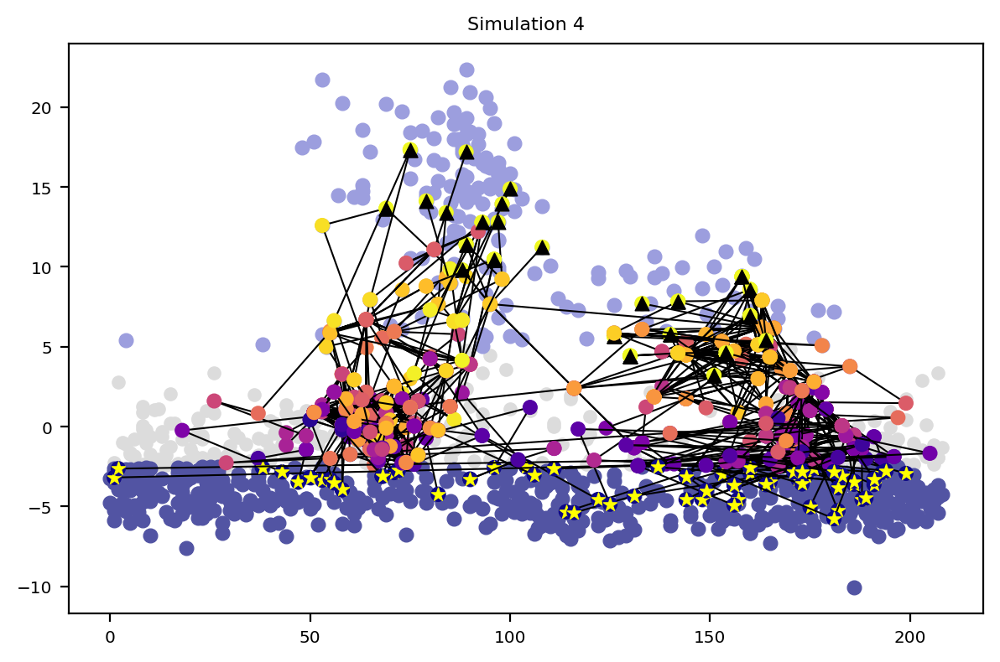

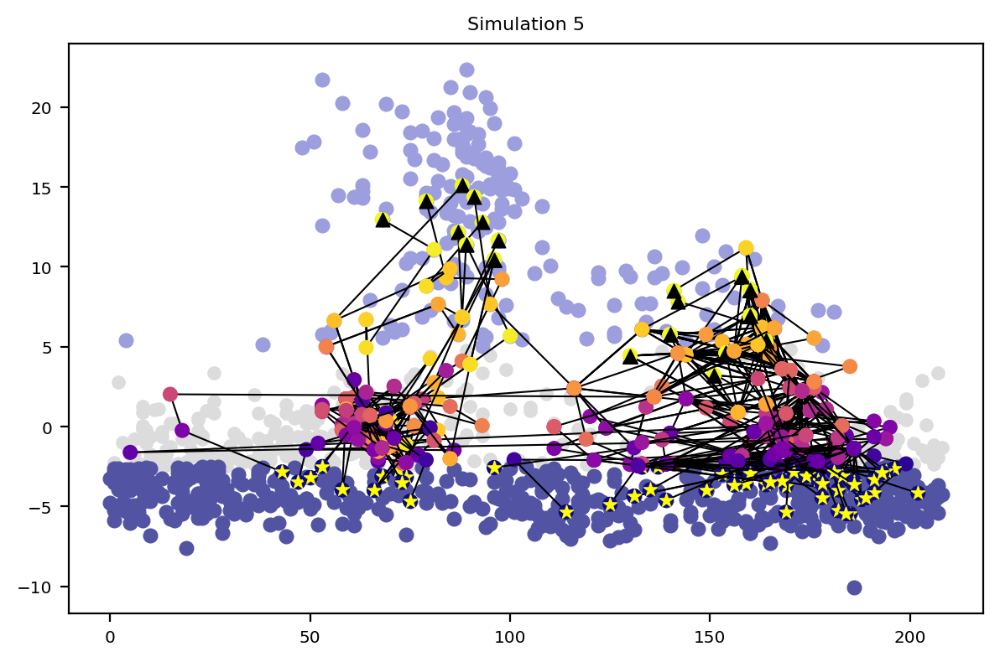

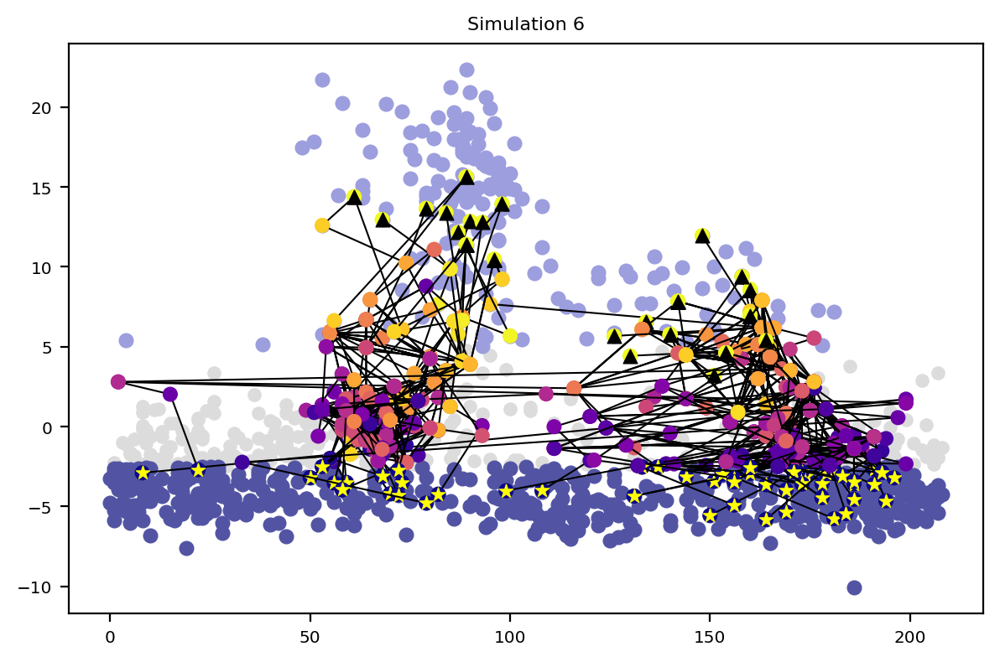

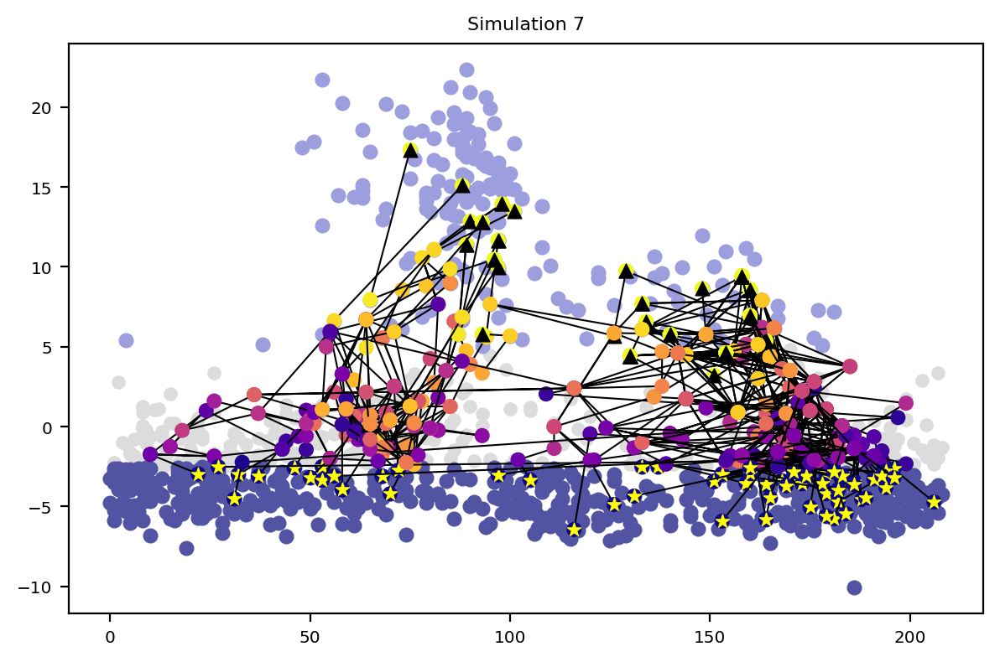

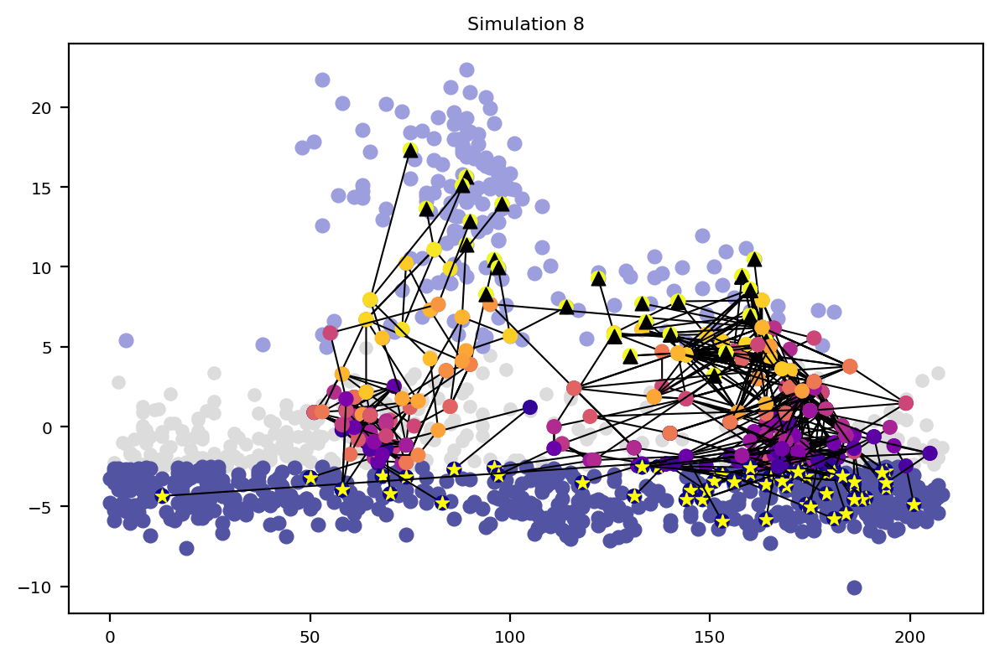

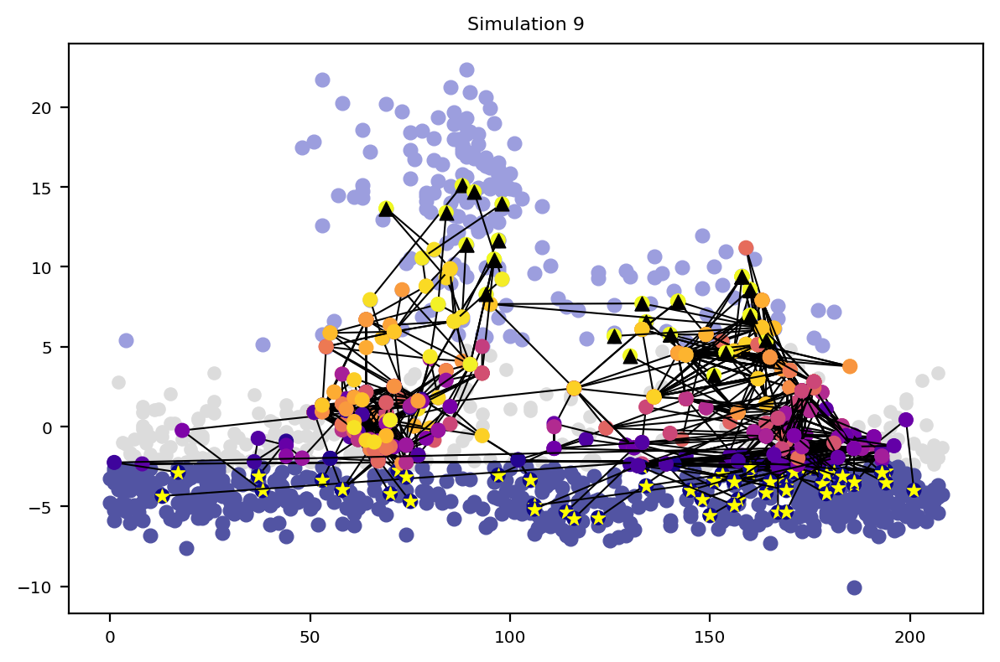

In [462]:
for i in range(len(traj_list)):
    plt.scatter(dose12.obsm['X_RC'][:,0],
                dose12.obsm['X_RC'][:,1],
                s=30,
                color='gainsboro', zorder=1)
    plt.scatter(dose12.obsm['X_RC'][start_pos,0],
                dose12.obsm['X_RC'][start_pos,1],
                color=cmap(1),
                label='potential start points')
    plt.scatter(dose12.obsm['X_RC'][targets,0],
                dose12.obsm['X_RC'][targets,1],
                color=cmap(3),
                label='potential end points')
    for traj in traj_list[i]:
        plt.plot(dose12.obsm['X_RC'][traj,0],
                 dose12.obsm['X_RC'][traj,1],
                 color='black', 
                 linewidth=0.75,
                 zorder=2)
        plt.scatter(dose12.obsm['X_RC'][traj,0],
                    dose12.obsm['X_RC'][traj,1],
                    c=range(len(traj)),
                    cmap='plasma',
                    zorder=2)
        plt.scatter(dose12.obsm['X_RC'][traj[0],0],
                    dose12.obsm['X_RC'][traj[0],1],
                    marker='*',
                    color='yellow',
                    zorder=2)
        plt.scatter(dose12.obsm['X_RC'][traj[-1],0],
                    dose12.obsm['X_RC'][traj[-1],1],
                    marker='^',
                    color='black',
                    zorder=2)
    plt.title("Simulation " + str(i))
    plt.tight_layout()
    #plt.savefig("../plots/new_CCC/dose12/traj_sims/"+str(i)+"_all_trajs.png", dpi=300)
    plt.show()

# Plot representative trajectories

In [465]:
from scipy.sparse.csgraph import dijkstra
import random
from sklearn.manifold import MDS
from tslearn.clustering import TimeSeriesKMeans
from sklearn.manifold import TSNE
from tslearn.utils import to_time_series_dataset
from scipy.interpolate import interp1d
import copy
from scipy.spatial import distance

In [463]:
coords_DC_list = []
for j in range(len(traj_list)):
    coords_DC = []
    for i in range(len(traj_list[j])):
        coords_DC.append(dose12.obsm['X_DC'][traj_list[j][i],:10])
    coords_DC_list.append(coords_DC)

In [469]:
model_list = []
for i in range(len(coords_DC_list)):
    data = to_time_series_dataset(coords_DC_list[i])
    model = TimeSeriesKMeans(n_clusters=2, metric="softdtw", max_iter=10, random_state=0, init='k-means++')
    model.fit(data)
    model.cluster_centers_.shape
    model_list.append(model)

X0: 87
[[ 1.98731189e+00  3.46401999e+00 -3.45494636e+00 -3.27579227e-01
   3.44202925e-02  1.67589566e+00  1.16852331e-01 -5.67492024e-01
   8.30257723e-02  7.62481604e-01]
 [ 1.24741365e+00  4.69322640e+00 -8.84161575e-01 -1.59109800e+00
   7.06306317e-01  8.34013565e-01  1.51788654e-01 -7.86355829e-01
   2.47785185e-01  4.15389216e-01]
 [ 5.07515405e-01  5.92243281e+00  1.68662321e+00 -2.85461677e+00
   1.37819234e+00 -7.86853329e-03  1.86724977e-01 -1.00521963e+00
   4.12544597e-01  6.82968289e-02]
 [-2.32382837e-01  7.15163921e+00  4.25740799e+00 -4.11813553e+00
   2.05007837e+00 -8.49750632e-01  2.21661301e-01 -1.22408344e+00
   5.77304009e-01 -2.78795558e-01]
 [-9.72281079e-01  8.38084562e+00  6.82819278e+00 -5.38165430e+00
   2.72196439e+00 -1.69163273e+00  2.56597624e-01 -1.44294724e+00
   7.42063422e-01 -6.25887946e-01]]


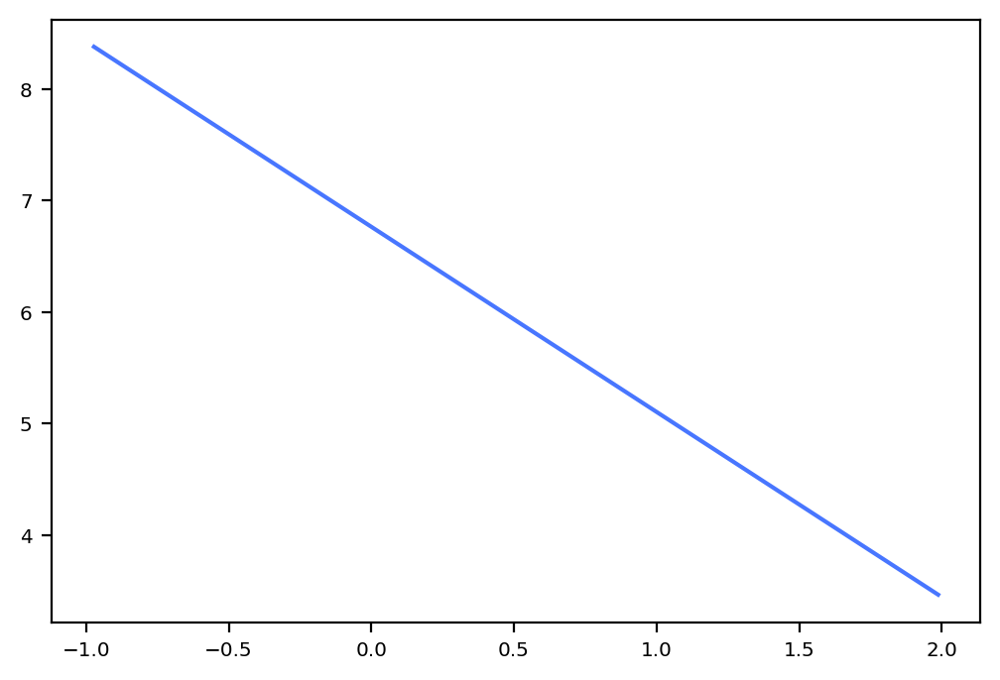

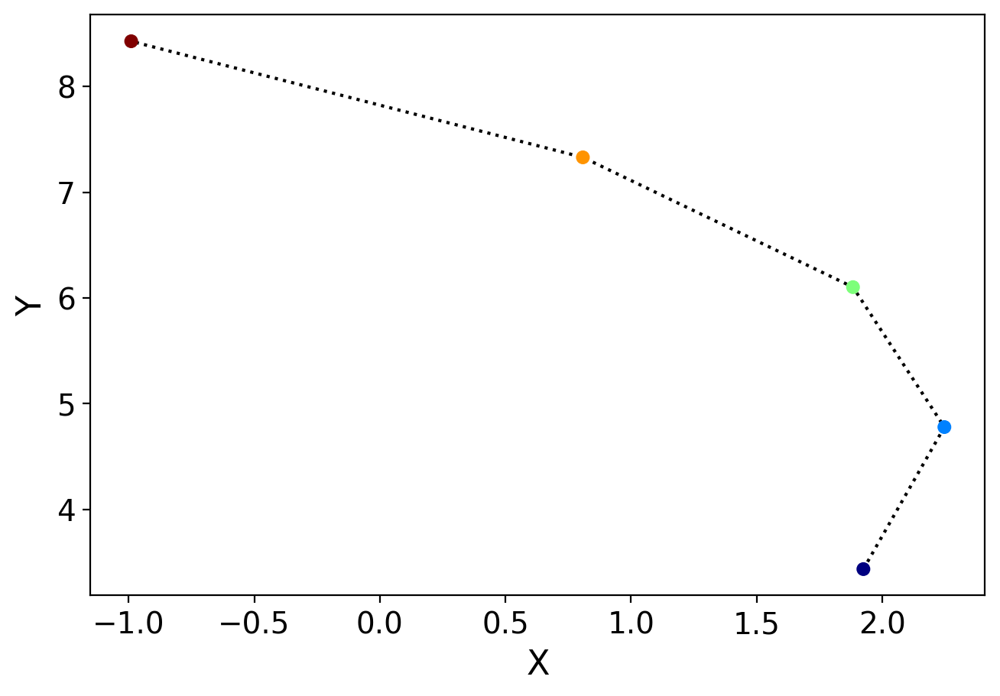

True


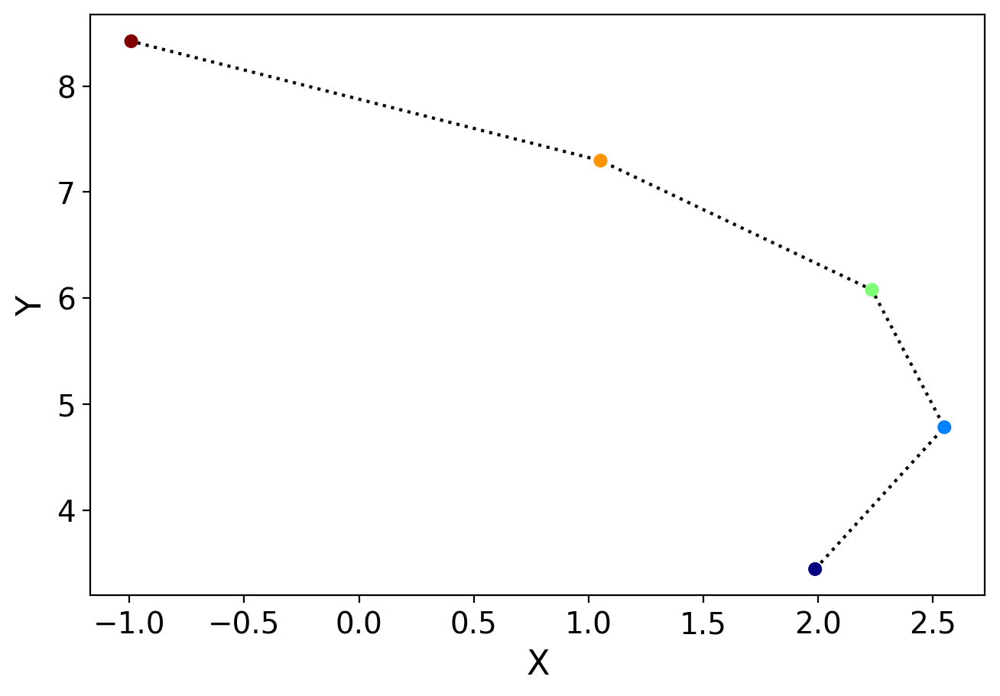

True


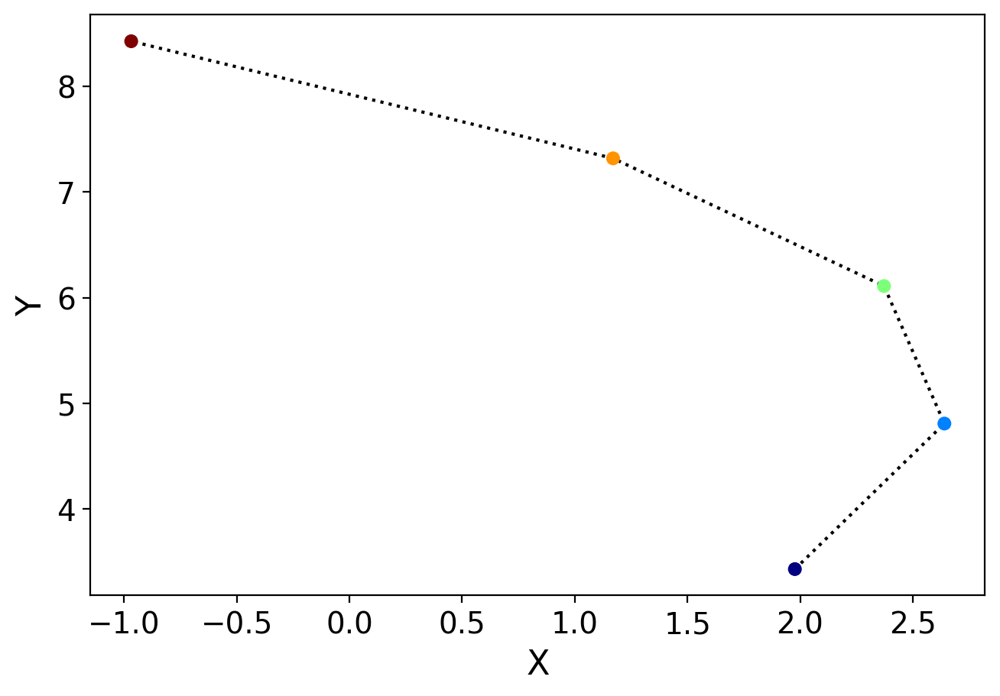

True


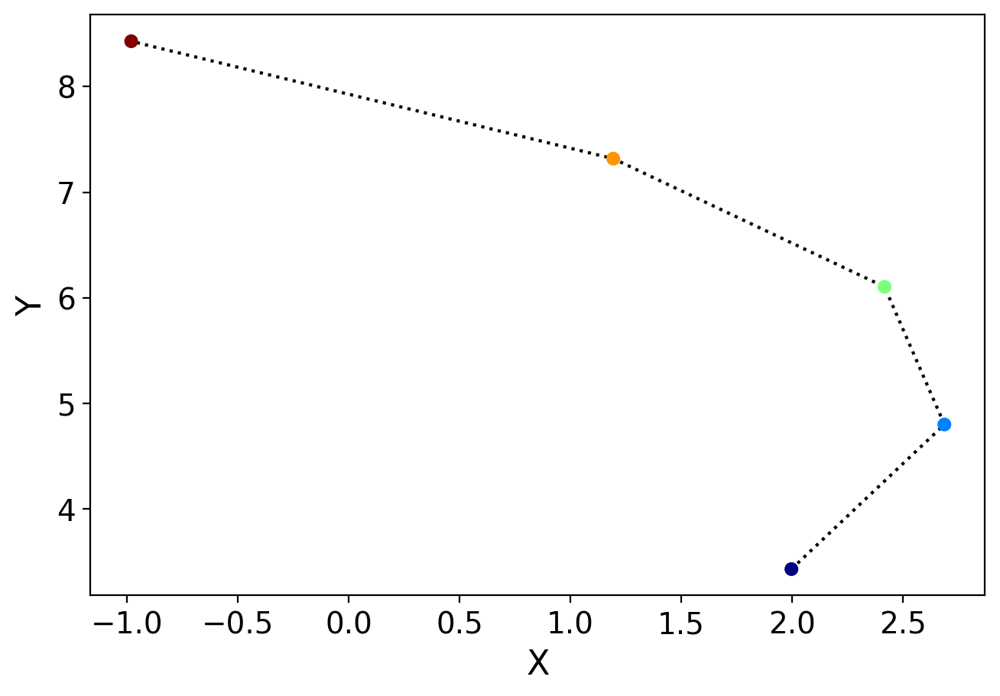

True


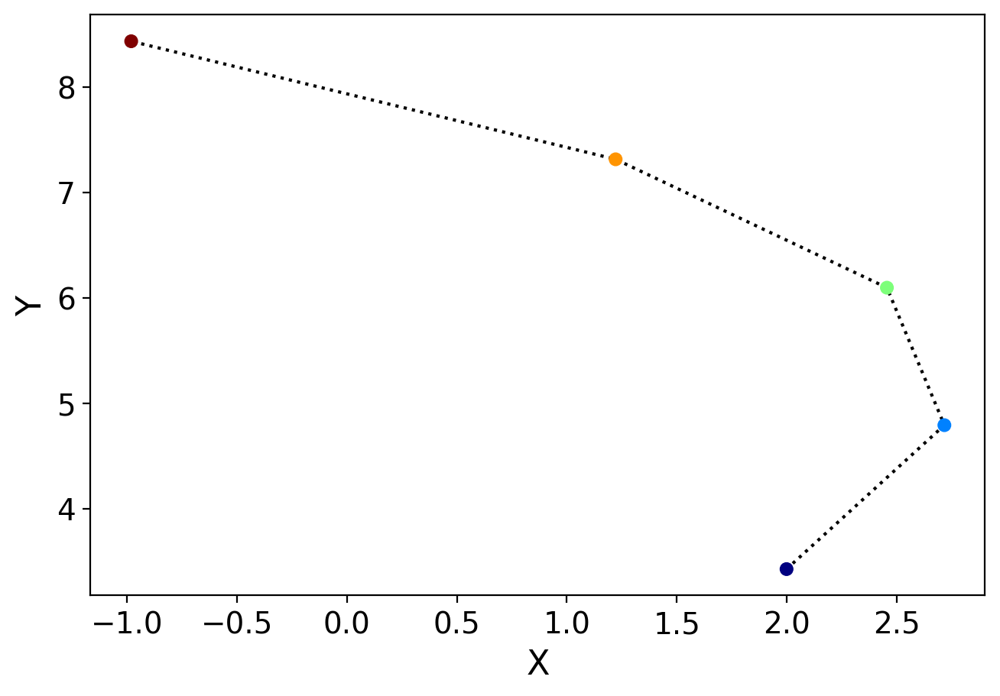

True


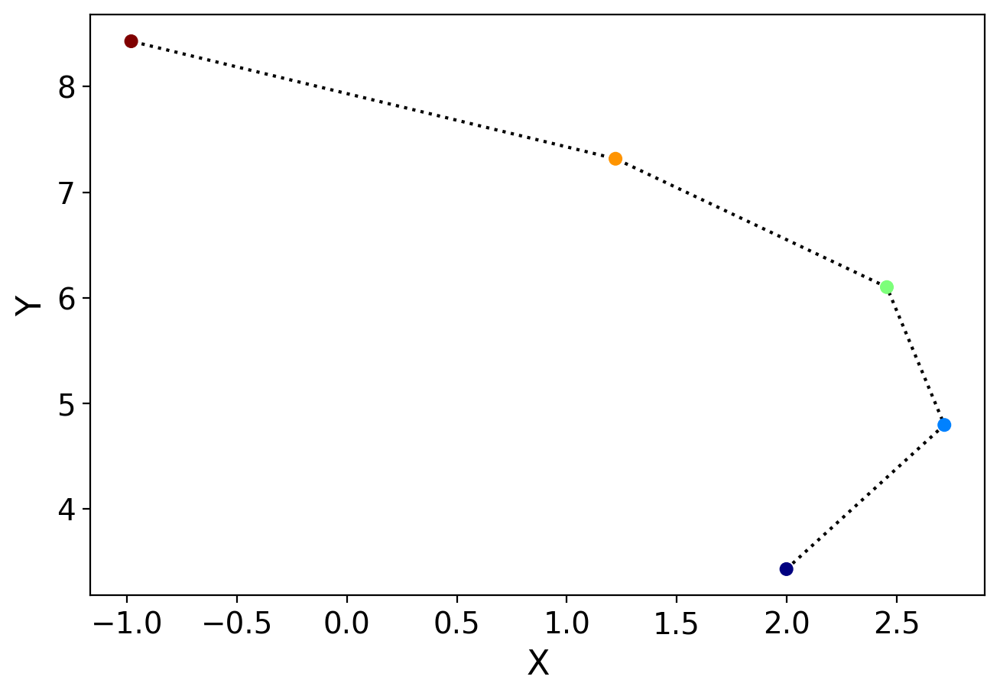

True


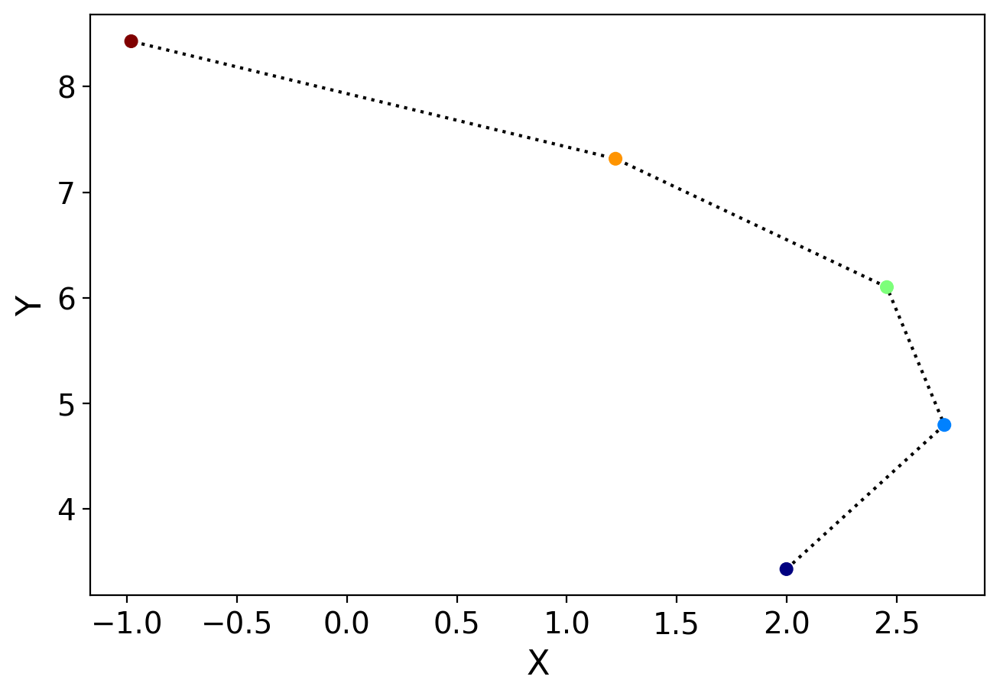

False
X0: 13
[[-3.21298609 -5.58810879 -3.5297989   4.44272001 -0.3467388  -3.53218231
  -0.24655242  0.54008958 -1.42695622  0.69657409]
 [-3.78873727 -4.71940062  0.64509862  3.37023762  0.16961231 -4.04156861
   0.10514893  0.4247217  -1.109979    0.20266279]
 [-4.36448845 -3.85069246  4.81999614  2.29775522  0.68596341 -4.5509549
   0.45685028  0.30935382 -0.79300177 -0.29124851]
 [-4.94023963 -2.9819843   8.99489366  1.22527282  1.20231452 -5.0603412
   0.80855163  0.19398593 -0.47602455 -0.78515981]
 [-5.51599081 -2.11327613 13.16979118  0.15279043  1.71866562 -5.56972749
   1.16025298  0.07861805 -0.15904733 -1.27907111]]


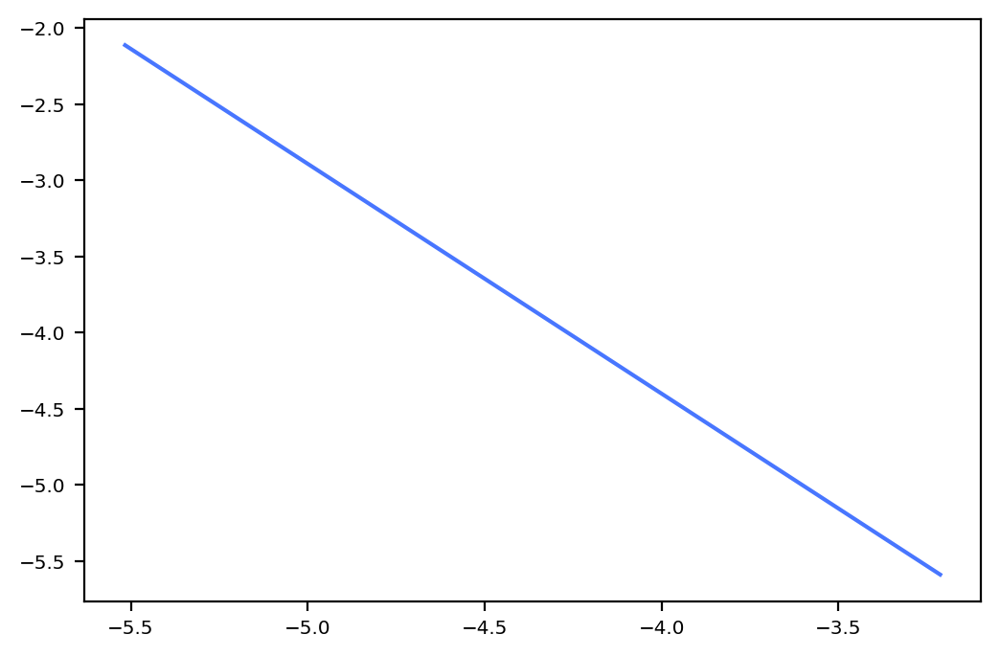

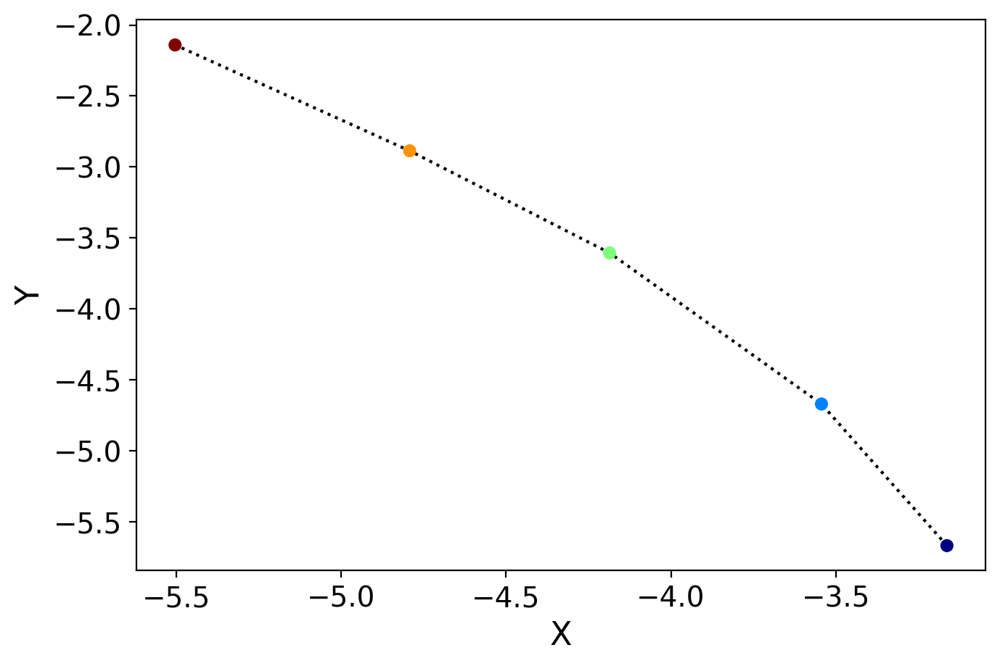

True


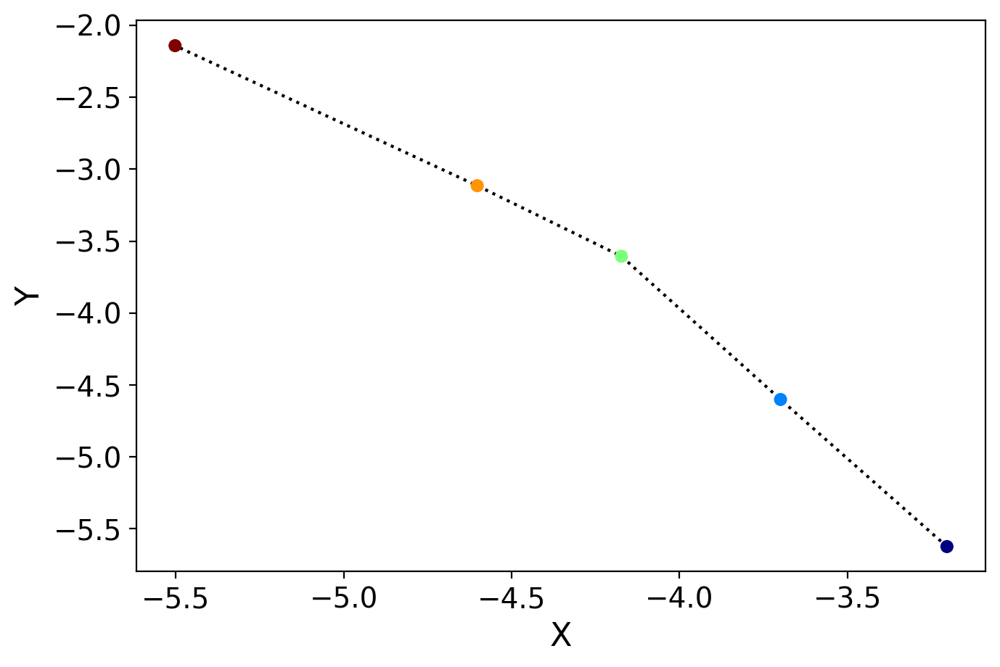

True


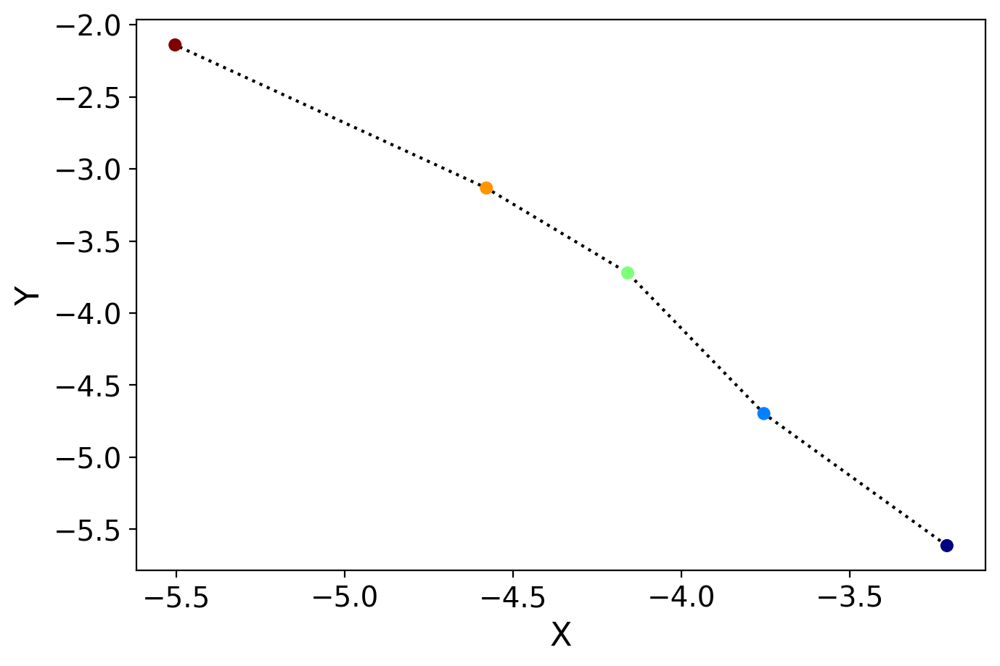

True


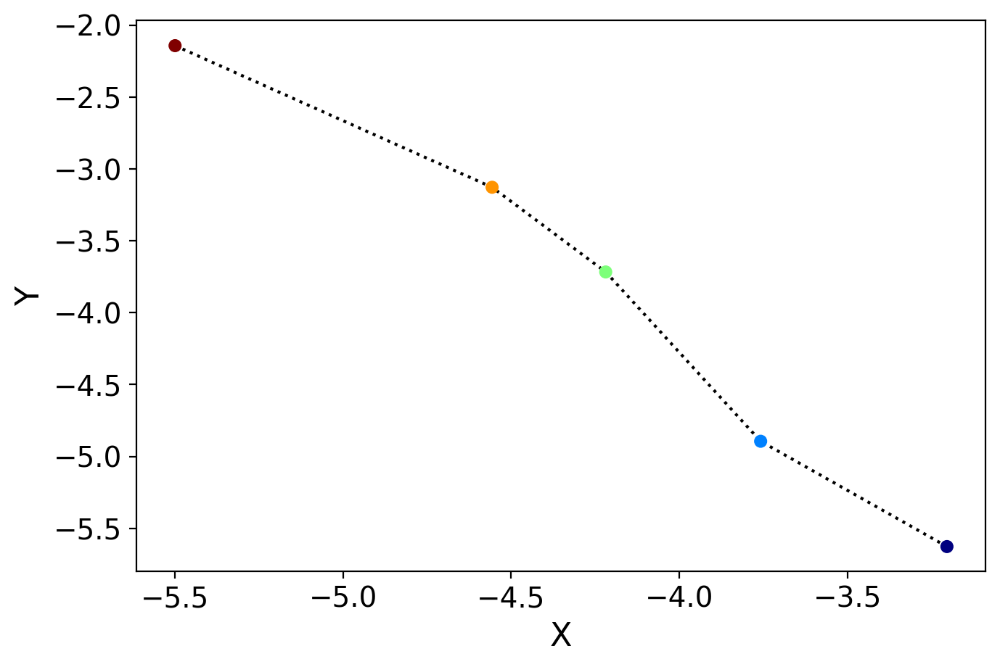

True


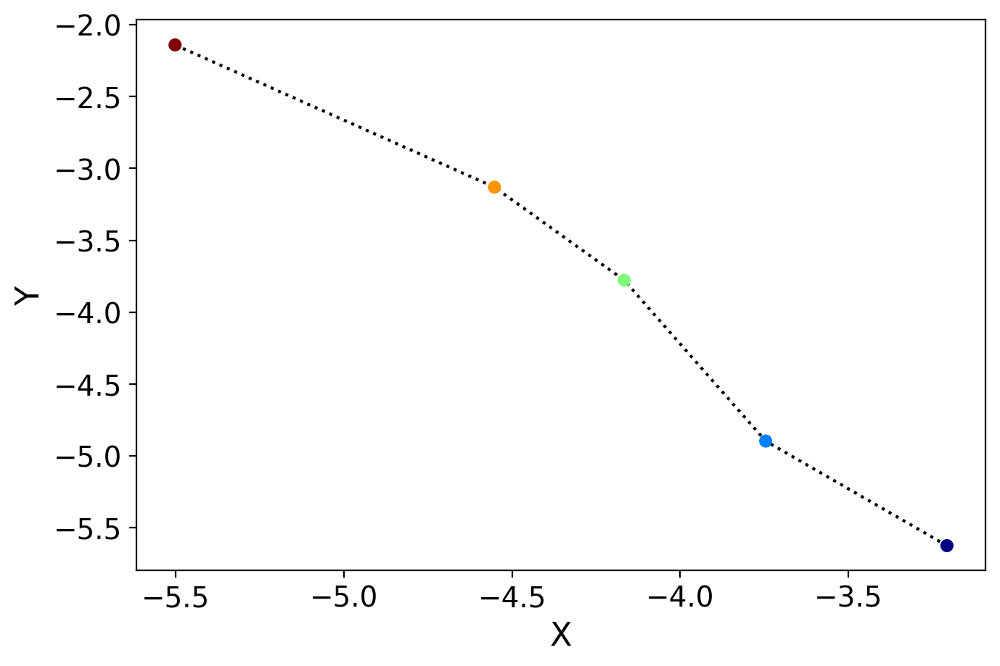

False
X0: 86
[[ 1.72078533e+00  3.37376792e+00 -3.25385750e+00 -6.67269484e-01
   3.03683008e-01  1.81553940e+00  4.75536224e-01 -8.47515555e-01
  -2.13138141e-01  8.38381464e-01]
 [ 1.11092289e+00  4.62373402e+00 -7.67675130e-01 -1.85876774e+00
   9.43051244e-01  1.16727542e+00  4.41896018e-01 -9.37339879e-01
  -3.53725527e-03  5.61844663e-01]
 [ 5.01060450e-01  5.87370011e+00  1.71850723e+00 -3.05026599e+00
   1.58241948e+00  5.19011440e-01  4.08255811e-01 -1.02716420e+00
   2.06063630e-01  2.85307863e-01]
 [-1.08801992e-01  7.12366620e+00  4.20468960e+00 -4.24176424e+00
   2.22178771e+00 -1.29252541e-01  3.74615605e-01 -1.11698853e+00
   4.15664515e-01  8.77106251e-03]
 [-7.18664433e-01  8.37363230e+00  6.69087196e+00 -5.43326249e+00
   2.86115595e+00 -7.77516521e-01  3.40975398e-01 -1.20681285e+00
   6.25265401e-01 -2.67765738e-01]]


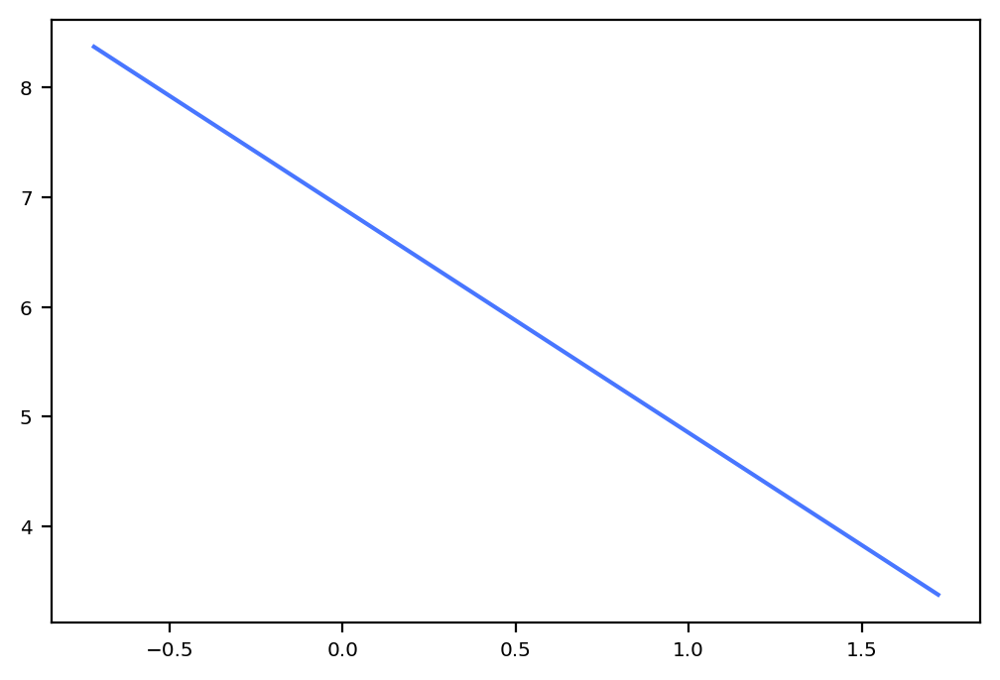

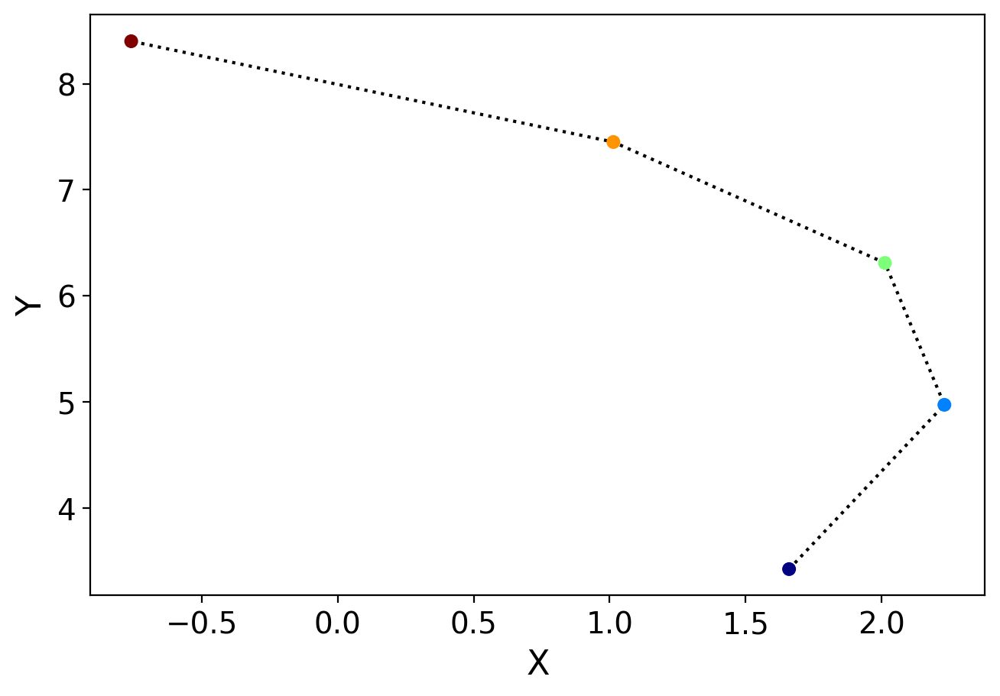

True


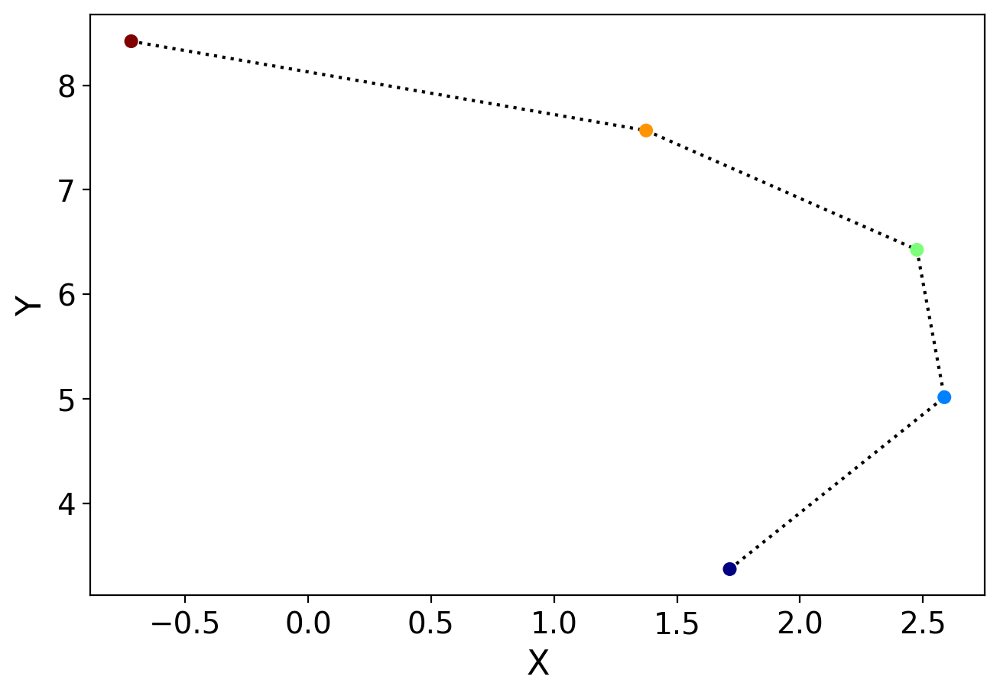

True


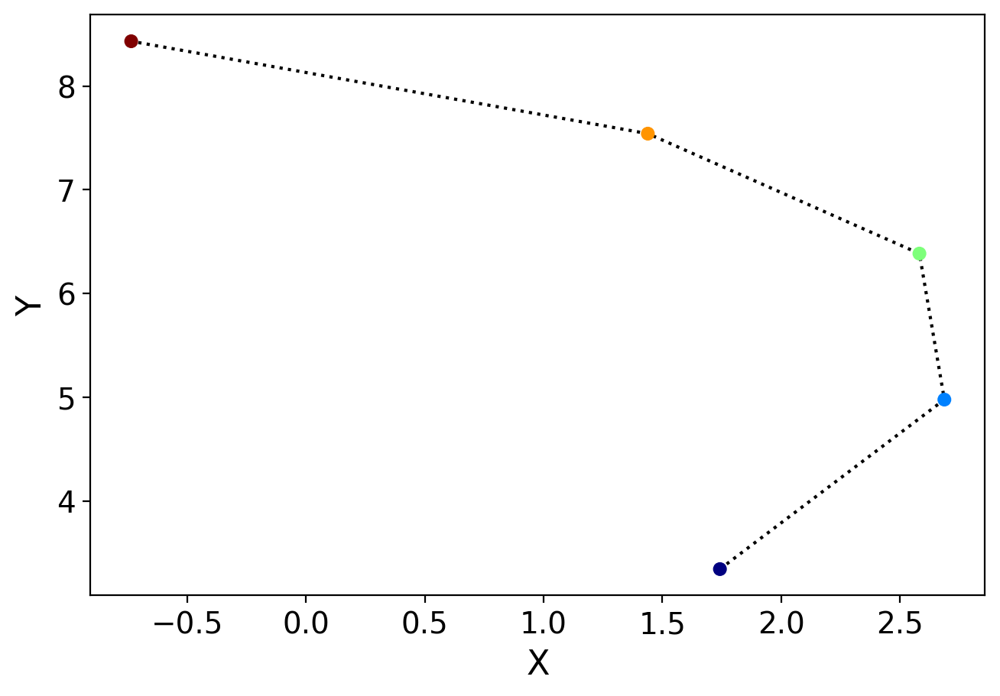

True


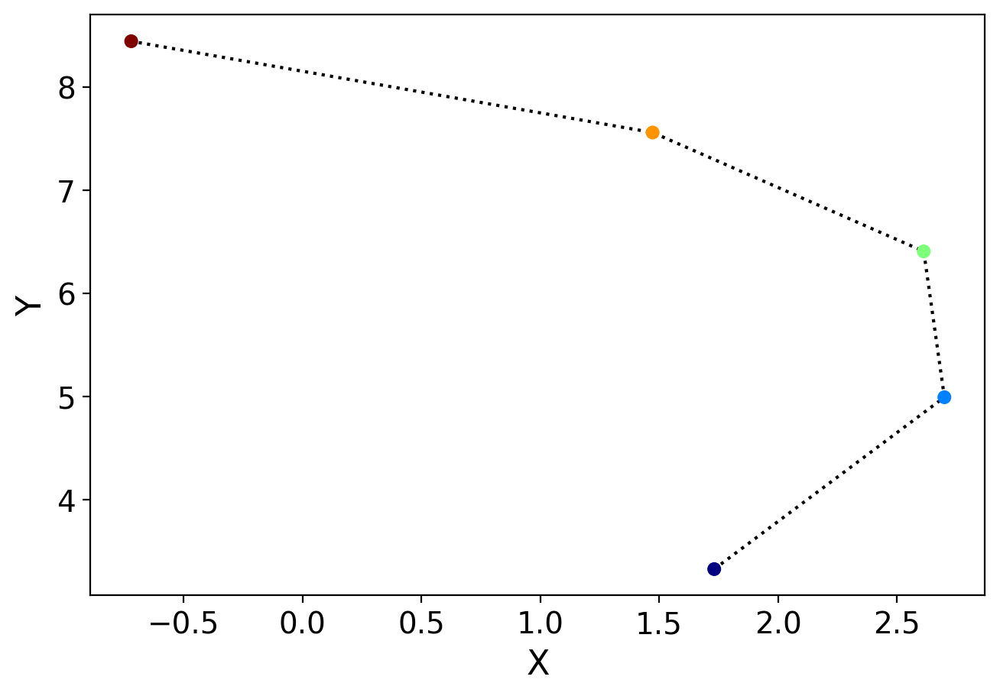

True


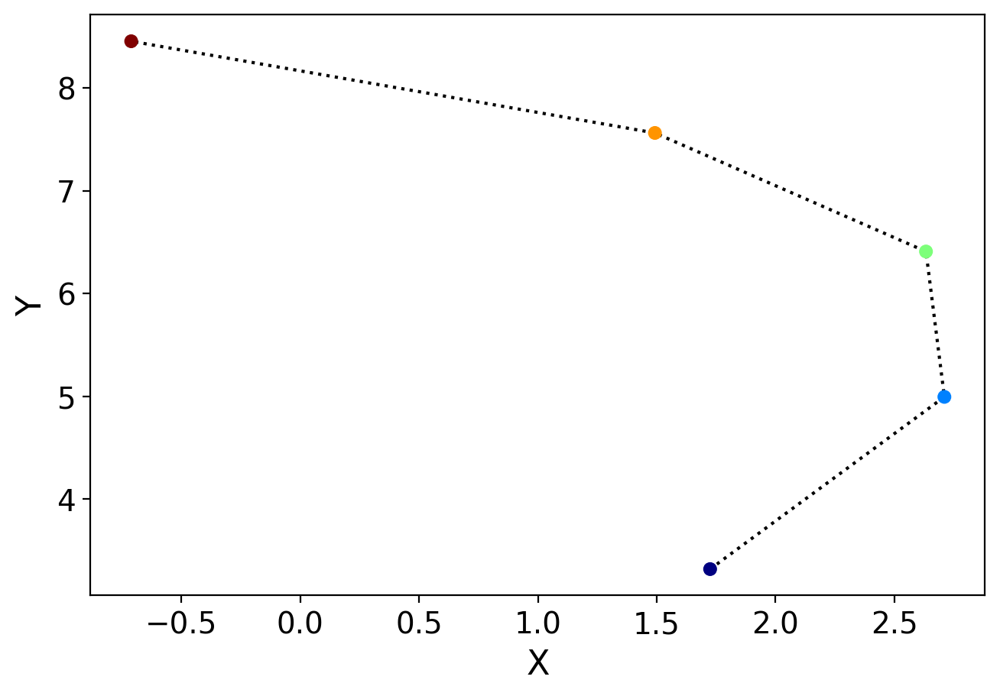

False
X0: 14
[[-2.22937833 -4.47112255 -3.59650572  2.41277307  0.37096911 -0.97642023
  -0.22876534  0.69518855 -1.24836135  0.61688956]
 [-3.08289564 -3.86723236  0.61935673  2.11038552  0.68305362 -2.23007132
   0.16071402  0.42669115 -0.95065407  0.29908729]
 [-3.93641295 -3.26334218  4.83521918  1.80799797  0.99513814 -3.48372241
   0.55019338  0.15819376 -0.65294678 -0.01871498]
 [-4.78993026 -2.65945199  9.05108162  1.50561042  1.30722265 -4.7373735
   0.93967275 -0.11030364 -0.3552395  -0.33651725]
 [-5.64344757 -2.05556181 13.26694407  1.20322287  1.61930716 -5.99102459
   1.32915211 -0.37880104 -0.05753222 -0.65431952]]


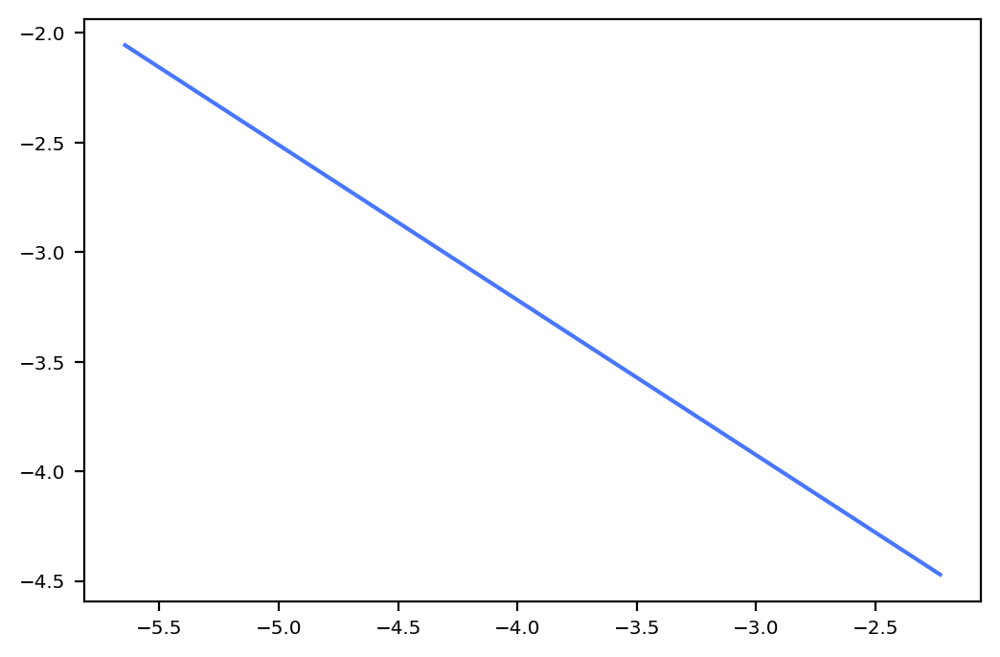

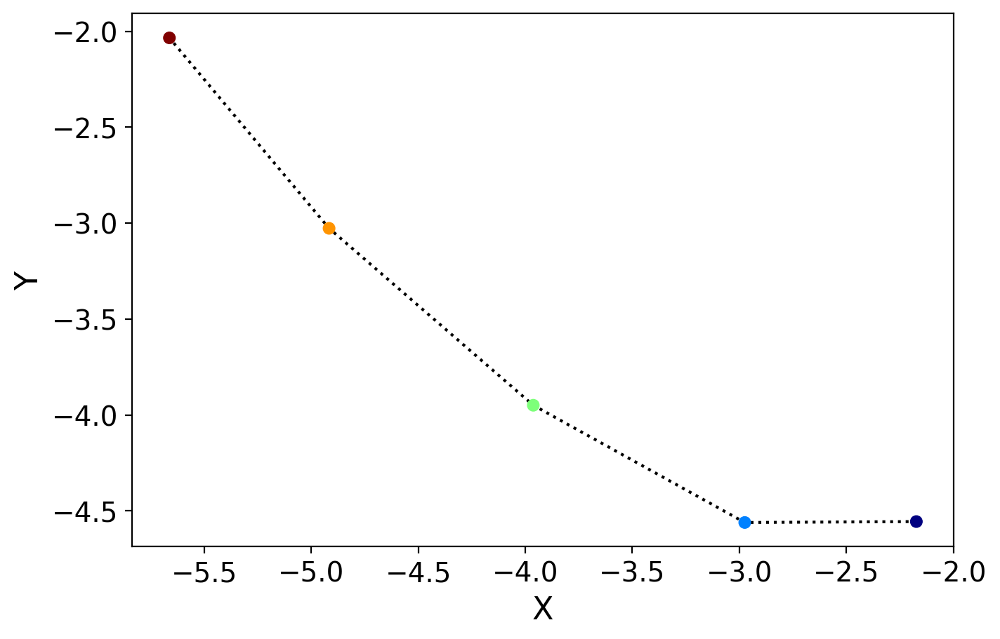

True


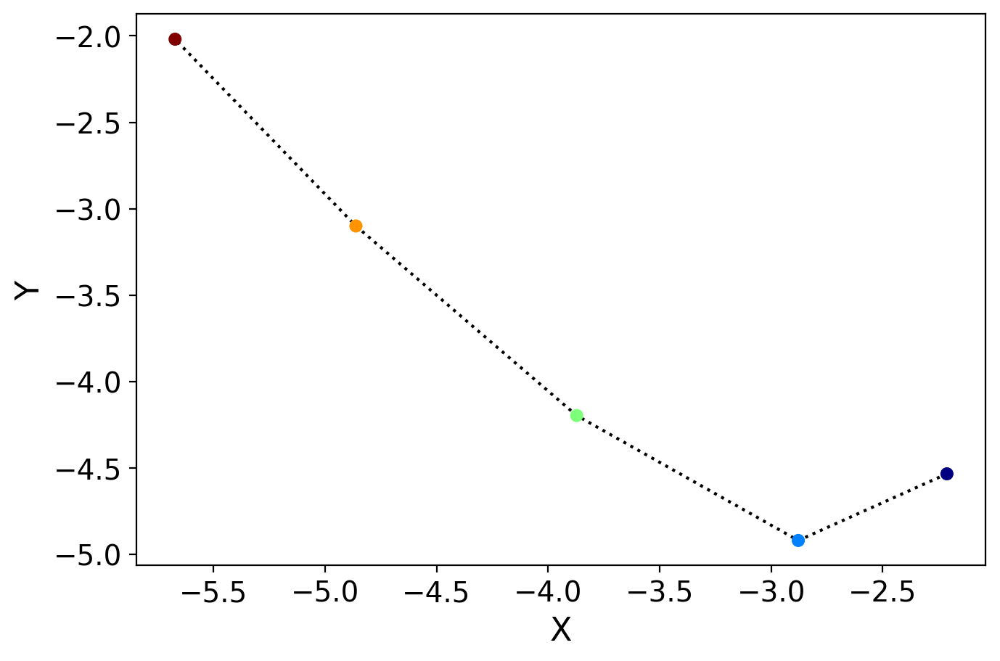

True


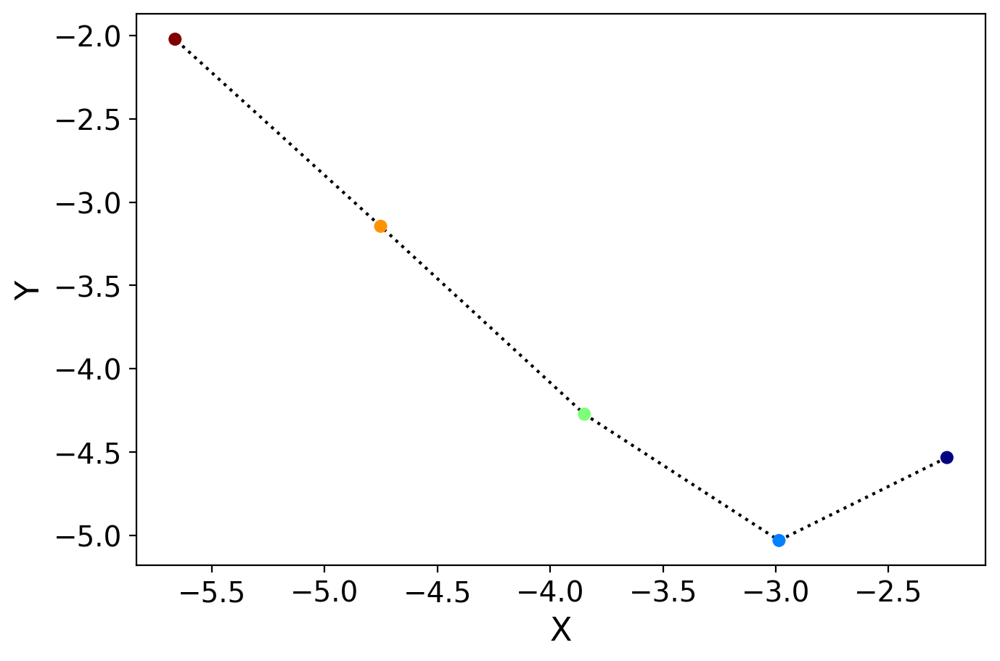

True


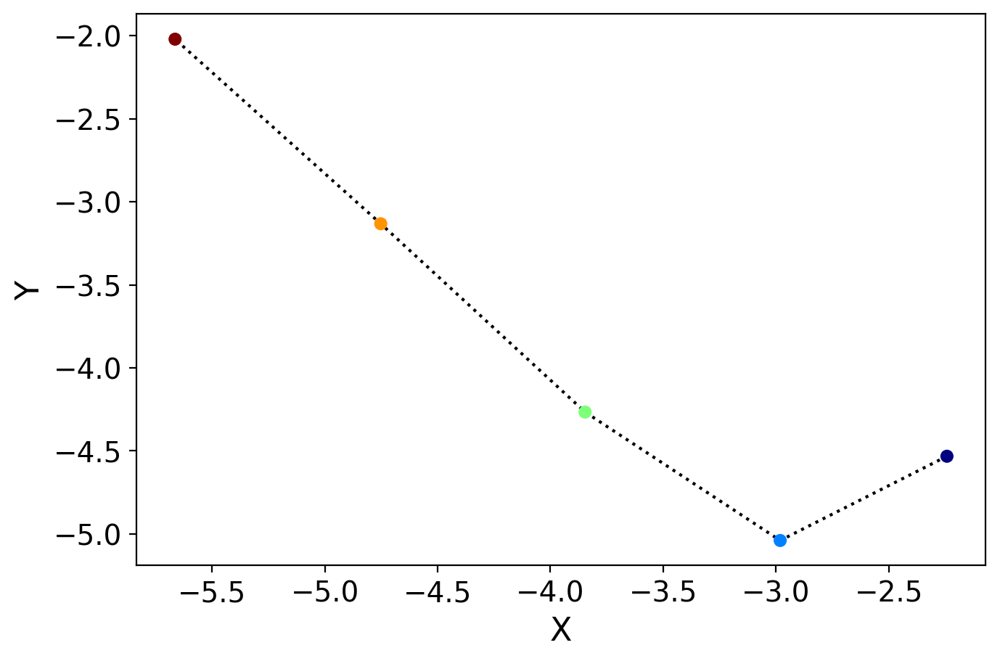

True


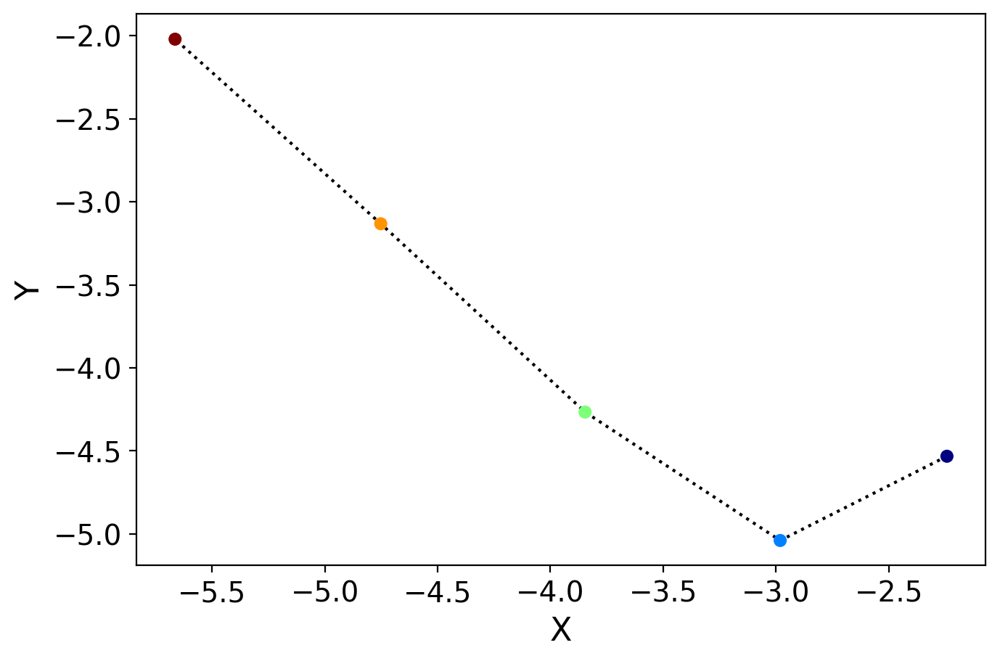

False
X0: 15
[[-3.78732621 -4.95686867 -3.51608399  3.97456174 -0.59983852 -3.33214237
   0.3999072   0.63748087 -0.91010231  0.50676357]
 [-4.10971439 -4.35535335  0.67863938  3.22301185 -0.04079063 -3.5796353
   0.77326881  0.24680826 -0.83518828  0.16445237]
 [-4.43210257 -3.75383804  4.87336276  2.47146197  0.51825725 -3.82712822
   1.14663042 -0.14386435 -0.76027425 -0.17785883]
 [-4.75449075 -3.15232272  9.06808613  1.71991208  1.07730514 -4.07462114
   1.51999203 -0.53453697 -0.68536022 -0.52017003]
 [-5.07687894 -2.5508074  13.2628095   0.9683622   1.63635303 -4.32211406
   1.89335364 -0.92520958 -0.61044619 -0.86248123]]


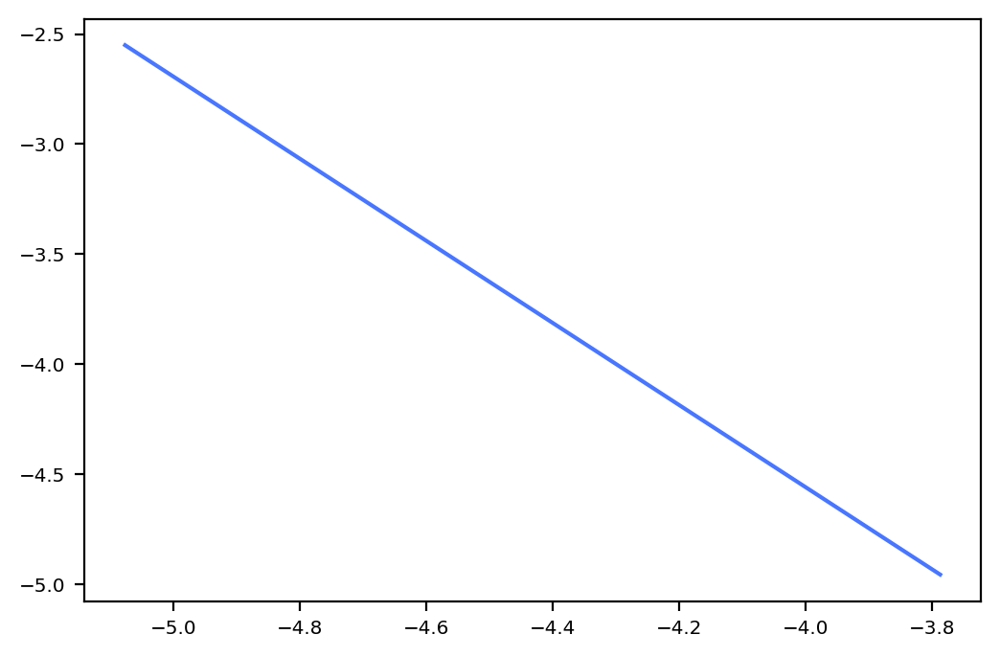

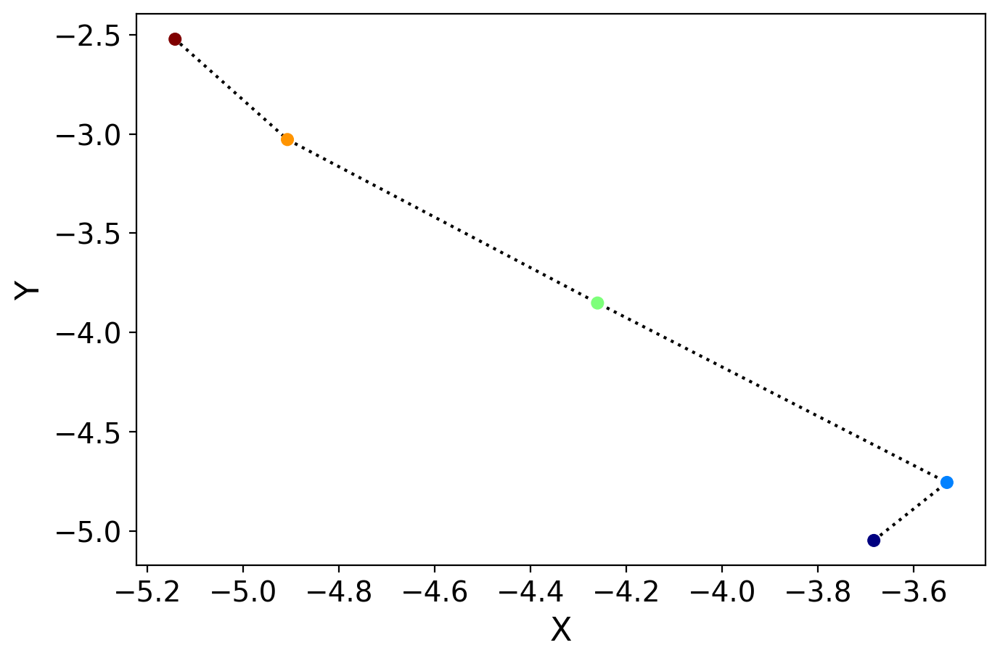

True


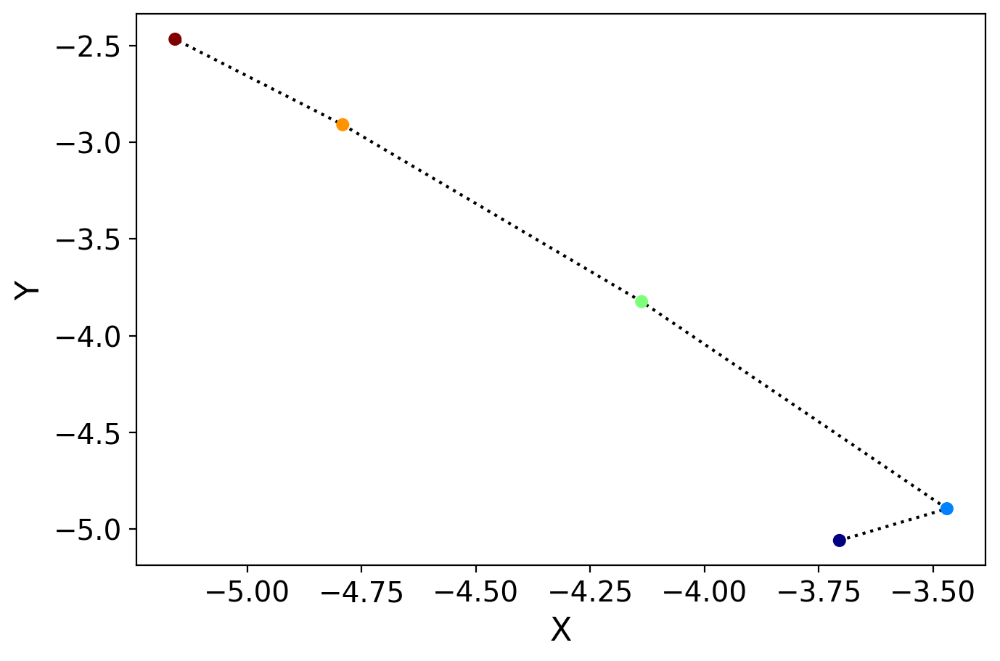

True


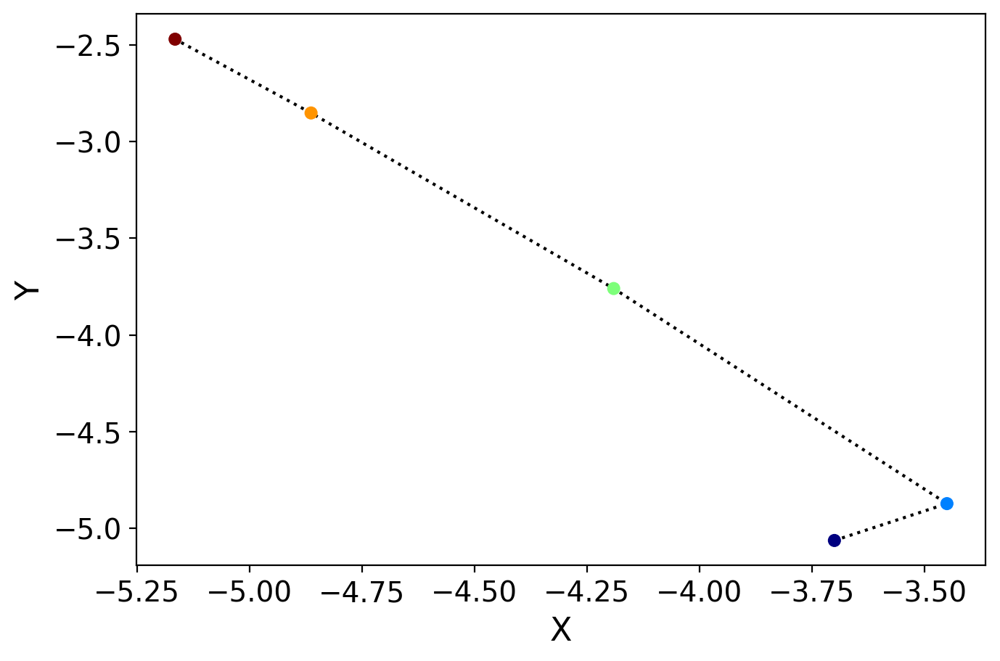

False
X0: 85
[[ 1.74061972  3.17401959 -3.49711436 -0.62705839  0.26392621  1.72294842
   0.3694838  -0.99765603 -0.13144797  0.93643279]
 [ 1.00211477  4.45594471 -1.101027   -1.95121458  0.93858762  1.10105637
   0.31171682 -0.9918334   0.04751062  0.59435325]
 [ 0.26360983  5.73786983  1.29506036 -3.27537077  1.61324902  0.47916432
   0.25394984 -0.98601076  0.22646921  0.25227372]
 [-0.47489511  7.01979494  3.69114772 -4.59952697  2.28791043 -0.14272773
   0.19618286 -0.98018813  0.4054278  -0.08980581]
 [-1.21340006  8.30172006  6.08723508 -5.92368316  2.96257183 -0.76461977
   0.13841588 -0.97436549  0.58438638 -0.43188534]]


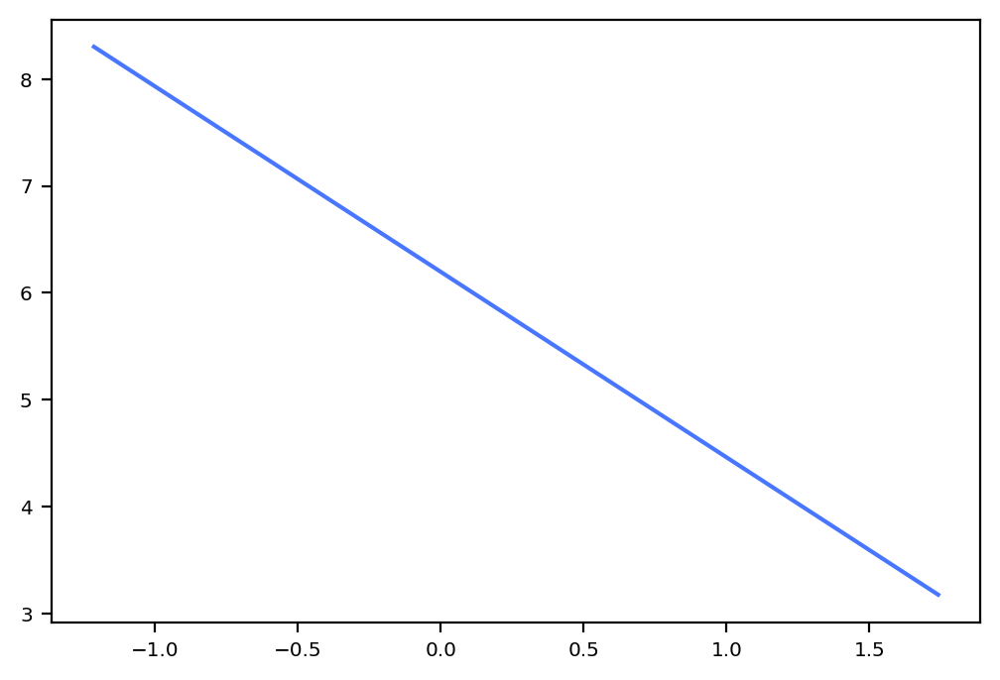

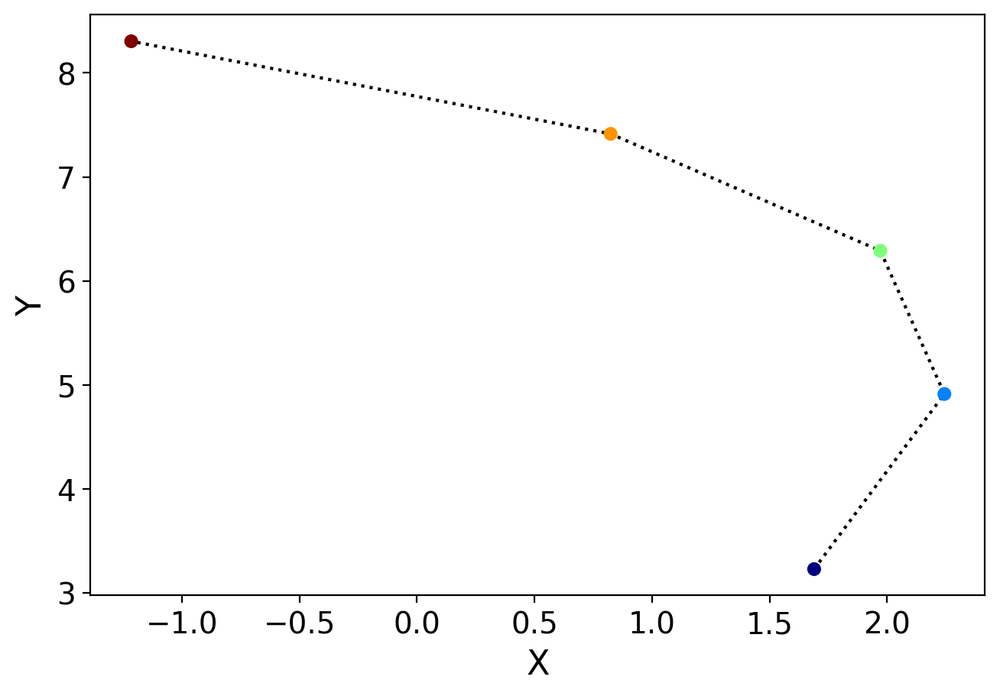

True


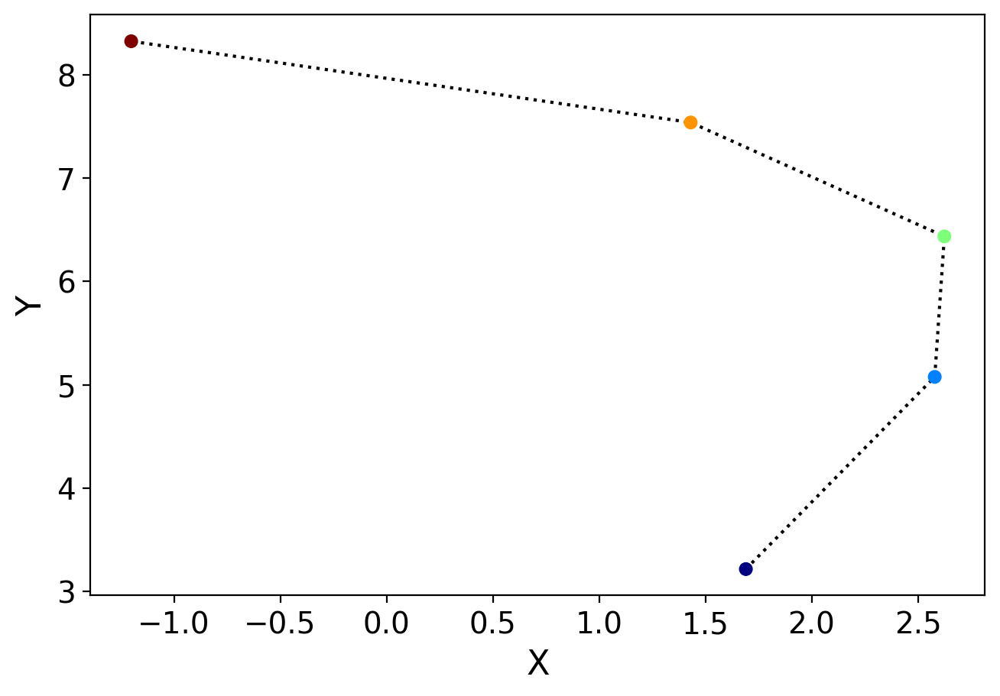

True


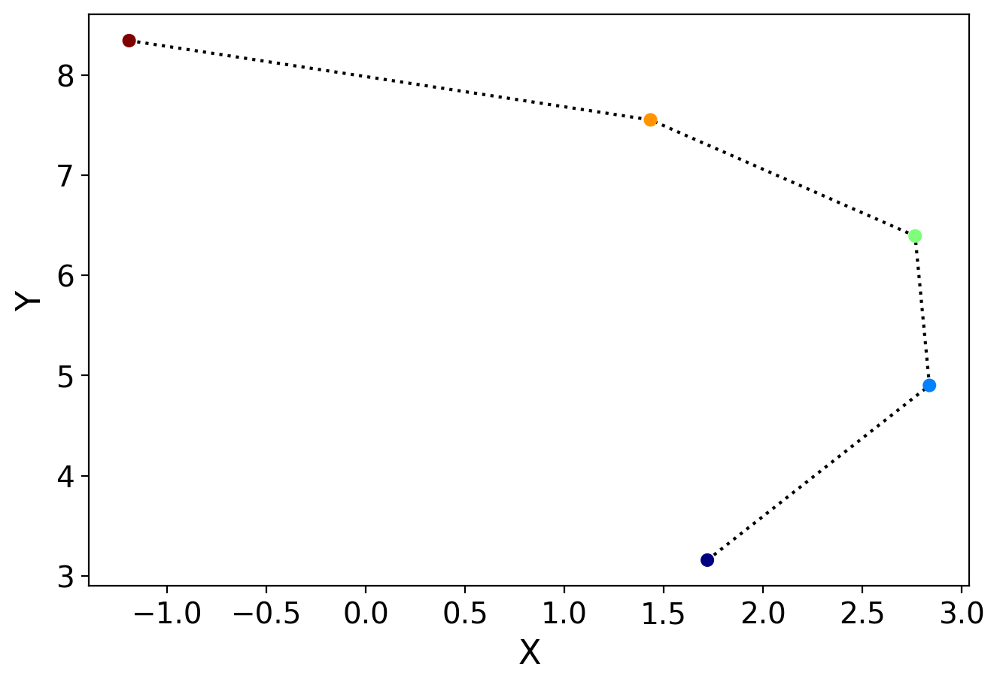

True


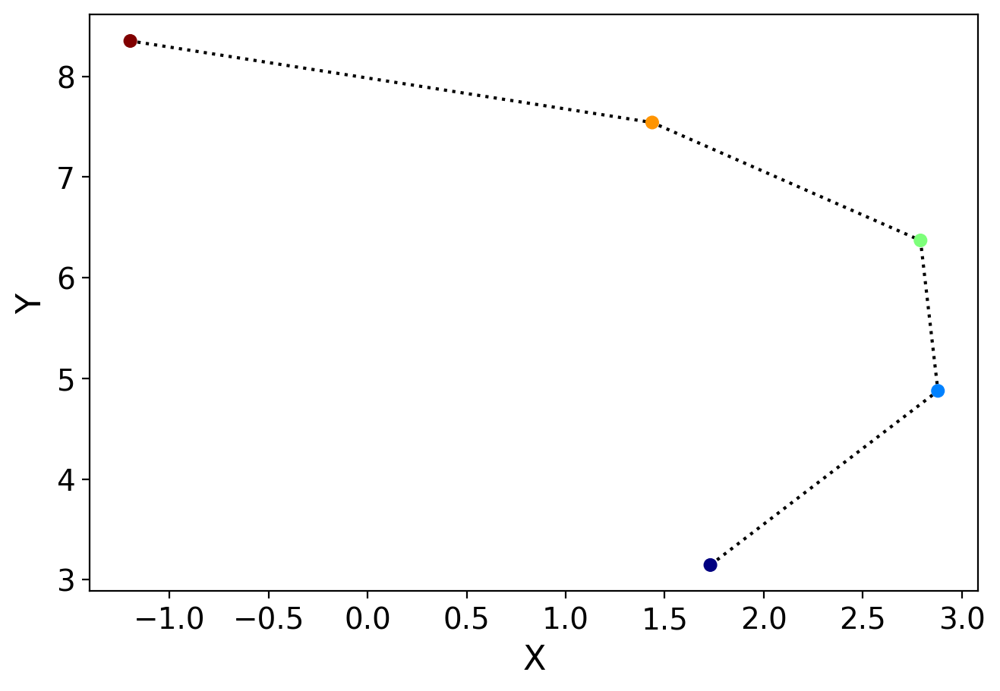

True


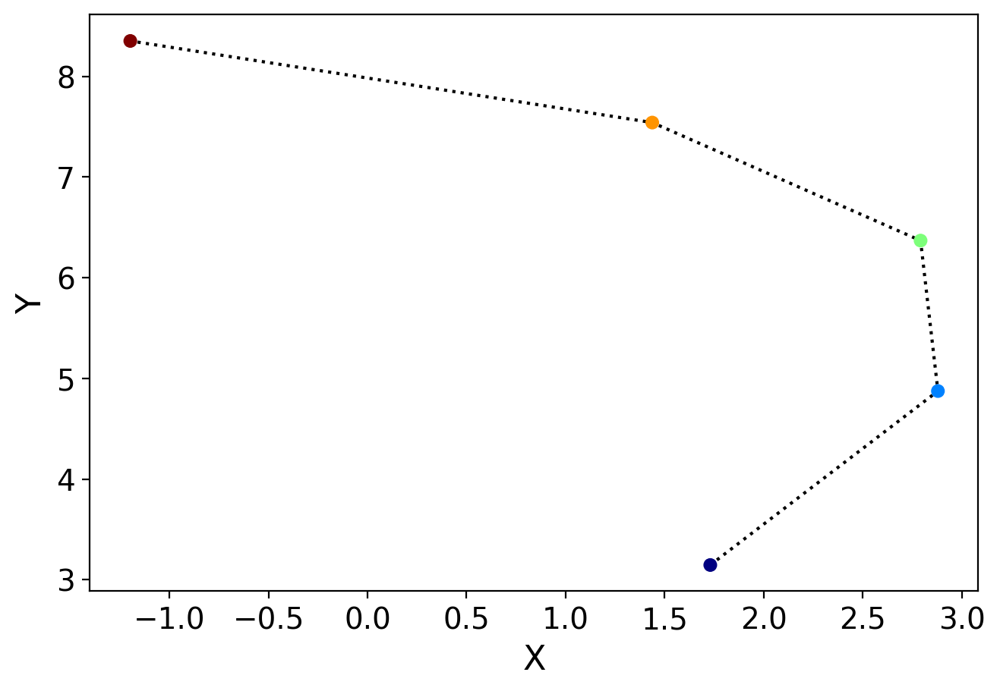

True


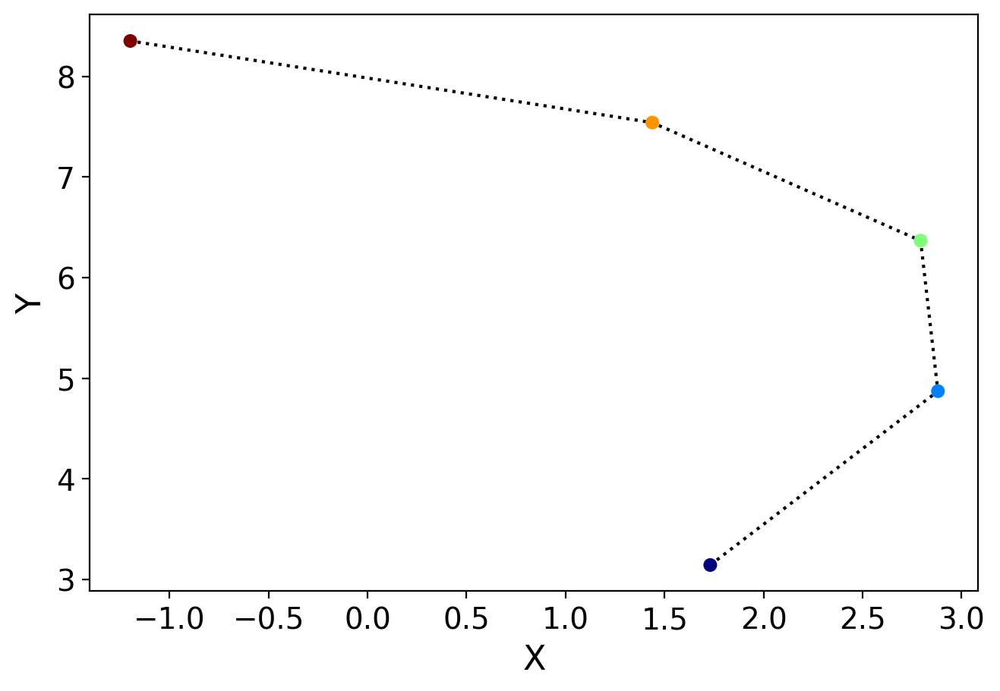

True


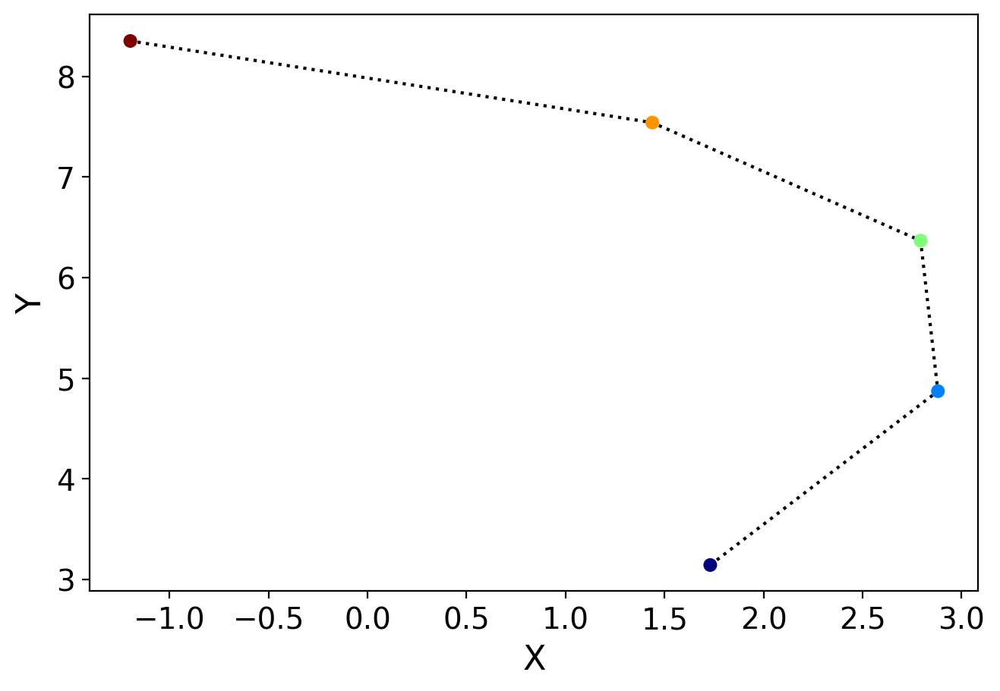

False
X0: 85
[[ 1.96214955  3.33803587 -3.28408827 -0.63944691  0.29019198  1.42343231
   0.14472541 -0.71038973 -0.12773536  0.52435193]
 [ 1.23047354  4.63128302 -0.87889529 -1.86521447  0.95526728  0.87591222
   0.1506933  -0.83624212  0.04134494  0.22385226]
 [ 0.49879752  5.92453017  1.52629769 -3.09098203  1.62034258  0.32839213
   0.15666119 -0.96209452  0.21042524 -0.07664741]
 [-0.2328785   7.21777732  3.93149067 -4.31674959  2.28541789 -0.21912796
   0.16262908 -1.08794692  0.37950554 -0.37714708]
 [-0.96455451  8.51102447  6.33668365 -5.54251715  2.95049319 -0.76664805
   0.16859697 -1.21379931  0.54858584 -0.67764674]]


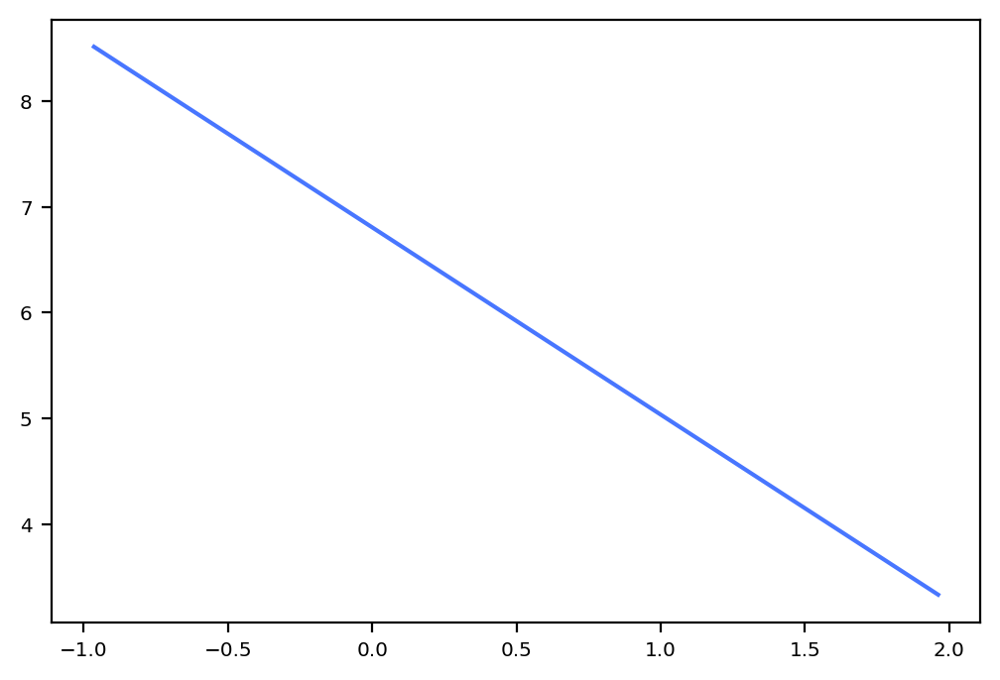

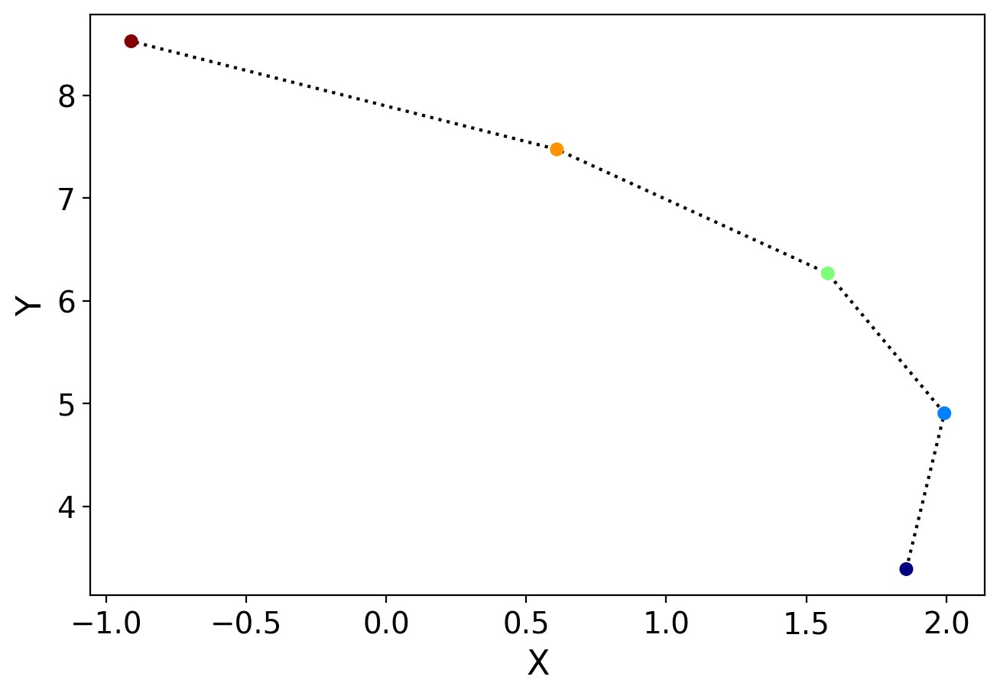

True


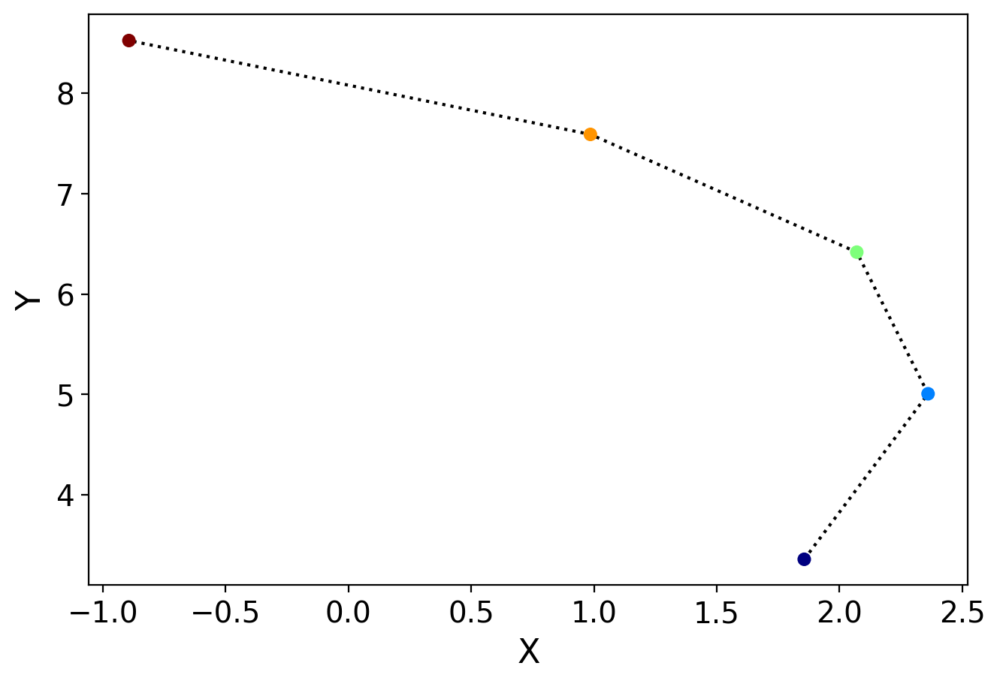

True


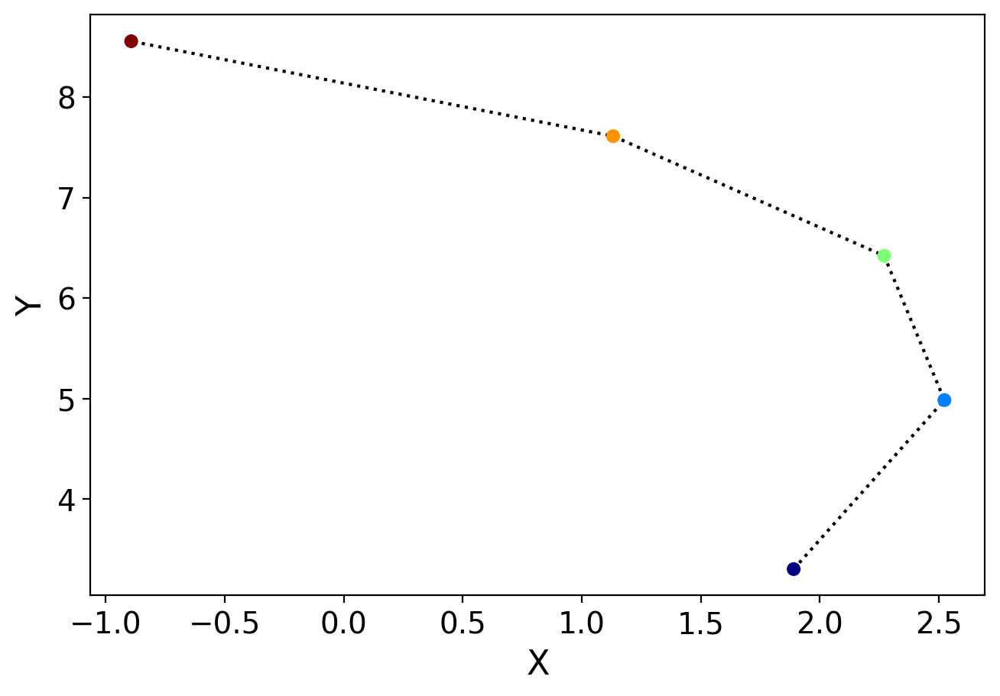

True


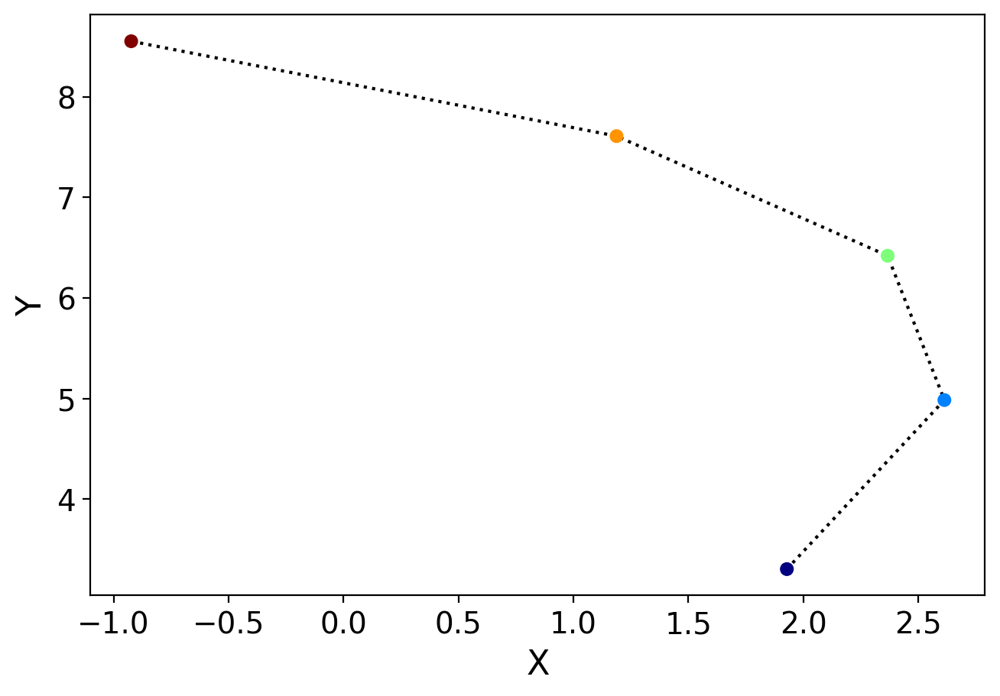

True


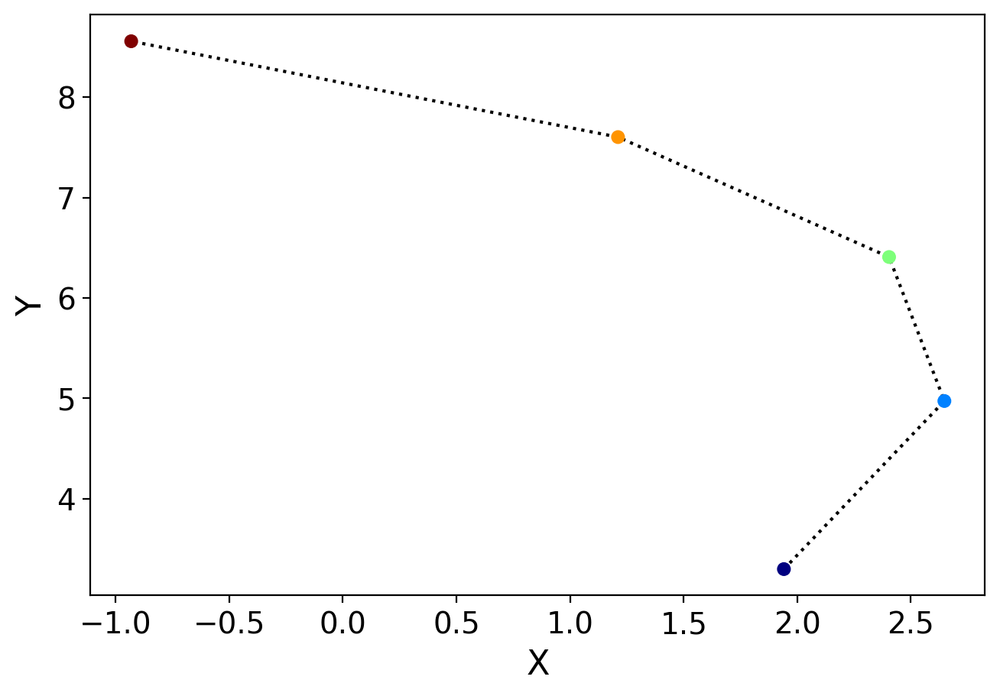

True


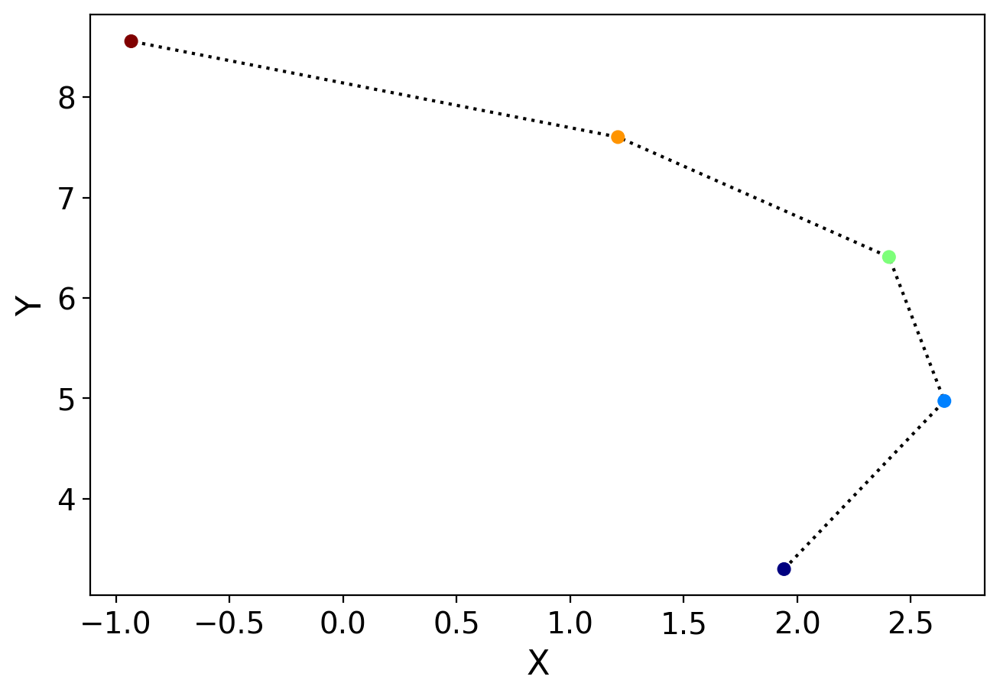

False
X0: 15
[[-3.00965736e+00 -5.54321265e+00 -3.33190957e+00  4.58879370e+00
  -4.51109124e-01 -3.43373618e+00  9.81781302e-04  4.86290950e-01
  -9.62647652e-01  4.77560724e-01]
 [-3.57323817e+00 -4.70955784e+00  8.43548686e-01  3.59545313e+00
  -2.03743295e-01 -3.99226405e+00  4.23057417e-01  6.78348578e-02
  -9.10289262e-01 -2.23411937e-02]
 [-4.13681898e+00 -3.87590302e+00  5.01900695e+00  2.60211257e+00
   4.36225333e-02 -4.55079192e+00  8.45133053e-01 -3.50621234e-01
  -8.57930872e-01 -5.22243111e-01]
 [-4.70039979e+00 -3.04224821e+00  9.19446521e+00  1.60877200e+00
   2.90988362e-01 -5.10931979e+00  1.26720869e+00 -7.69077326e-01
  -8.05572482e-01 -1.02214503e+00]
 [-5.26398060e+00 -2.20859339e+00  1.33699235e+01  6.15431436e-01
   5.38354191e-01 -5.66784767e+00  1.68928432e+00 -1.18753342e+00
  -7.53214091e-01 -1.52204695e+00]]


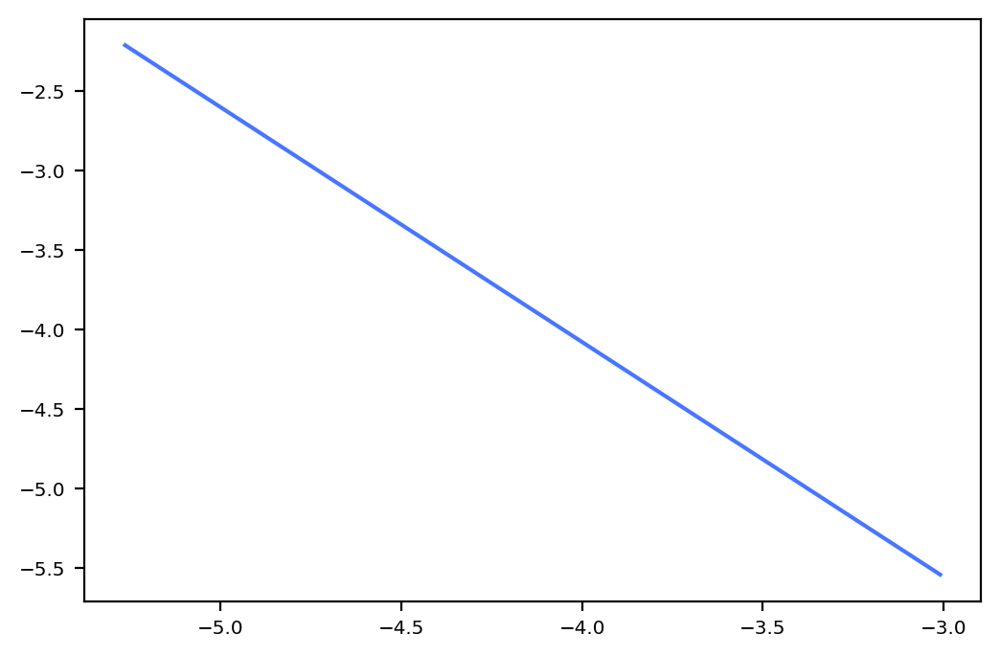

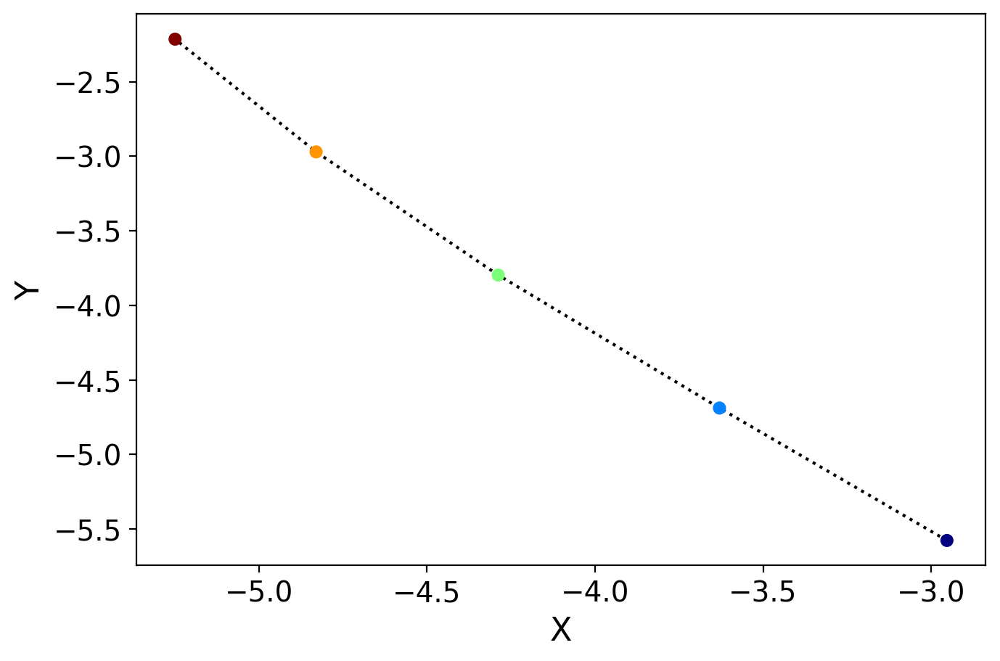

True


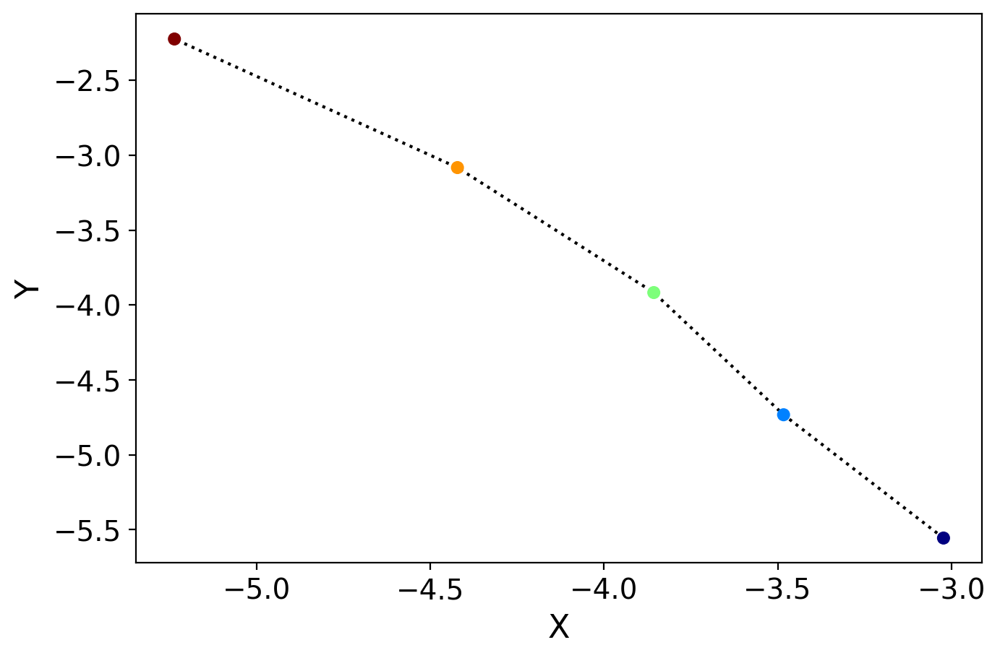

True


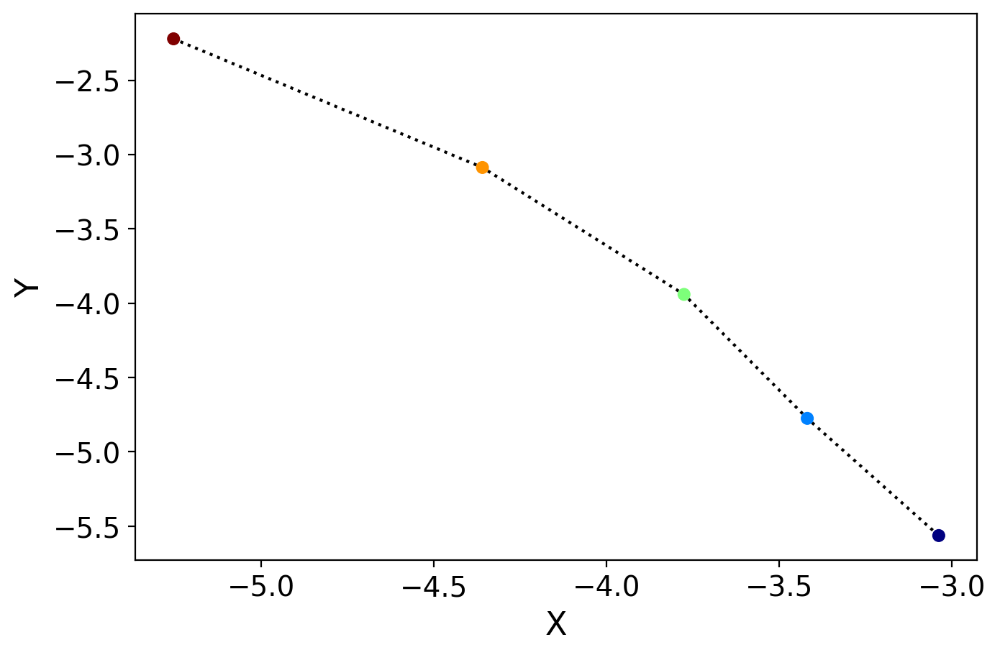

True


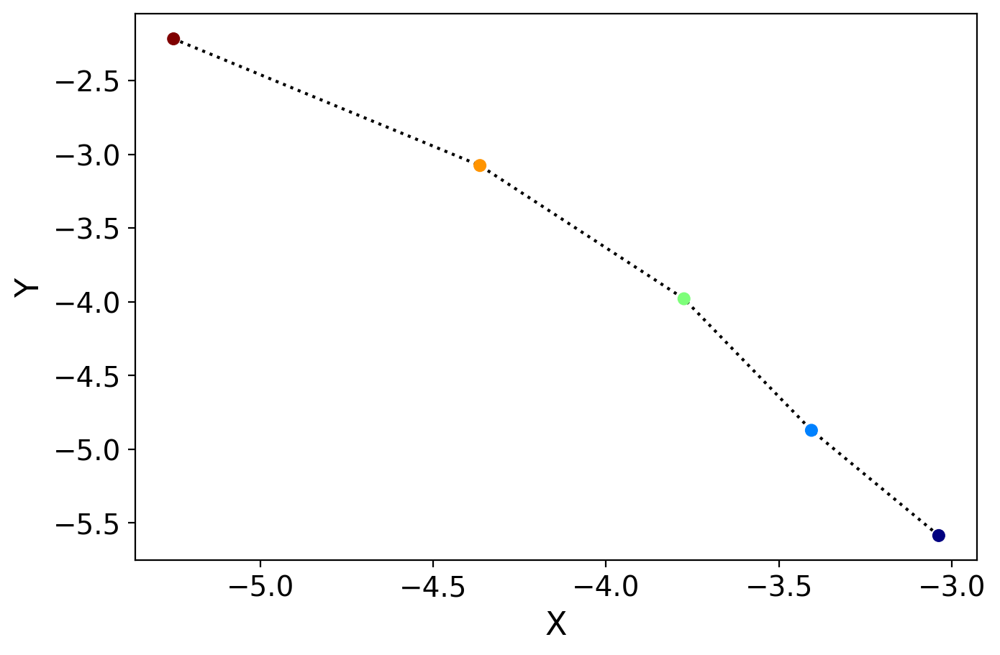

True


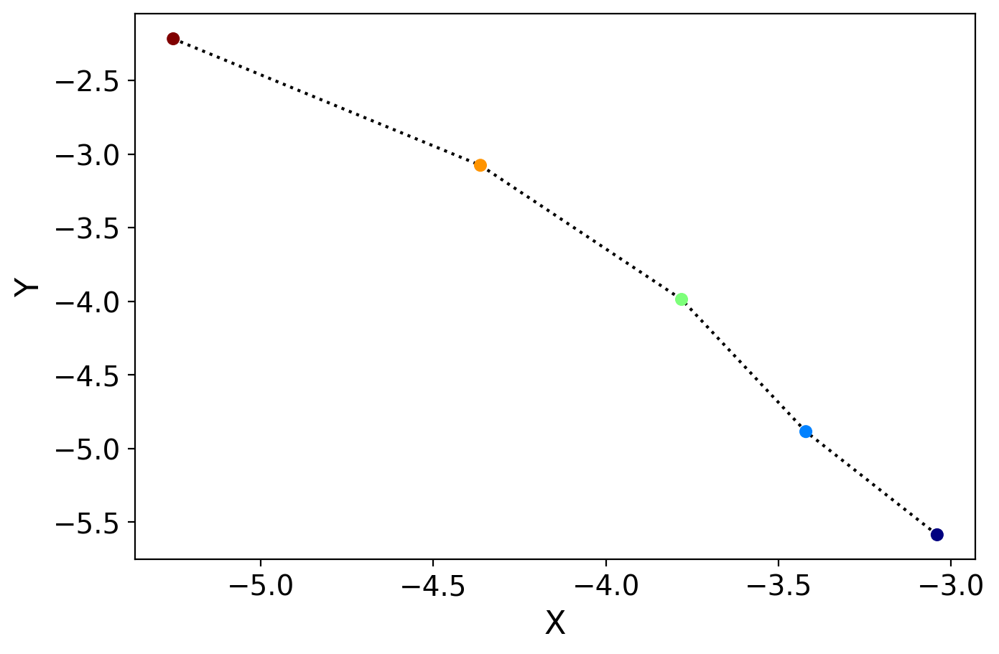

True


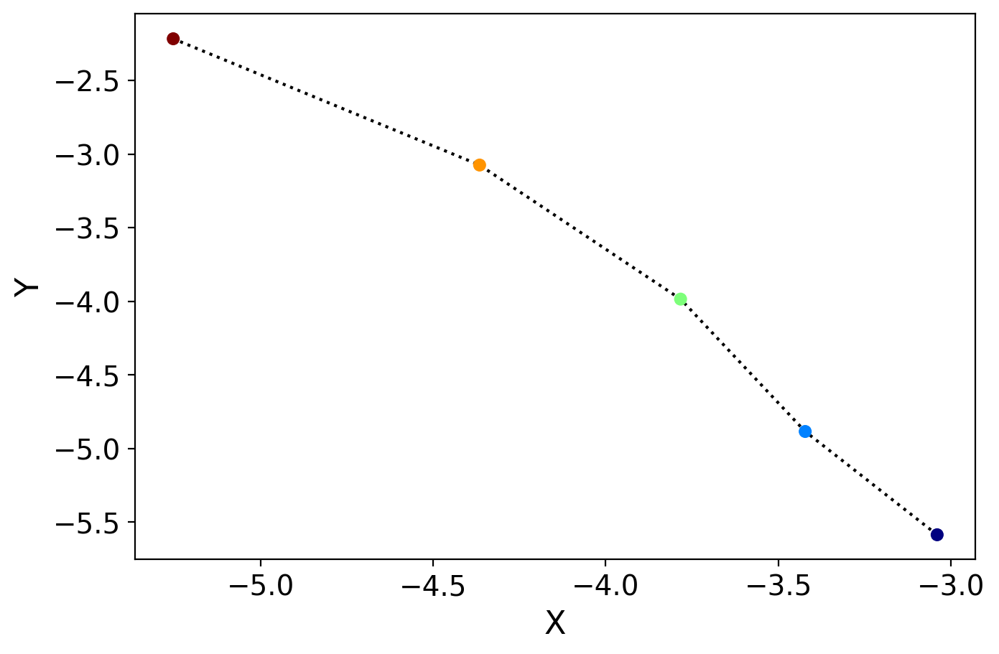

False
X0: 79
[[ 1.73539867  3.51818533 -3.46329768 -0.27362363 -0.03471685  1.75954163
   0.0260408  -0.62440885 -0.11782383  0.58092371]
 [ 1.04563678  4.67224305 -0.9701941  -1.54798846  0.71662573  0.95910634
   0.17215111 -0.75733523  0.08593845  0.32461297]
 [ 0.3558749   5.82630078  1.52290947 -2.8223533   1.46796832  0.15867104
   0.31826142 -0.89026161  0.28970073  0.06830223]
 [-0.33388699  6.9803585   4.01601305 -4.09671814  2.2193109  -0.64176425
   0.46437173 -1.02318799  0.49346301 -0.18800851]
 [-1.02364888  8.13441622  6.50911662 -5.37108298  2.97065349 -1.44219954
   0.61048204 -1.15611437  0.69722529 -0.44431925]]


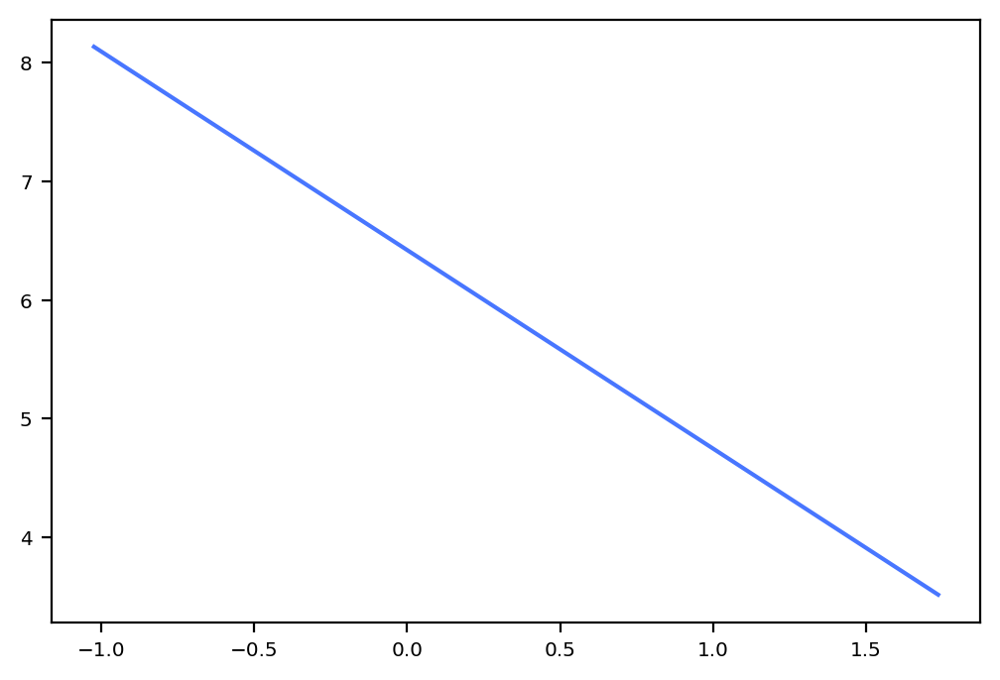

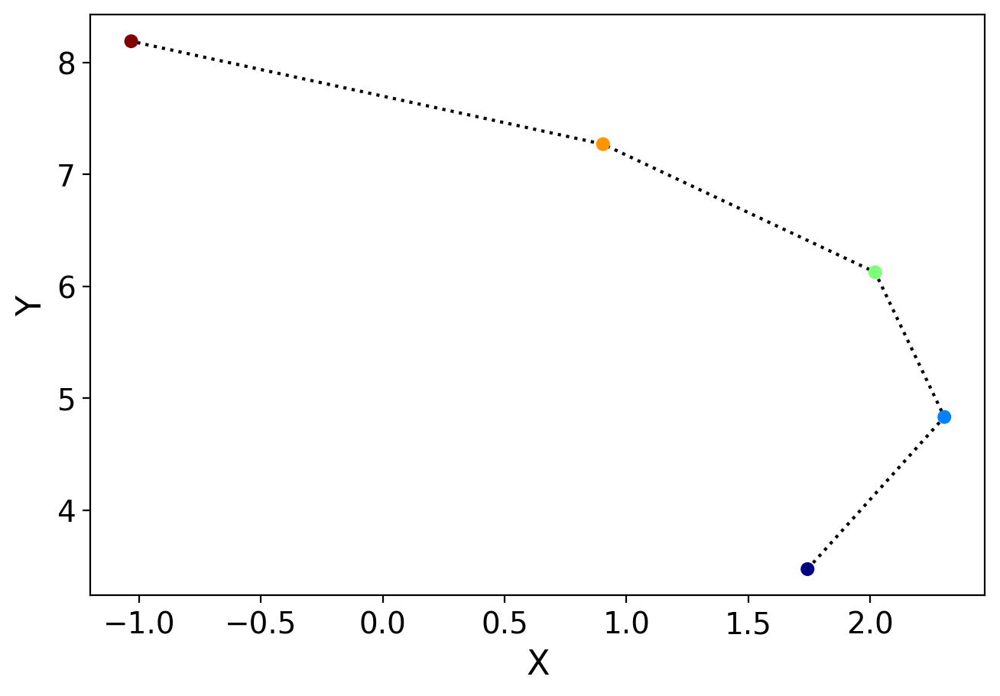

True


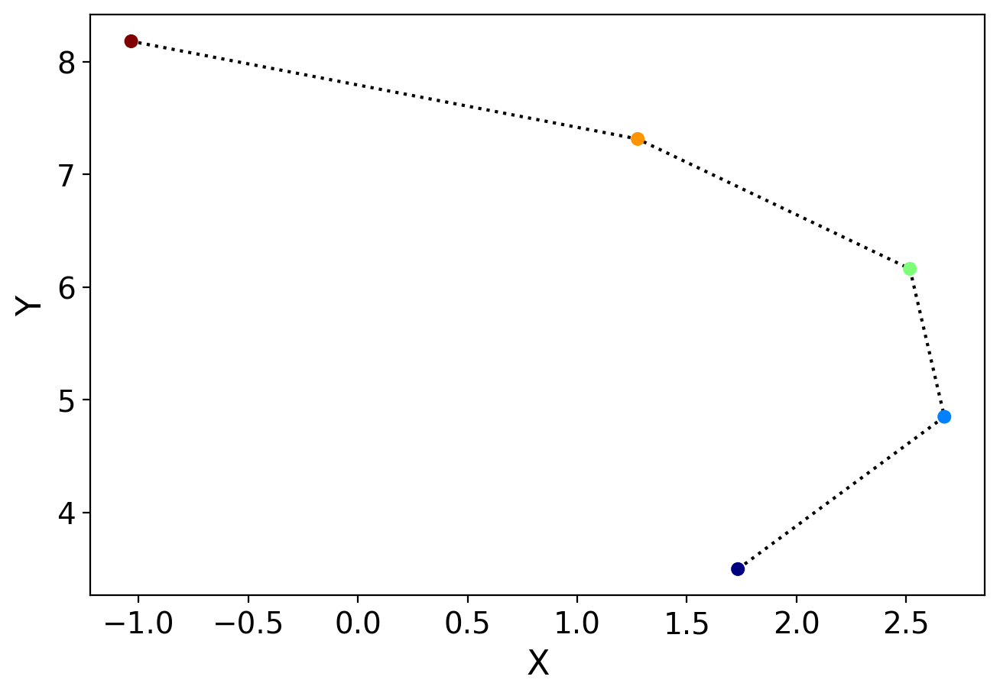

True


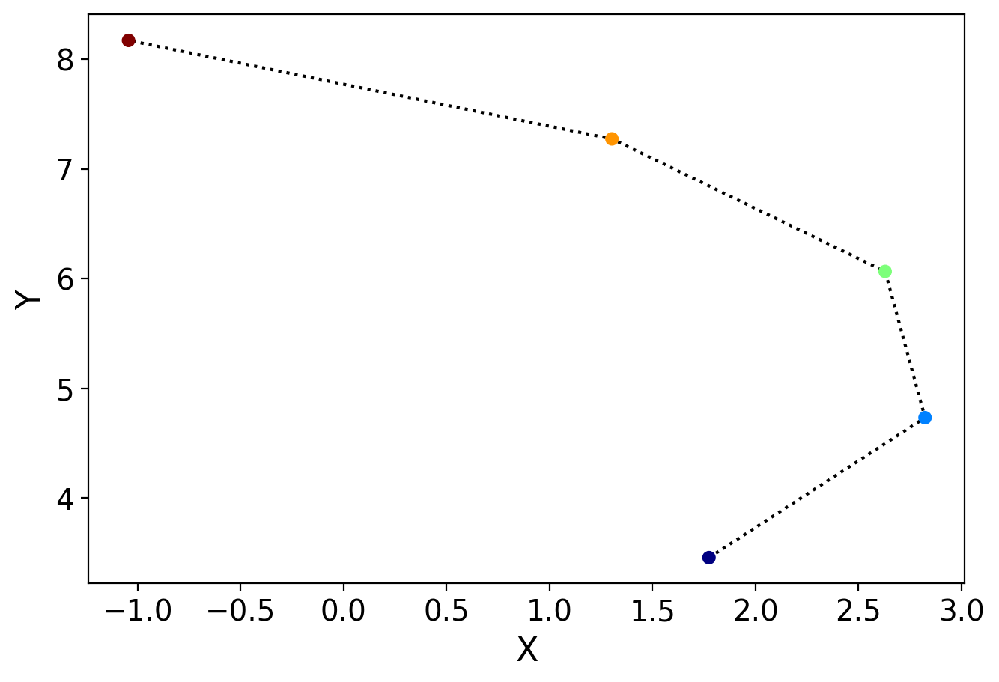

True


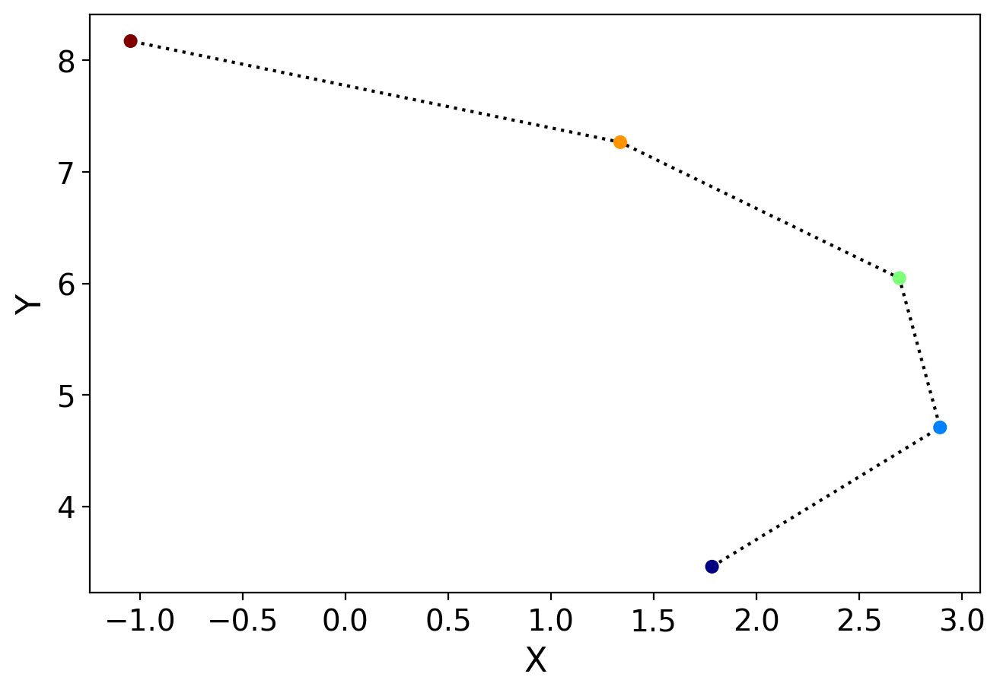

True


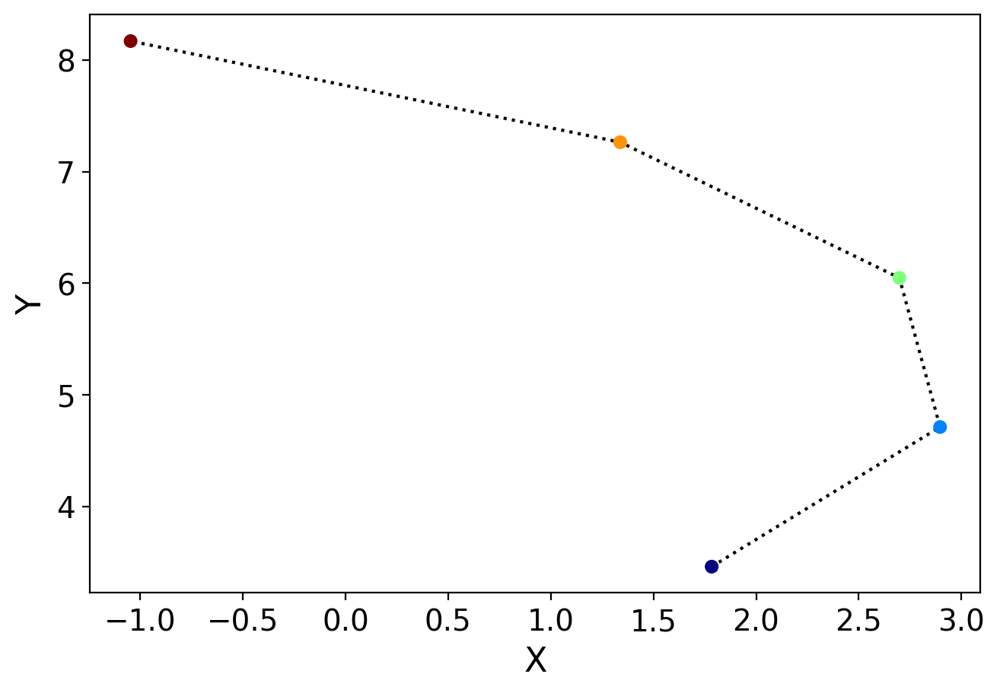

True


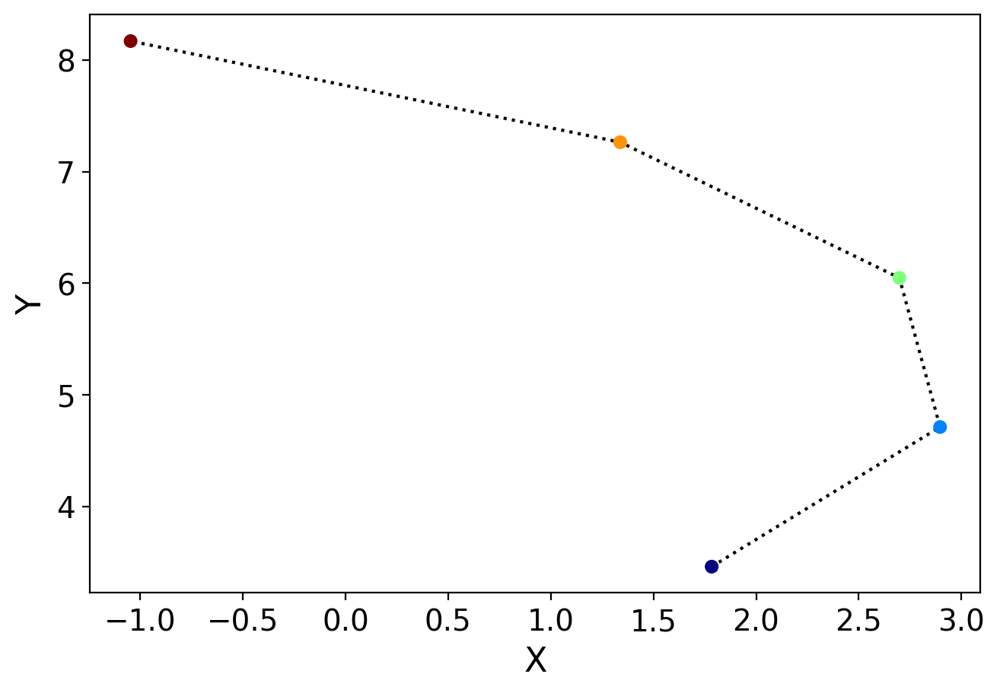

False
X0: 21
[[-2.64202921 -4.62123675 -3.26731094  3.73438704  0.34913512 -2.24717674
  -0.42225011  1.17515702 -0.79415397  0.38515162]
 [-3.40400614 -4.0475189   0.8461085   2.95689444  0.85544501 -3.09896234
   0.12477661  0.71130646 -0.47474216  0.05912805]
 [-4.16598307 -3.47380105  4.95952794  2.17940183  1.3617549  -3.95074793
   0.67180332  0.2474559  -0.15533034 -0.26689551]
 [-4.92796    -2.90008321  9.07294739  1.40190922  1.86806478 -4.80253352
   1.21883003 -0.21639466  0.16408147 -0.59291908]
 [-5.68993693 -2.32636536 13.18636683  0.62441661  2.37437467 -5.65431912
   1.76585675 -0.68024521  0.48349329 -0.91894265]]


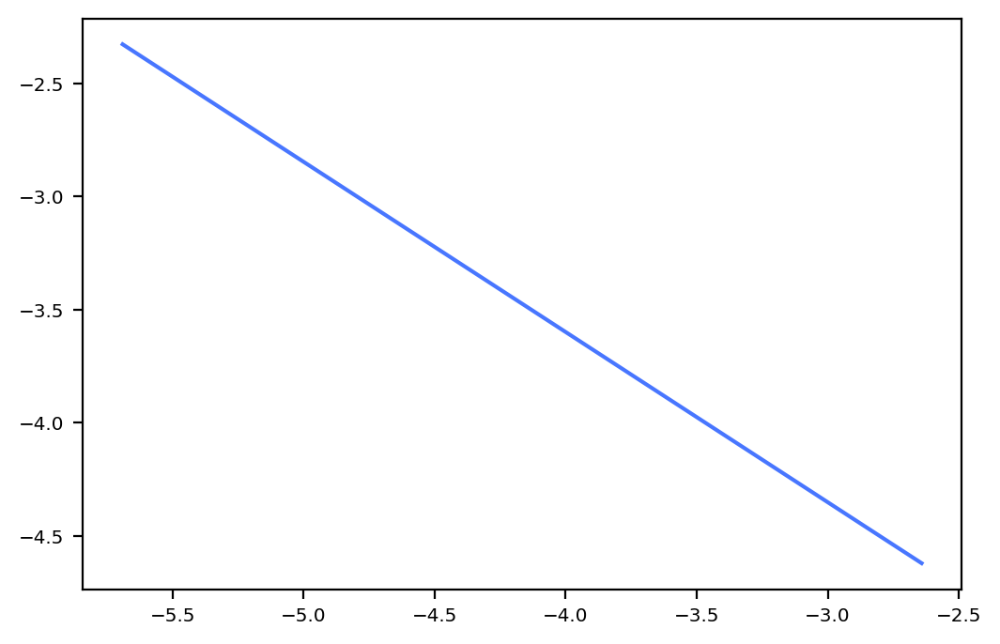

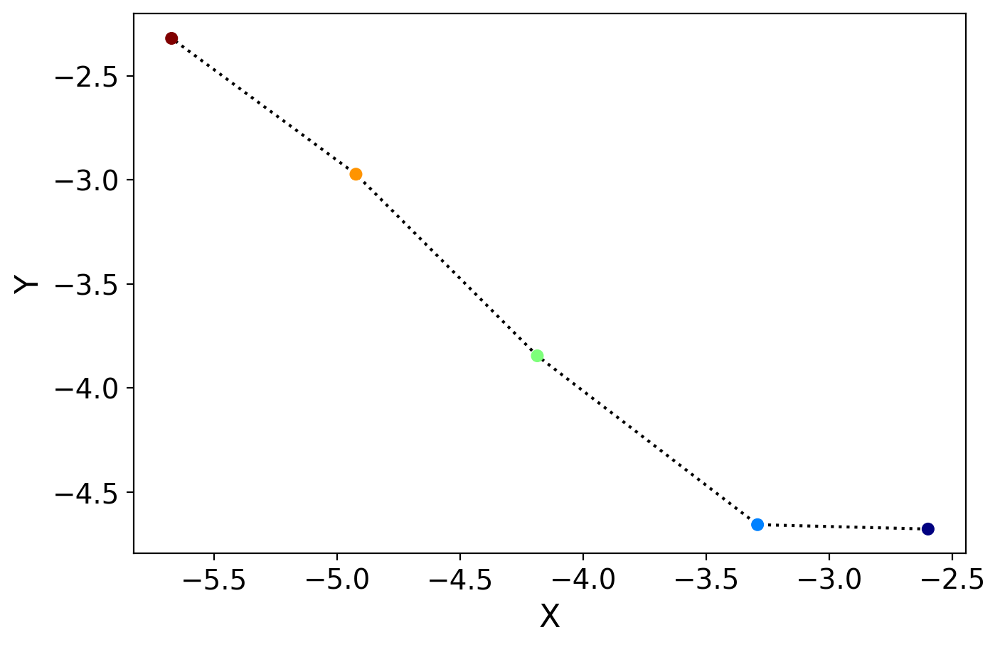

True


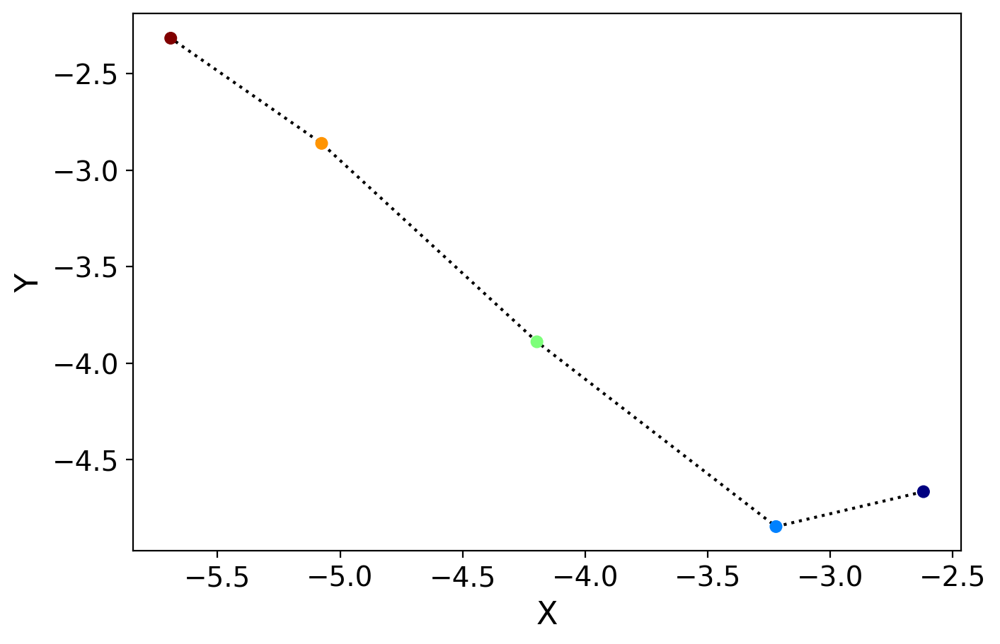

True


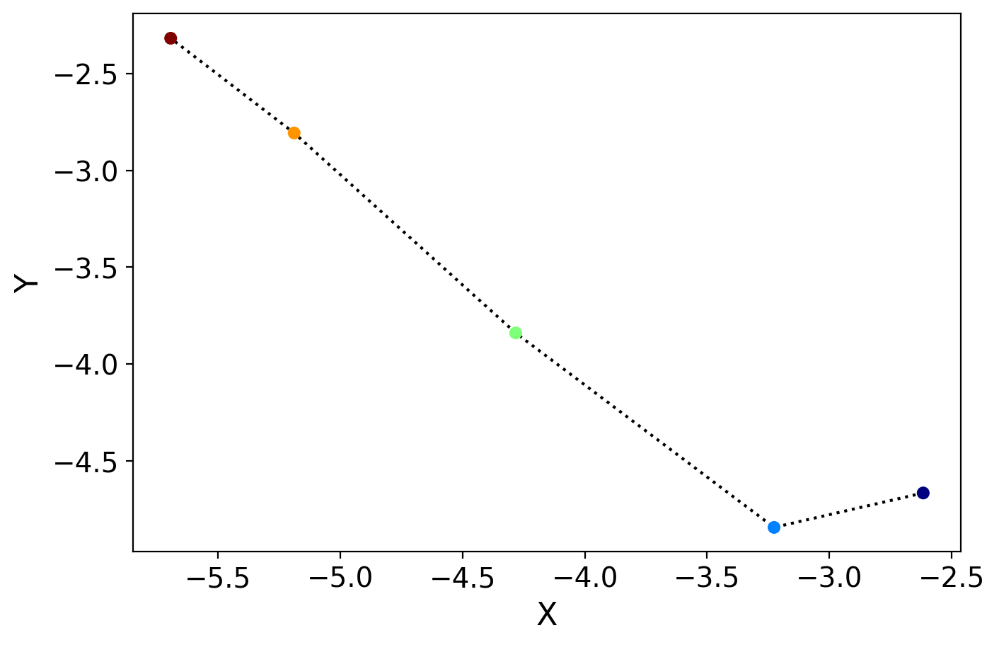

True


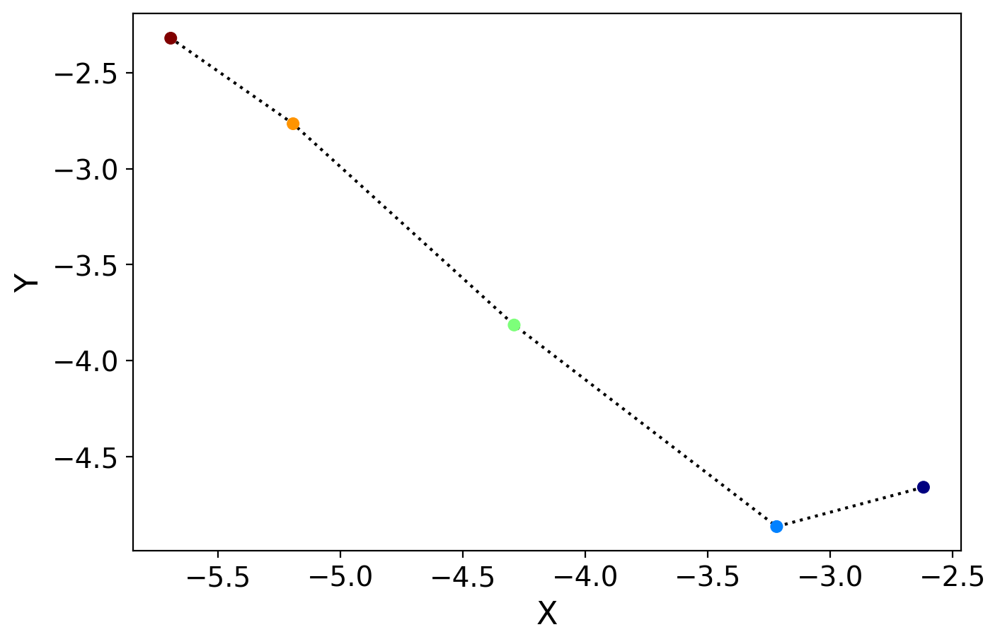

True


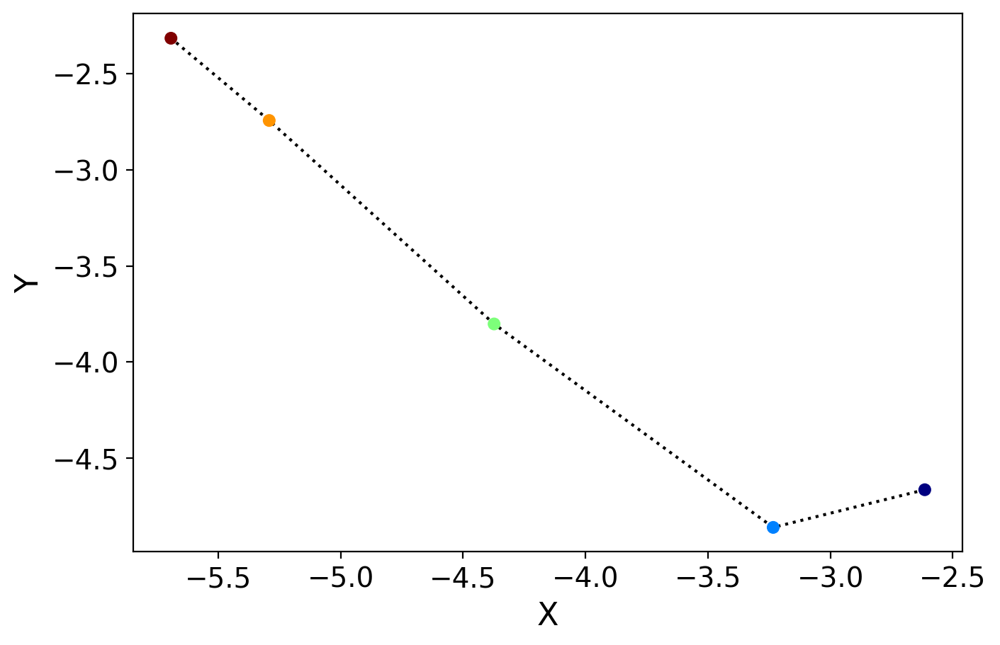

True


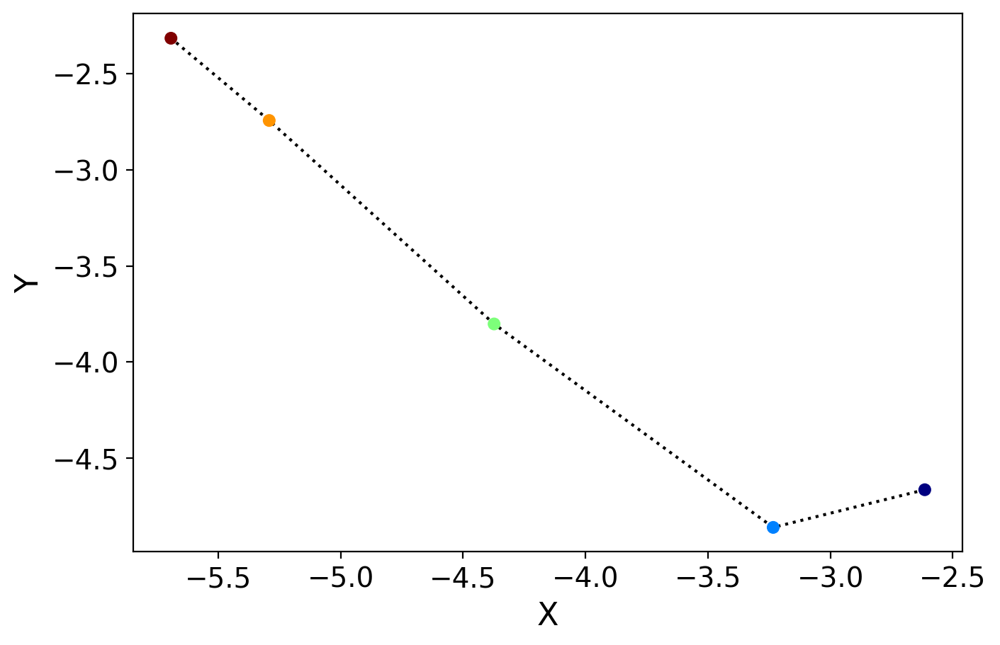

False
X0: 88
[[ 1.81698877  3.21269197 -3.40314832 -0.24772296  0.28460317  1.62573493
   0.28539407 -0.58236098 -0.13809297  0.92901634]
 [ 1.19020413  4.57055004 -0.97011885 -1.61062776  1.02661694  0.84427226
   0.26519724 -0.78586088  0.09018995  0.59338611]
 [ 0.56341949  5.92840811  1.46291062 -2.97353256  1.7686307   0.06280959
   0.24500041 -0.98936077  0.31847288  0.25775589]
 [-0.06336516  7.28626618  3.89594009 -4.33643736  2.51064446 -0.71865308
   0.22480358 -1.19286067  0.5467558  -0.07787434]
 [-0.6901498   8.64412425  6.32896955 -5.69934216  3.25265822 -1.50011575
   0.20460675 -1.39636057  0.77503872 -0.41350457]]


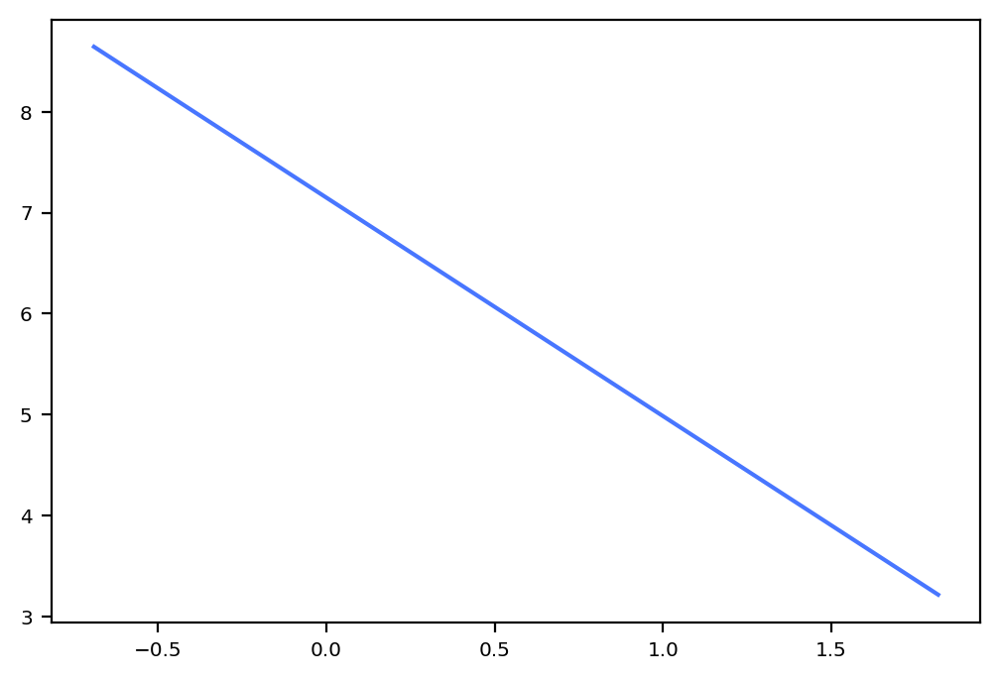

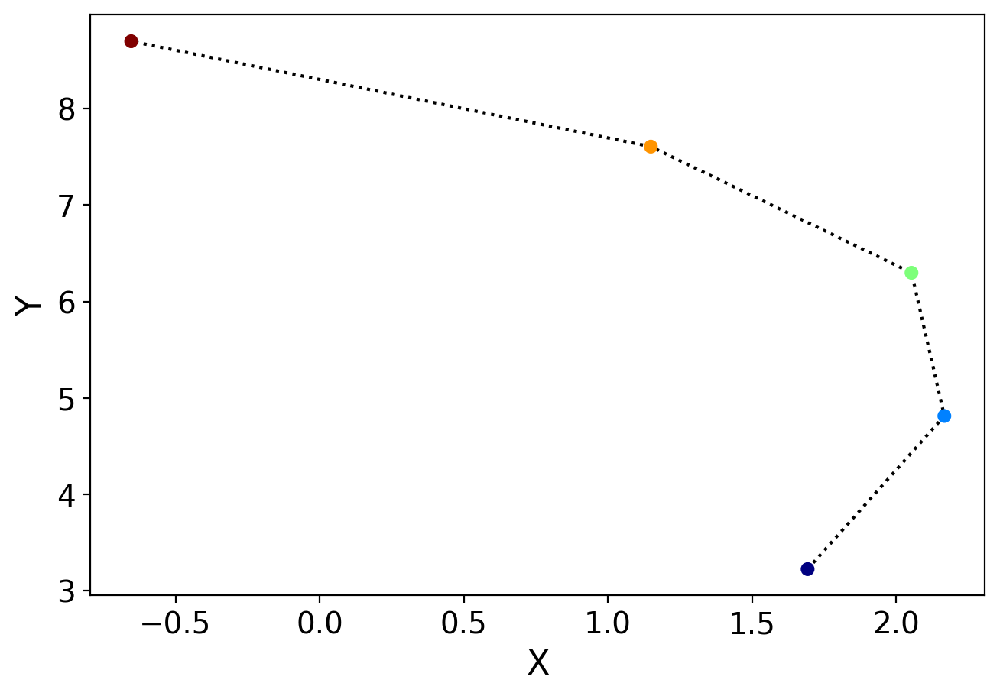

True


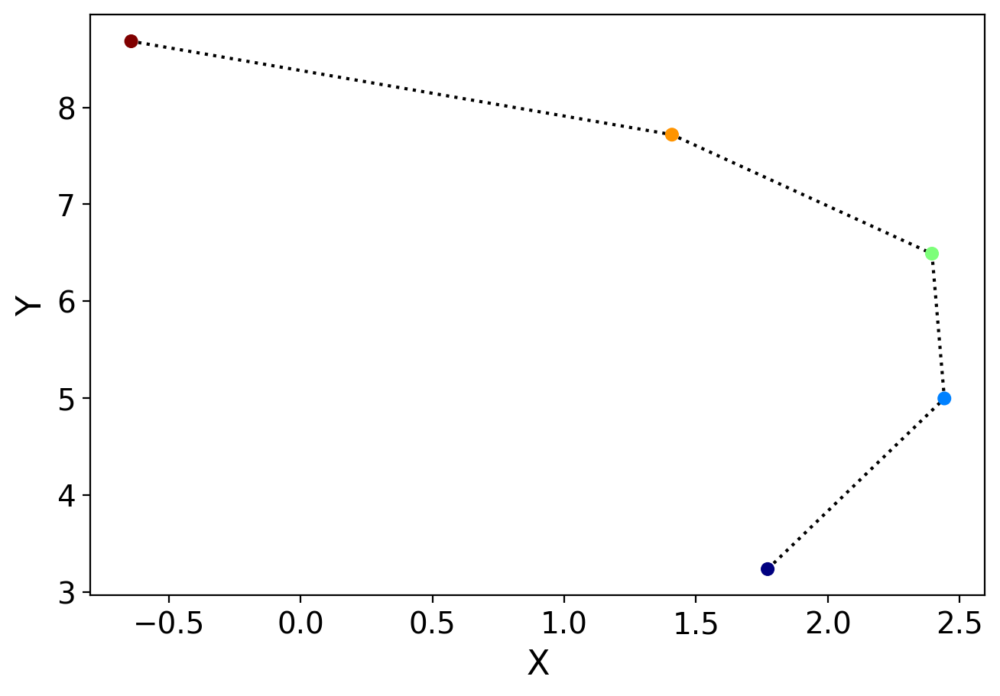

True


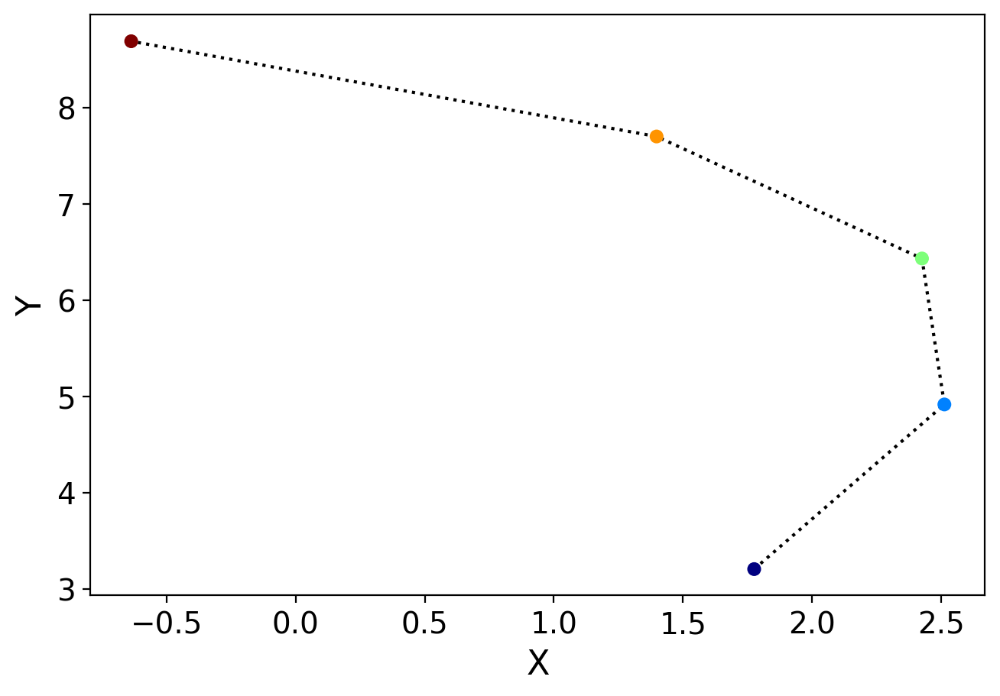

True


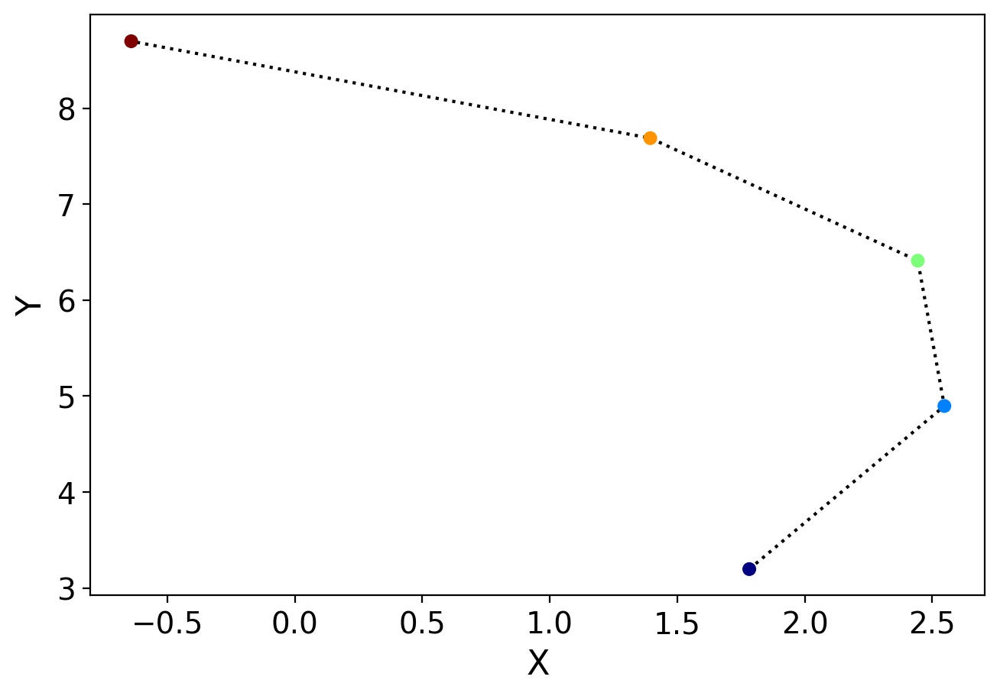

False
X0: 12
[[-3.0158828  -5.78743408 -3.48890029  4.6674408  -0.41709592 -3.82509558
   0.44739669  0.84382571 -2.00021848  0.50070066]
 [-3.79076192 -4.92448489  0.37179438  3.42719373 -0.03880999 -4.6369798
   0.82396241  0.44435991 -1.75592026  0.25811881]
 [-4.56564104 -4.06153569  4.23248904  2.18694666  0.33947594 -5.44886403
   1.20052812  0.04489412 -1.51162205  0.01553697]
 [-5.34052016 -3.1985865   8.09318371  0.94669959  0.71776186 -6.26074826
   1.57709383 -0.35457168 -1.26732384 -0.22704488]
 [-6.11539929 -2.3356373  11.95387837 -0.29354748  1.09604779 -7.07263248
   1.95365954 -0.75403747 -1.02302563 -0.46962673]]


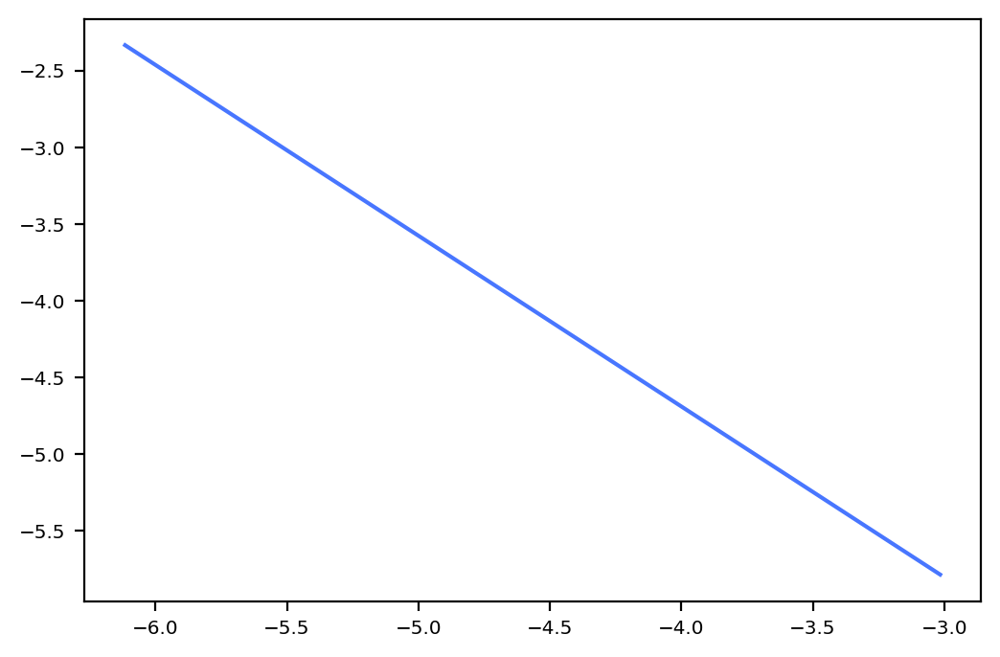

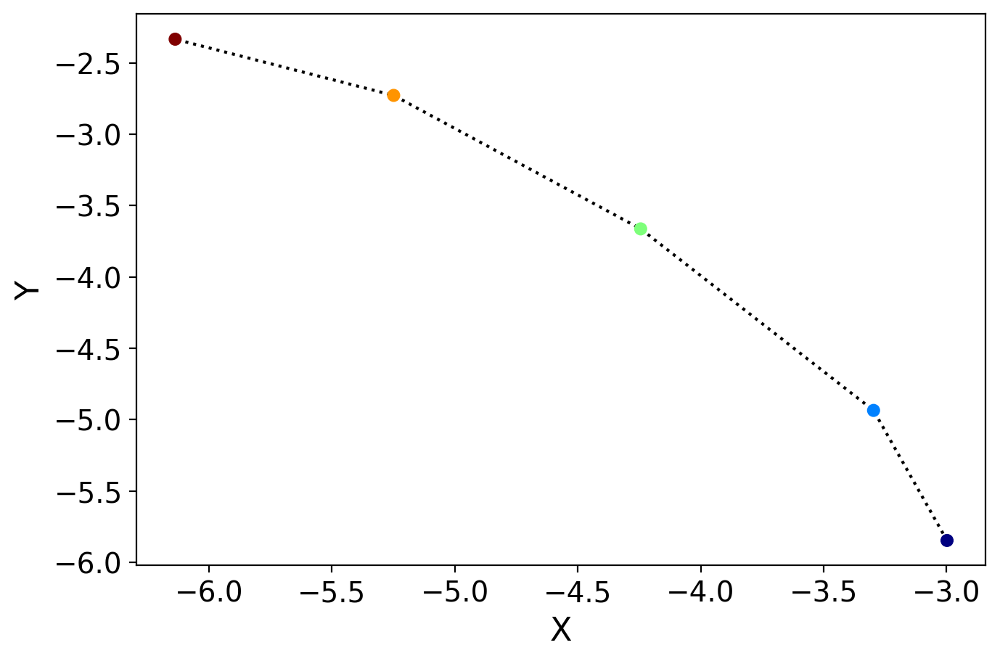

True


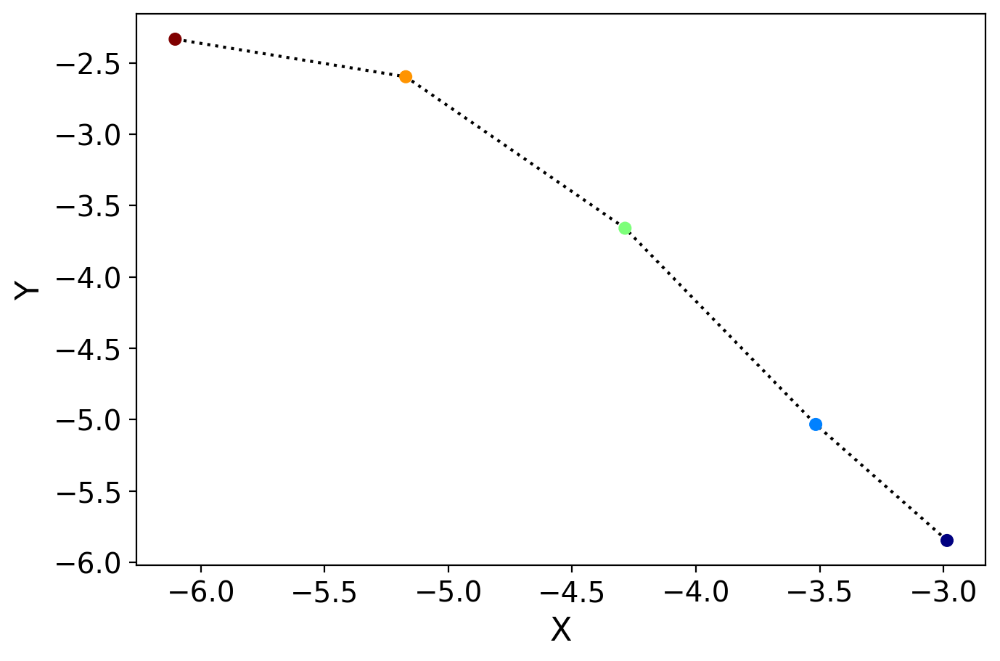

True


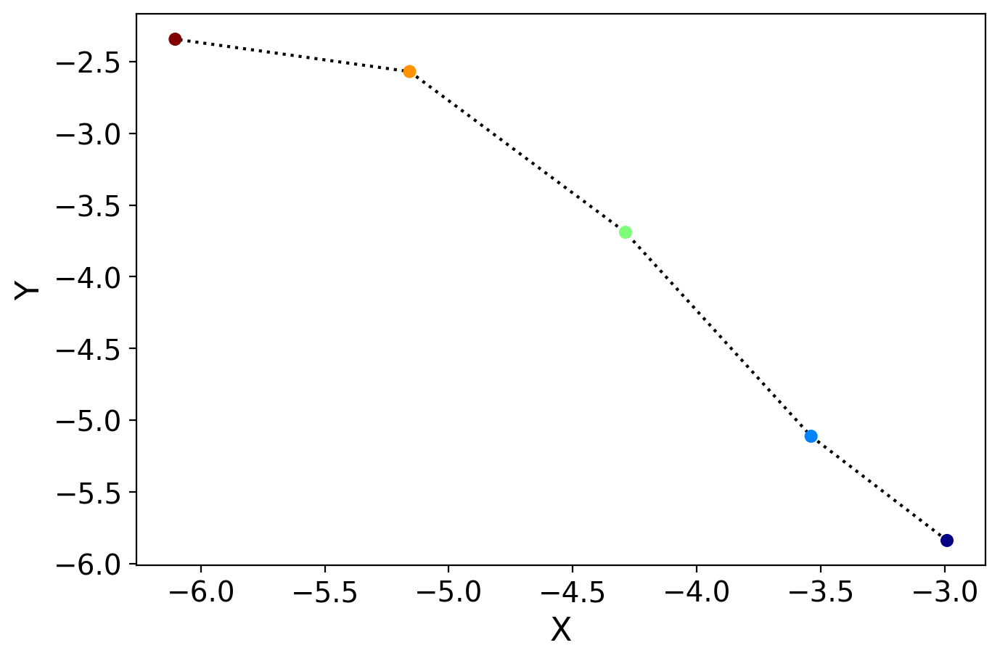

True


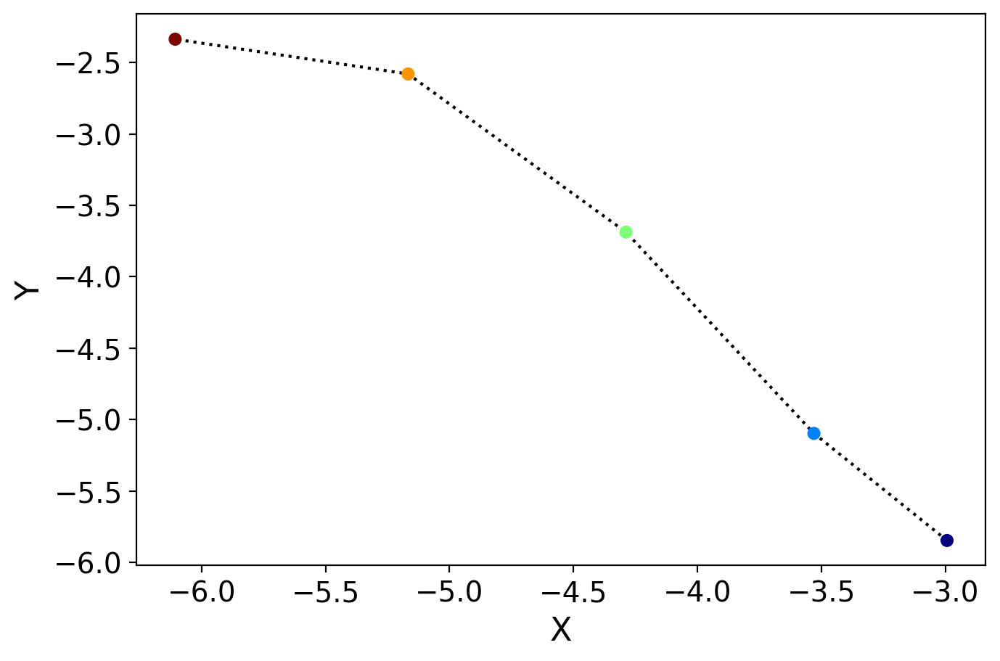

False
X0: 19
[[-3.18431639 -5.97830252 -3.35535093  4.97757891 -0.69010964 -3.62866334
   0.43237475  1.18714361 -1.29386135  0.73159484]
 [-3.72234915 -5.11567773  0.67711536  3.93960356 -0.12263845 -3.94069293
   0.86979733  0.7285093  -1.08042865  0.34689798]
 [-4.26038191 -4.25305293  4.70958166  2.90162822  0.44483274 -4.25272252
   1.3072199   0.26987498 -0.86699596 -0.03779889]
 [-4.79841466 -3.39042813  8.74204795  1.86365287  1.01230393 -4.56475211
   1.74464247 -0.18875934 -0.65356326 -0.42249575]
 [-5.33644742 -2.52780334 12.77451424  0.82567752  1.57977511 -4.87678169
   2.18206504 -0.64739366 -0.44013057 -0.80719261]]


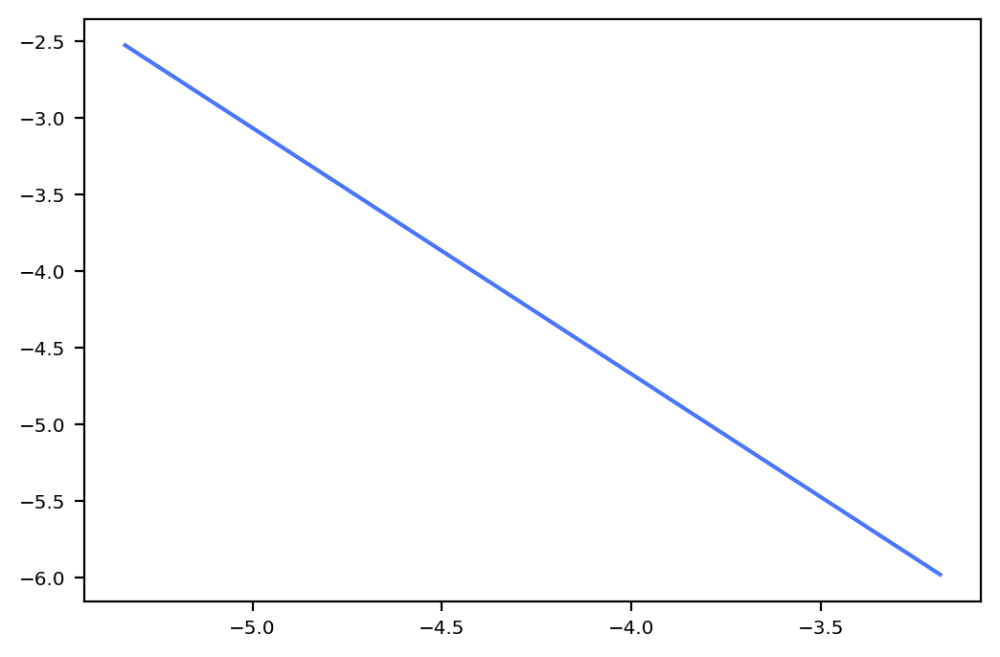

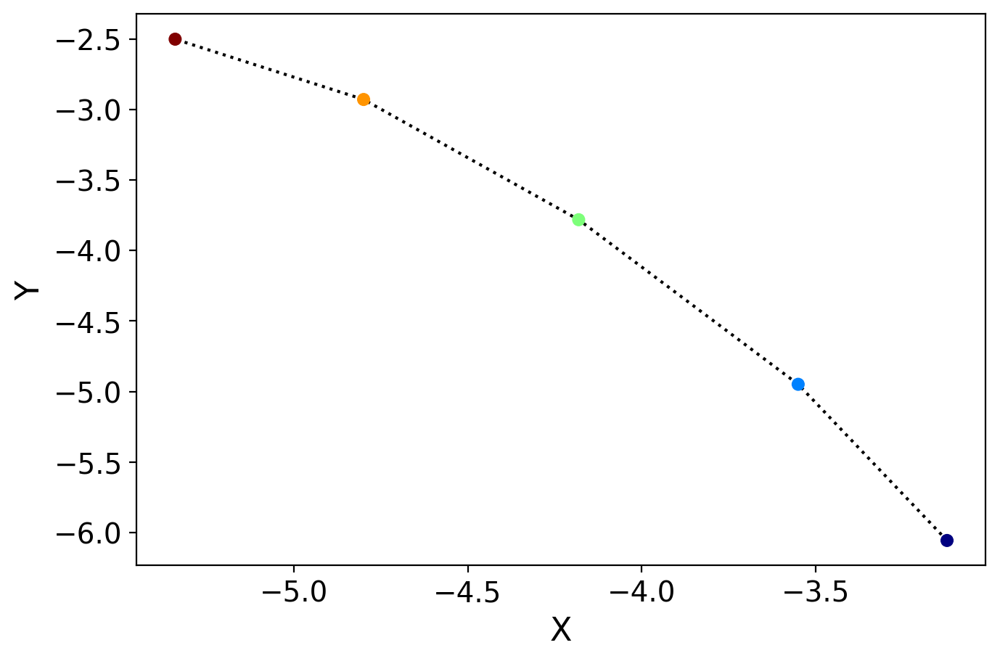

True


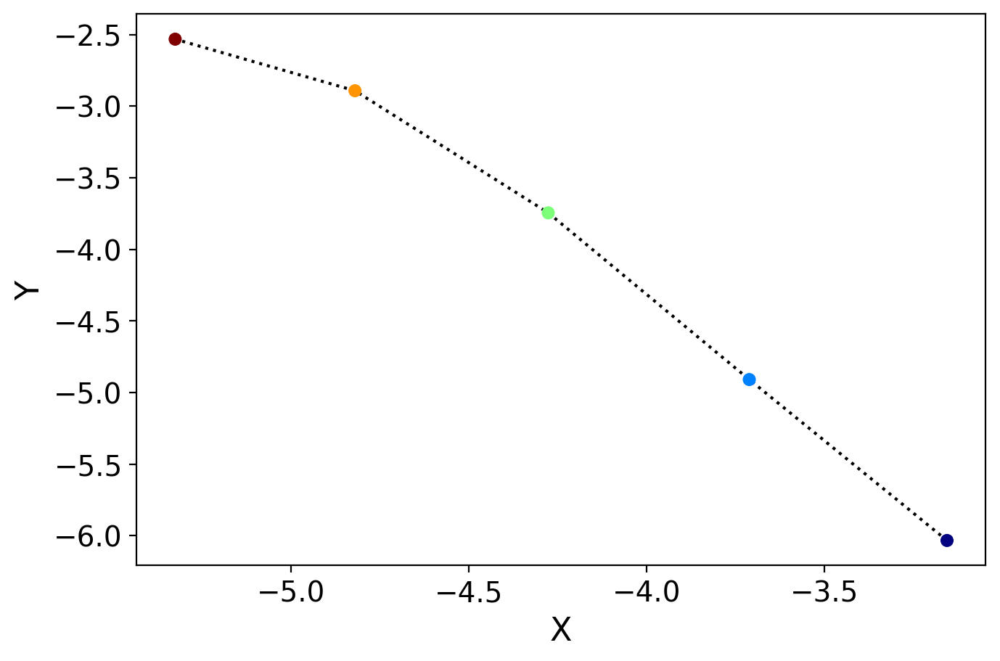

True


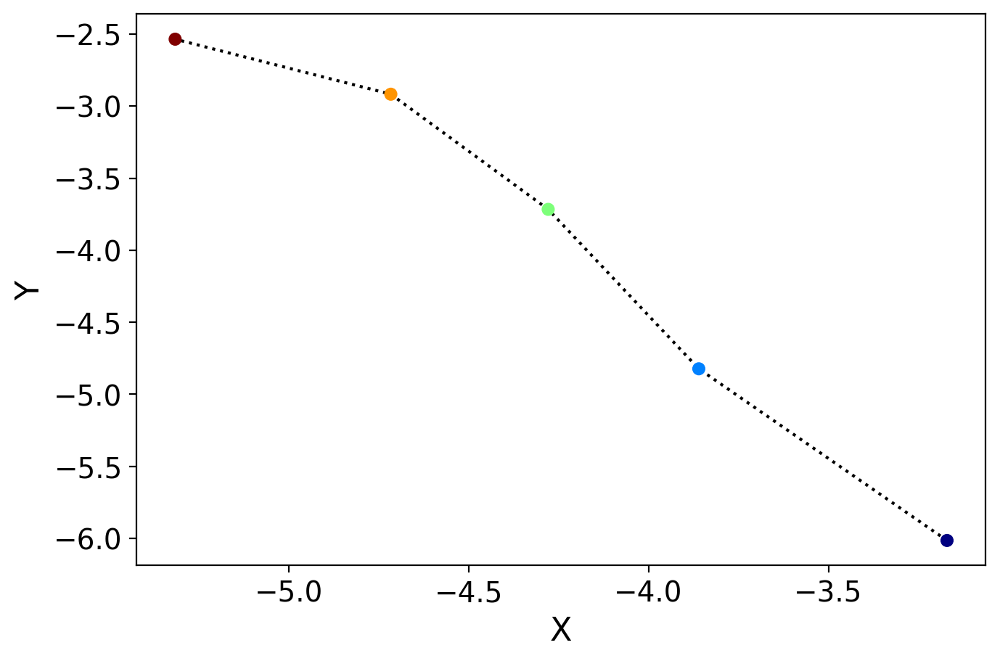

True


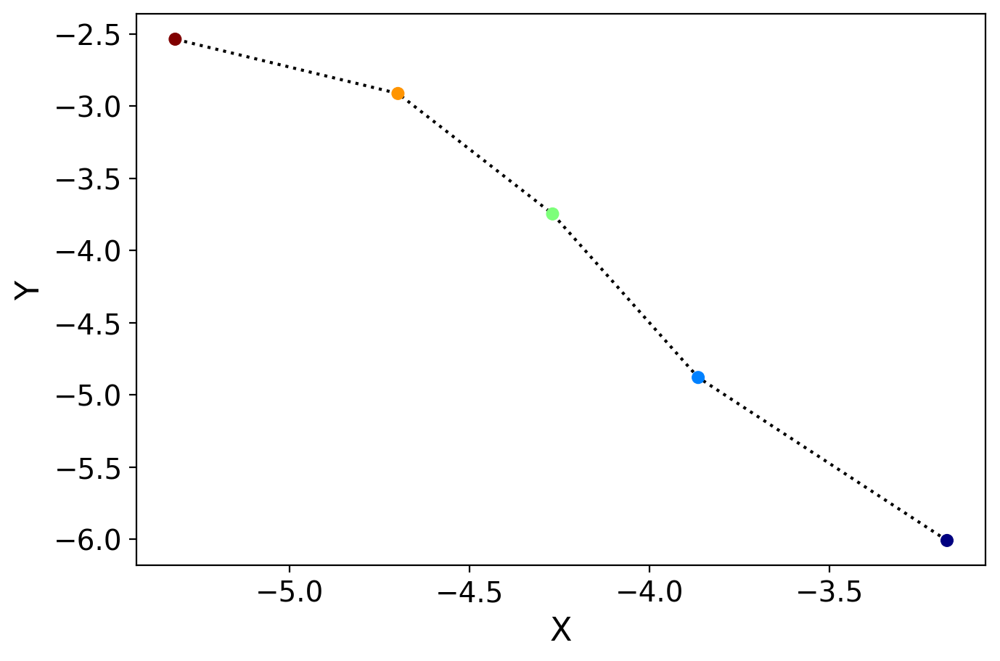

True


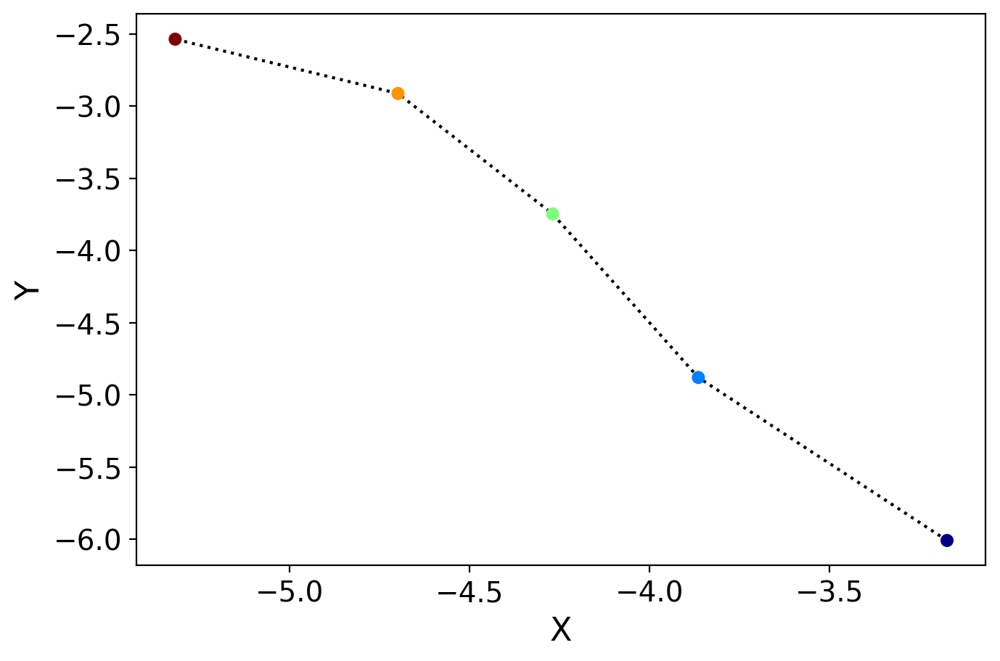

True


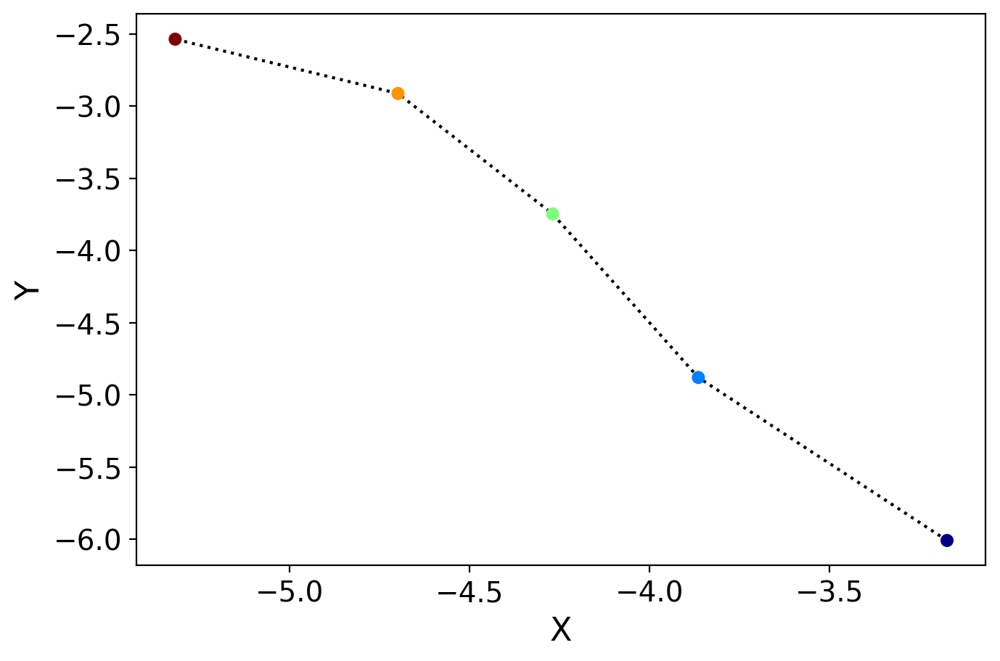

False
X0: 81
[[ 1.72044651  3.41131027 -3.34558108 -0.77908817  0.44551336  1.44462341
   0.13221177 -0.82860151 -0.44171144  0.84548827]
 [ 1.03524115  4.6729068  -0.96576721 -1.94785257  1.06331563  0.91626636
   0.14341286 -0.9355081  -0.25029679  0.490254  ]
 [ 0.3500358   5.93450334  1.41404666 -3.11661697  1.68111789  0.38790932
   0.15461394 -1.04241469 -0.05888215  0.13501973]
 [-0.33516955  7.19609987  3.79386053 -4.28538137  2.29892016 -0.14044773
   0.16581502 -1.14932128  0.1325325  -0.22021453]
 [-1.0203749   8.45769641  6.1736744  -5.45414577  2.91672242 -0.66880477
   0.1770161  -1.25622787  0.32394714 -0.5754488 ]]


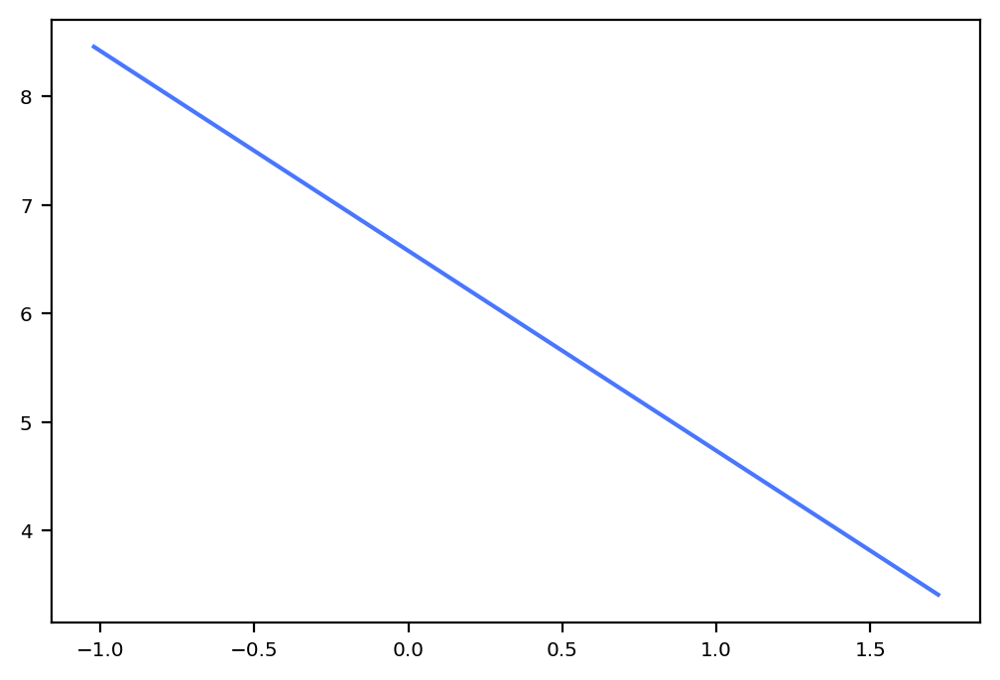

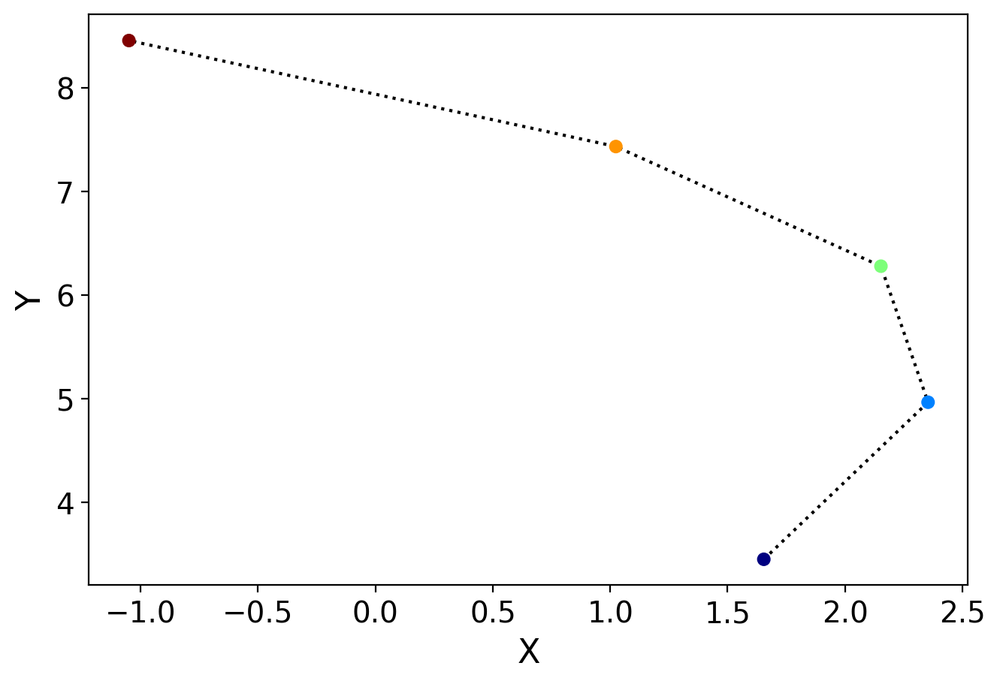

True


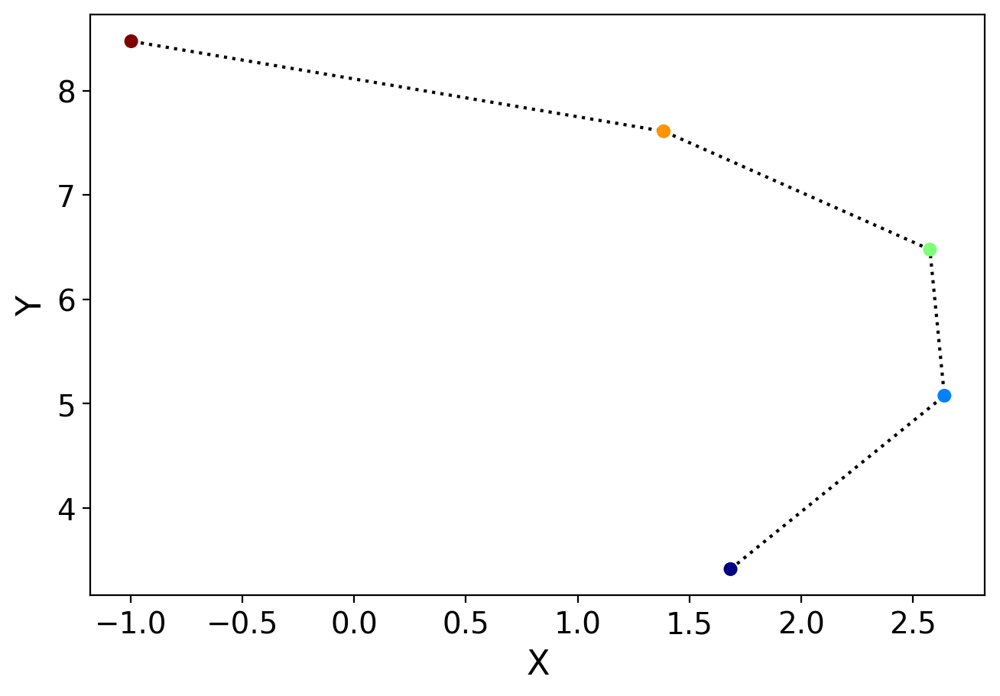

True


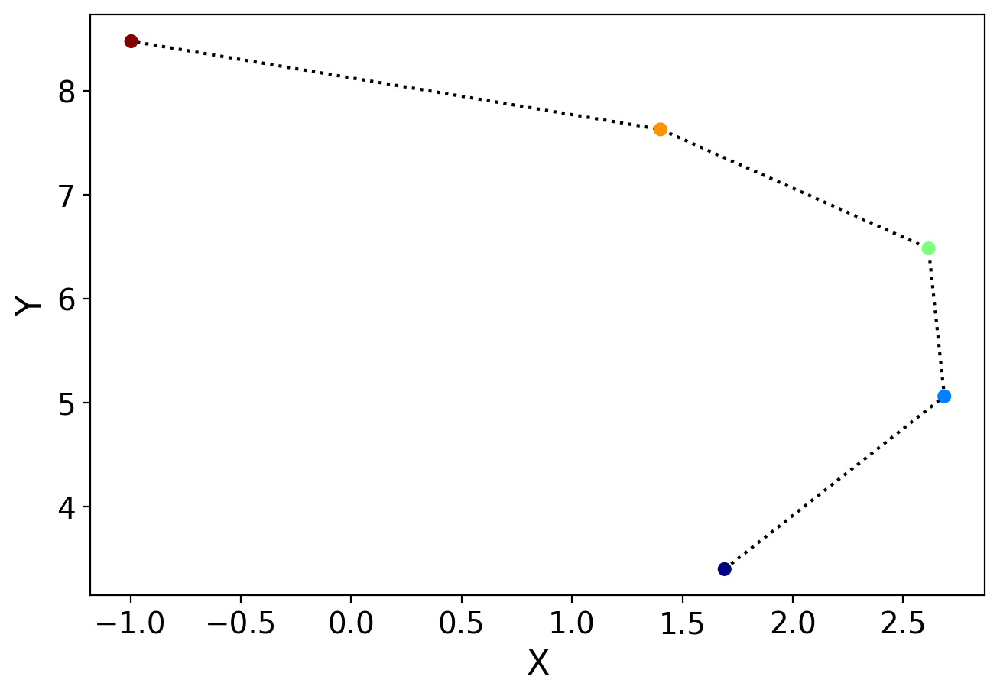

True


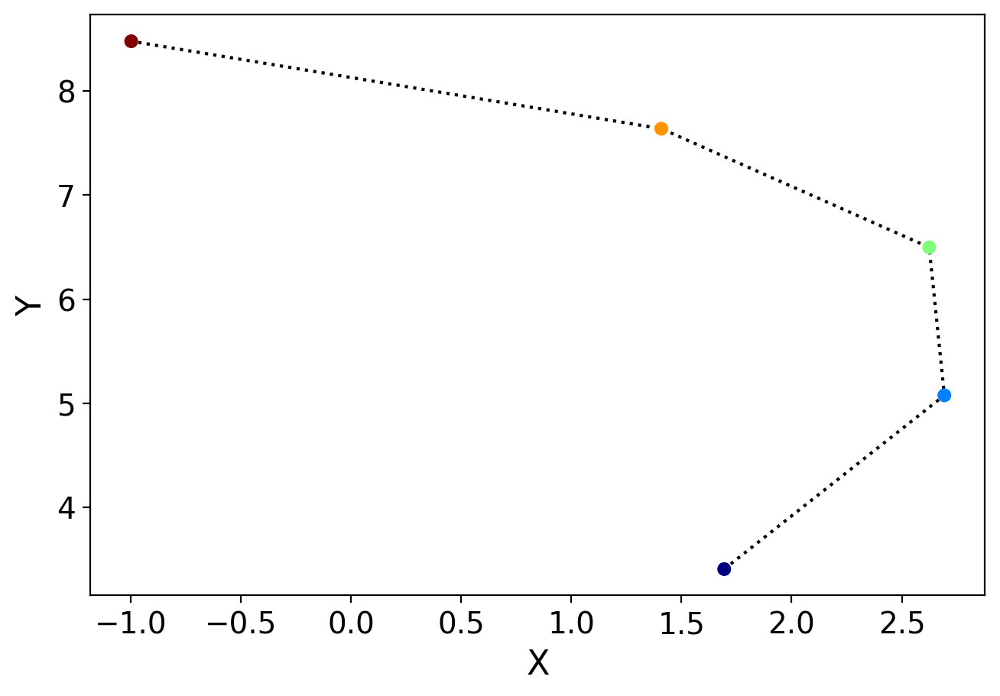

True


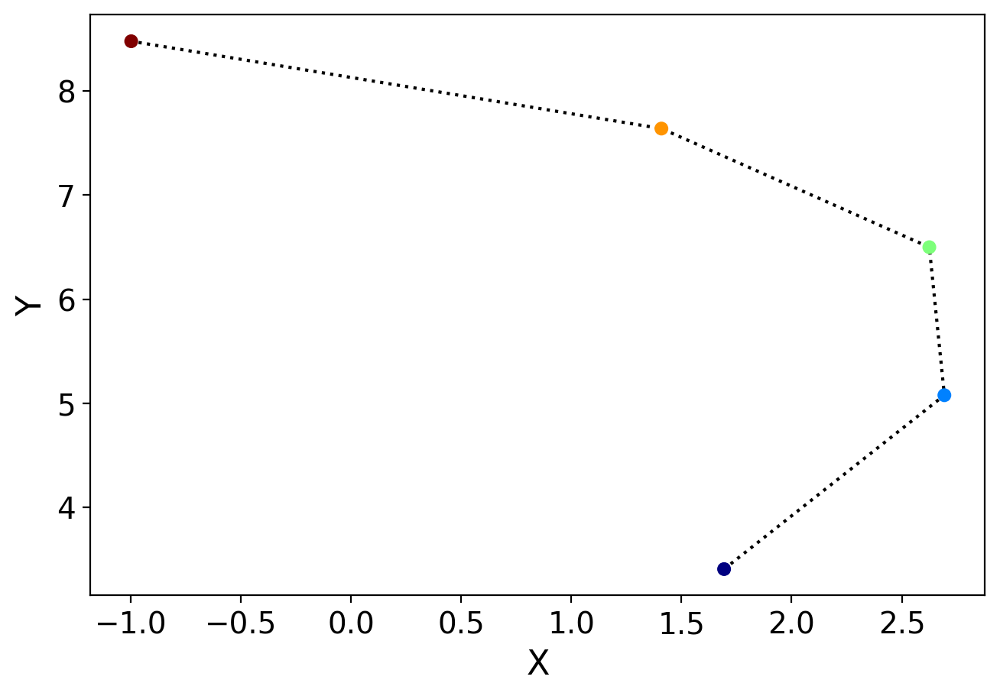

False
X0: 84
[[ 1.93991144  3.43293359 -3.50617704 -0.63723887  0.17609898  1.77370353
   0.20517541 -0.48161946 -0.40825503  0.83882669]
 [ 1.07597477  4.70417613 -1.01539152 -1.98432213  0.87305882  1.03677237
   0.14921423 -0.60696294 -0.04715499  0.43994644]
 [ 0.2120381   5.97541868  1.475394   -3.3314054   1.57001865  0.29984121
   0.09325304 -0.73230642  0.31394505  0.04106619]
 [-0.65189856  7.24666123  3.96617952 -4.67848866  2.26697848 -0.43708996
   0.03729186 -0.8576499   0.67504509 -0.35781406]
 [-1.51583523  8.51790377  6.45696504 -6.02557193  2.96393831 -1.17402112
  -0.01866933 -0.98299339  1.03614513 -0.75669431]]


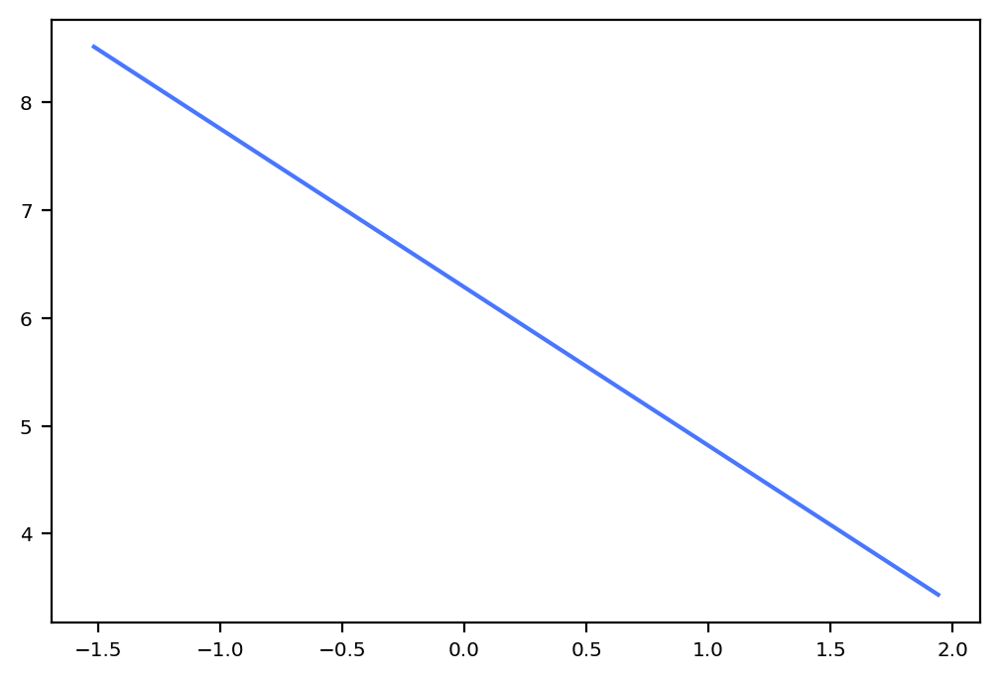

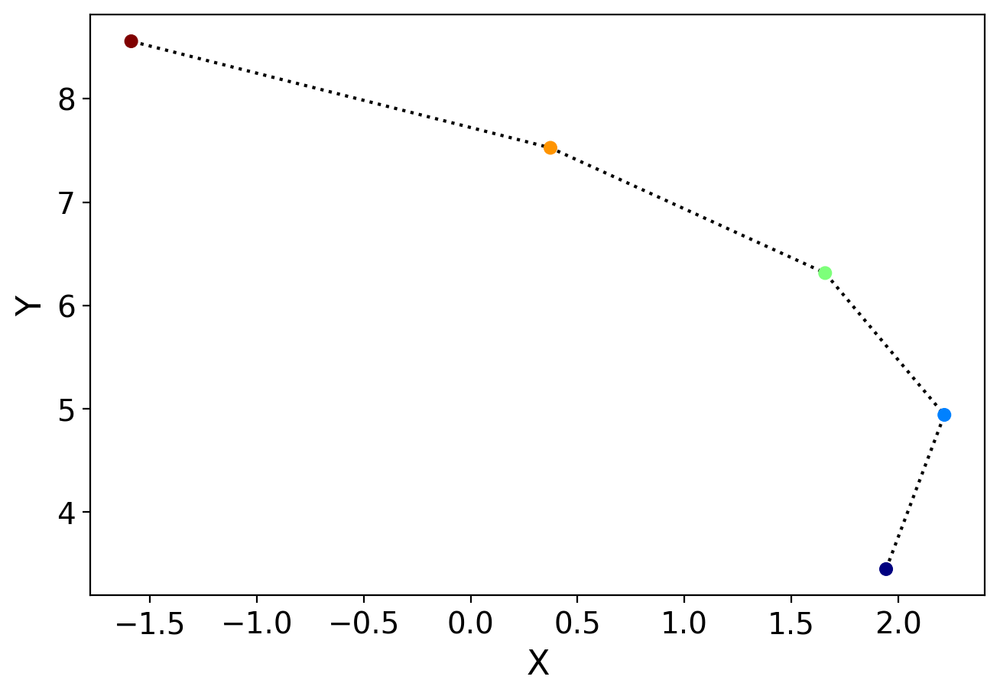

True


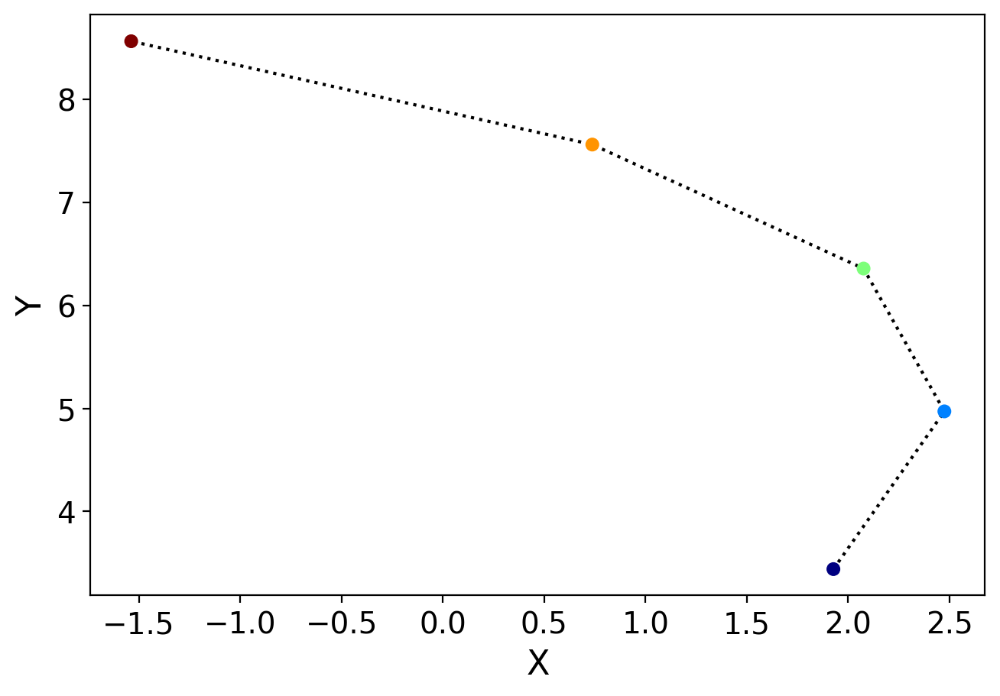

True


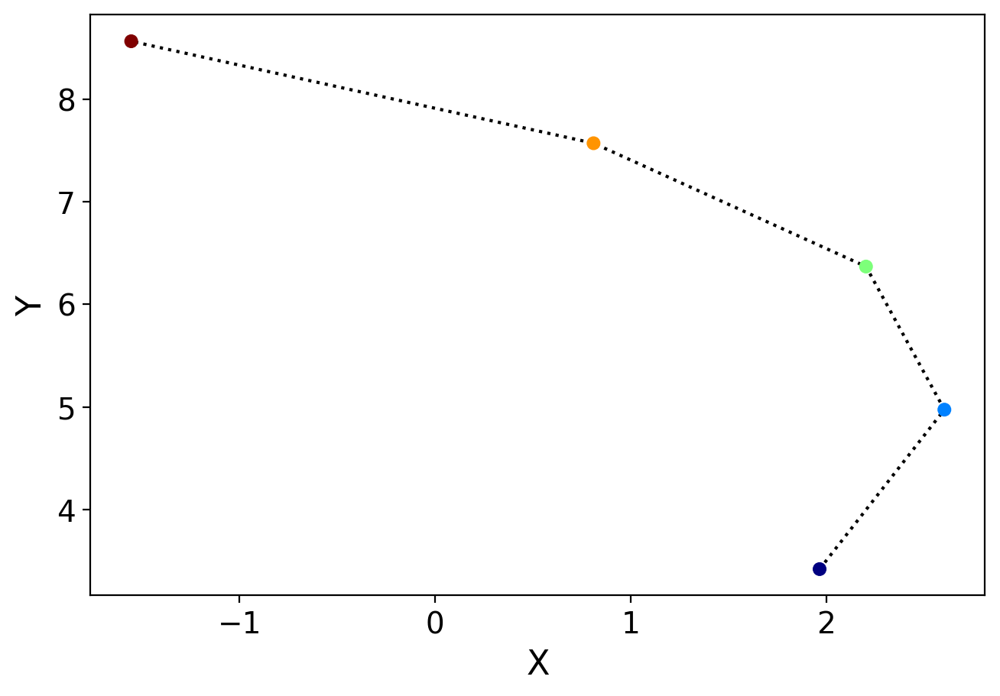

True


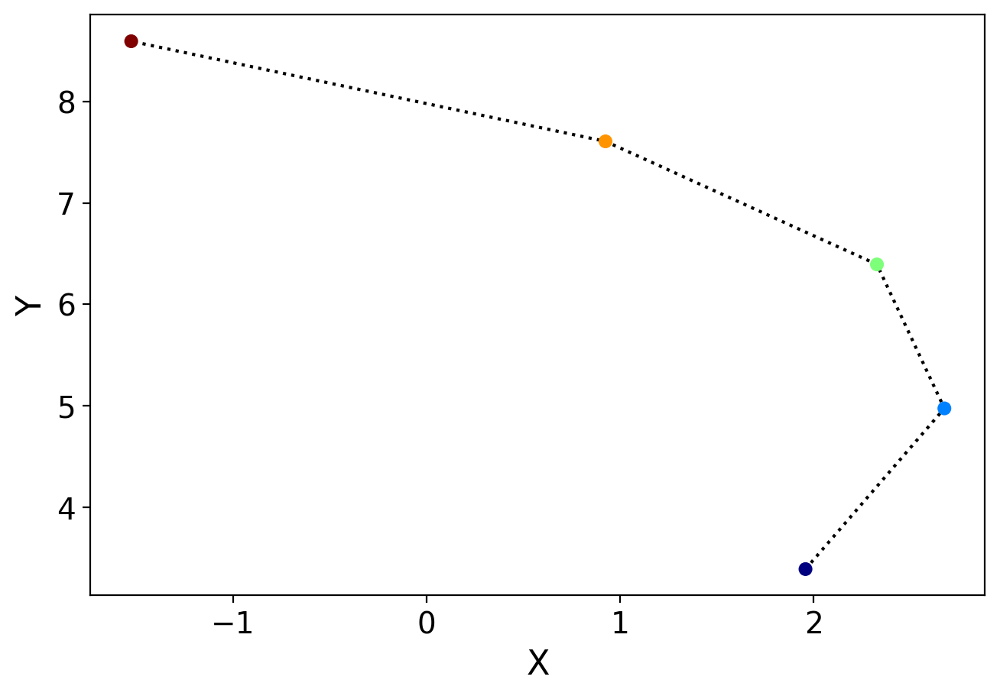

True


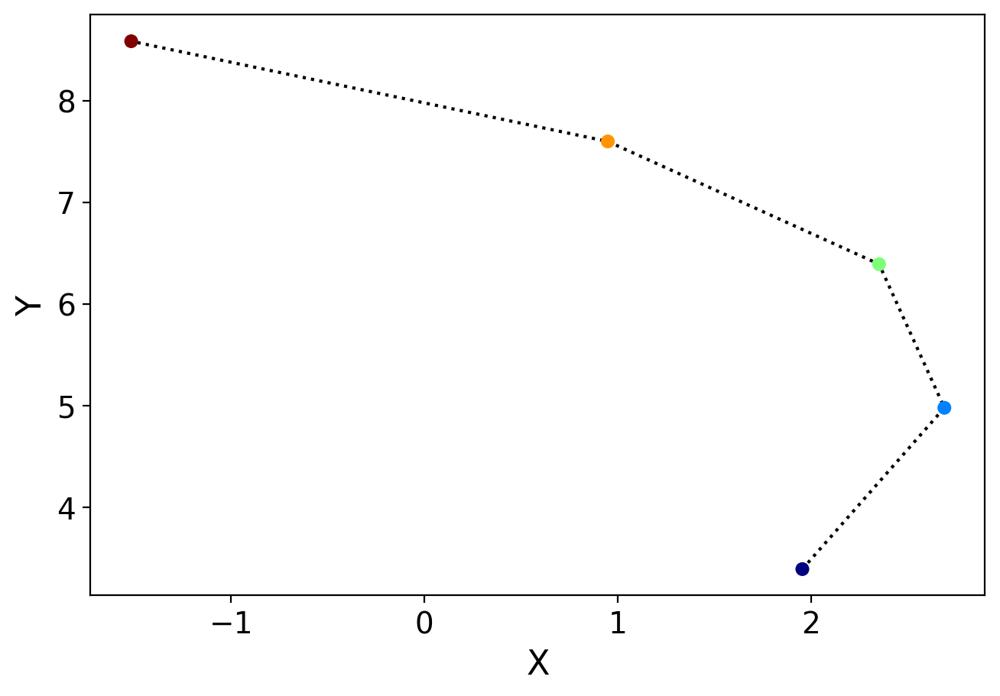

True


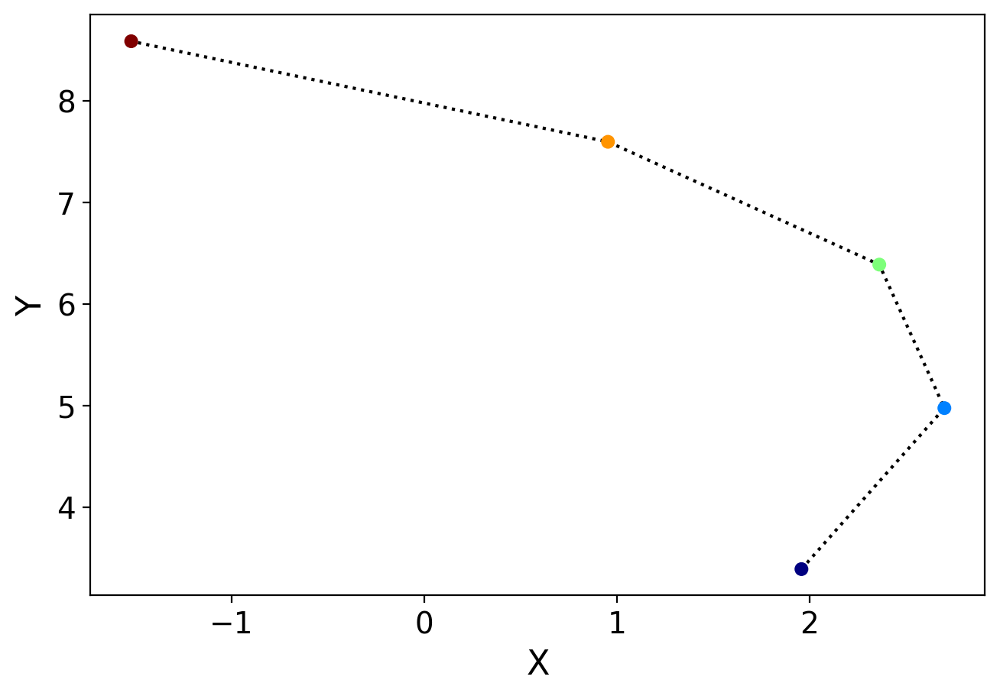

True


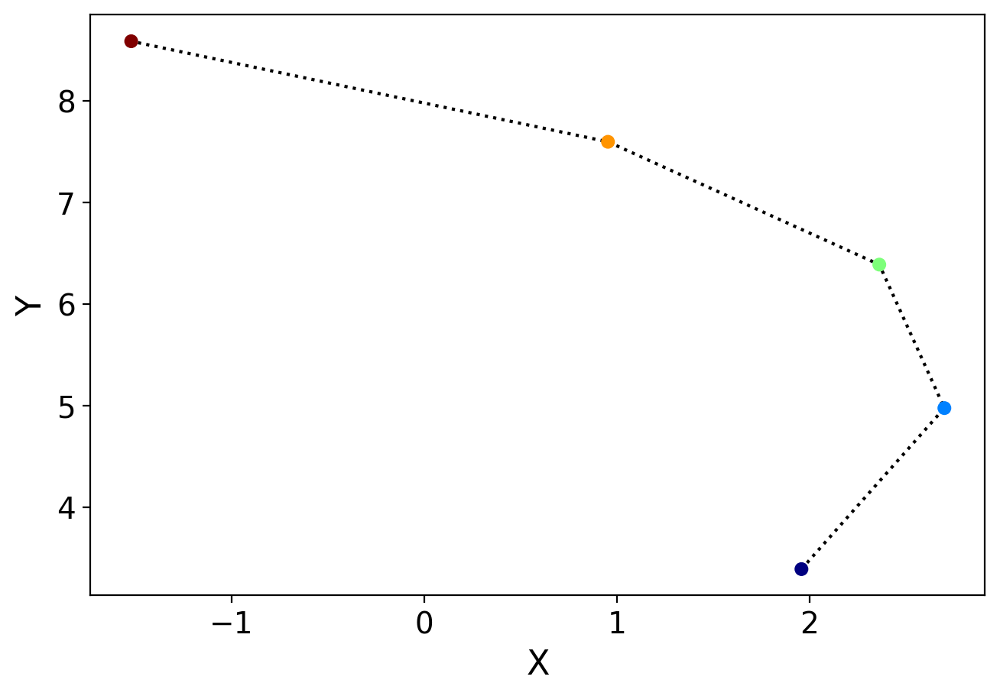

False
X0: 16
[[-1.10240242 -5.58288298 -3.25905487  3.40850555  0.215375   -1.64344894
   0.12427738  0.95272557 -0.62527612  0.53626399]
 [-2.39249194 -4.62636322  0.60253383  2.11588364  0.82329768 -3.12113798
   0.47120323  0.69965038 -0.55643782  0.21777575]
 [-3.68258146 -3.66984346  4.46412253  0.82326173  1.43122035 -4.59882701
   0.81812908  0.4465752  -0.48759952 -0.1007125 ]
 [-4.97267099 -2.71332369  8.32571123 -0.46936019  2.03914303 -6.07651604
   1.16505494  0.19350001 -0.41876122 -0.41920074]
 [-6.26276051 -1.75680393 12.18729993 -1.7619821   2.6470657  -7.55420508
   1.51198079 -0.05957518 -0.34992292 -0.73768898]]


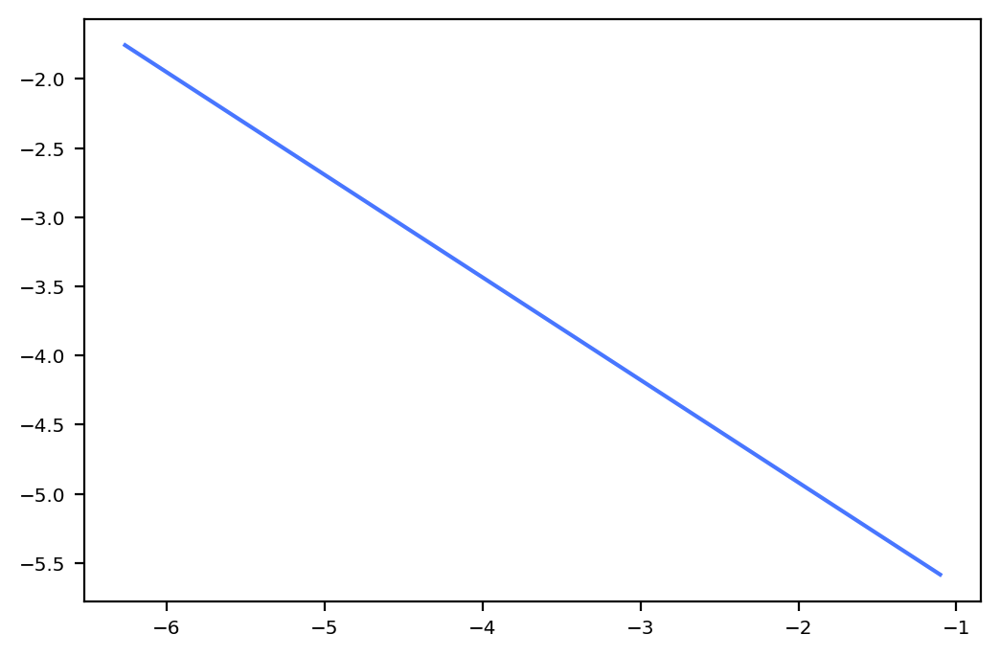

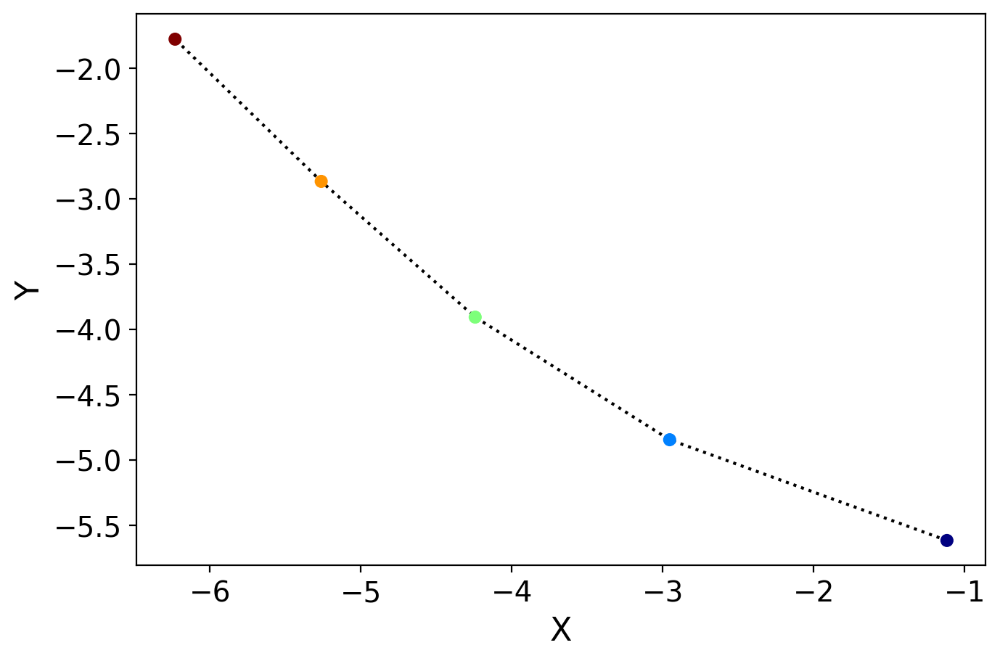

True


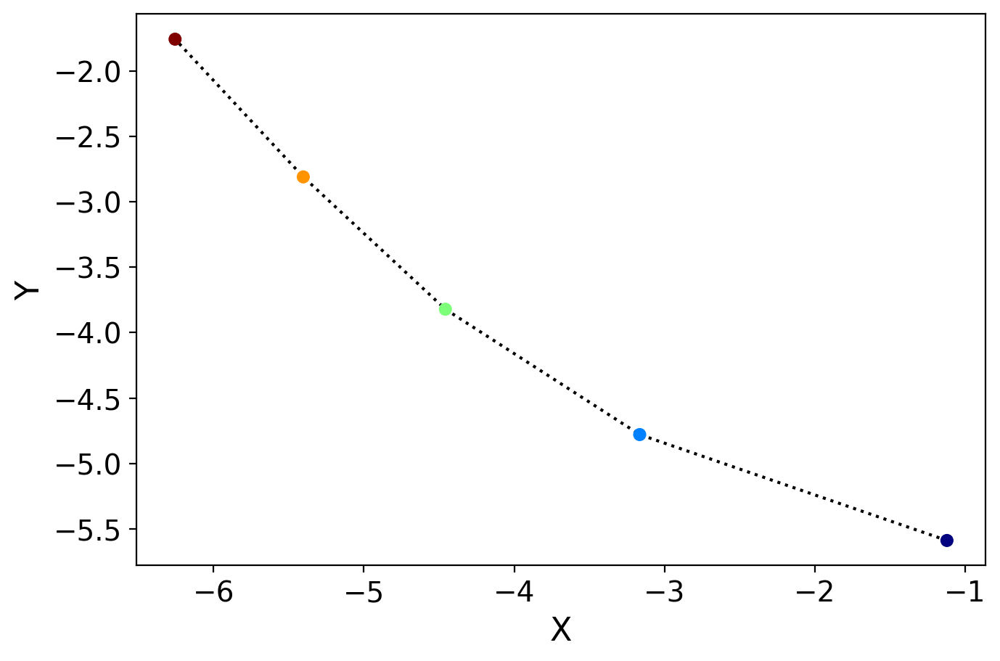

True


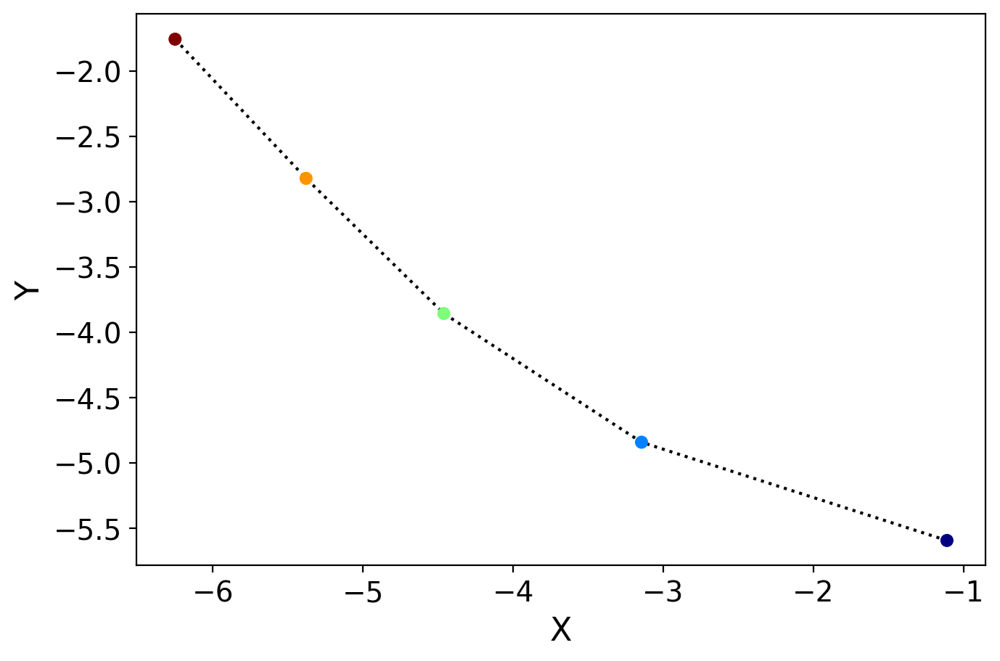

True


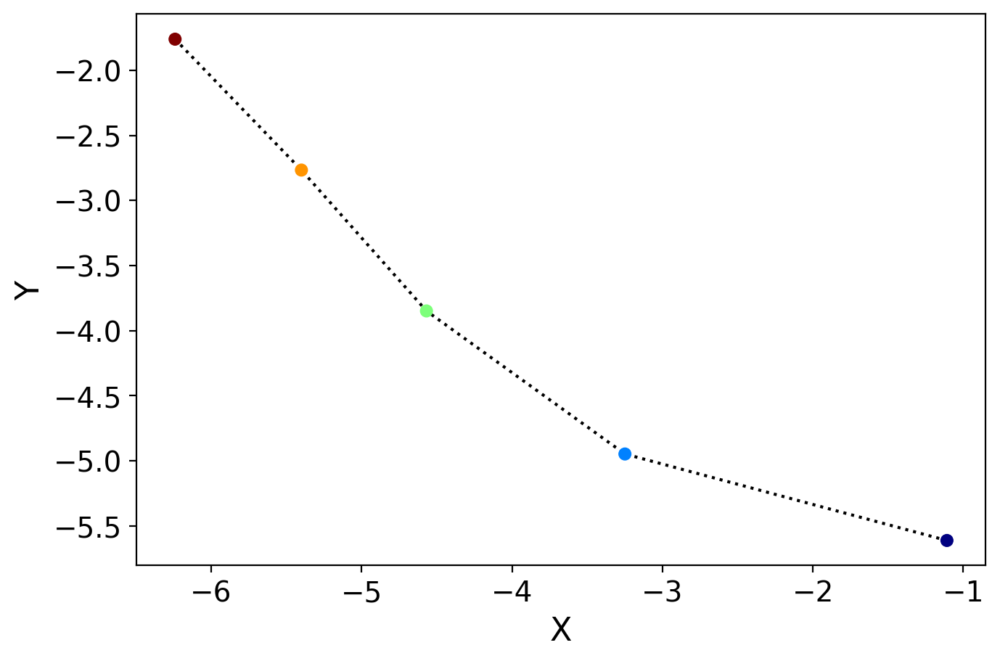

True


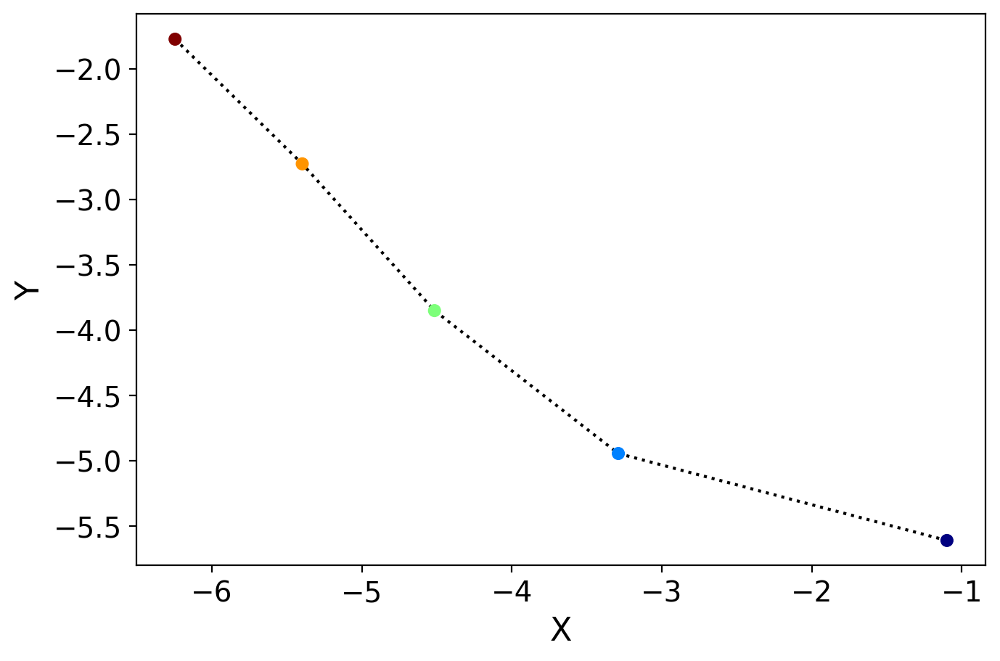

False
X0: 90
[[ 1.43268605  3.61020791 -3.38824807 -0.25039916  0.442223    1.48107812
   0.12659786 -0.50118294 -0.08594398  0.8161827 ]
 [ 0.796513    4.83658858 -0.92941419 -1.59092695  1.09732347  0.82169115
   0.18141413 -0.66350357  0.12759424  0.4171546 ]
 [ 0.16033996  6.06296925  1.5294197  -2.93145473  1.75242395  0.16230417
   0.2362304  -0.8258242   0.34113245  0.0181265 ]
 [-0.47583309  7.28934992  3.98825358 -4.27198252  2.40752442 -0.49708281
   0.29104666 -0.98814483  0.55467066 -0.3809016 ]
 [-1.11200613  8.51573059  6.44708746 -5.6125103   3.0626249  -1.15646979
   0.34586293 -1.15046546  0.76820888 -0.77992971]]


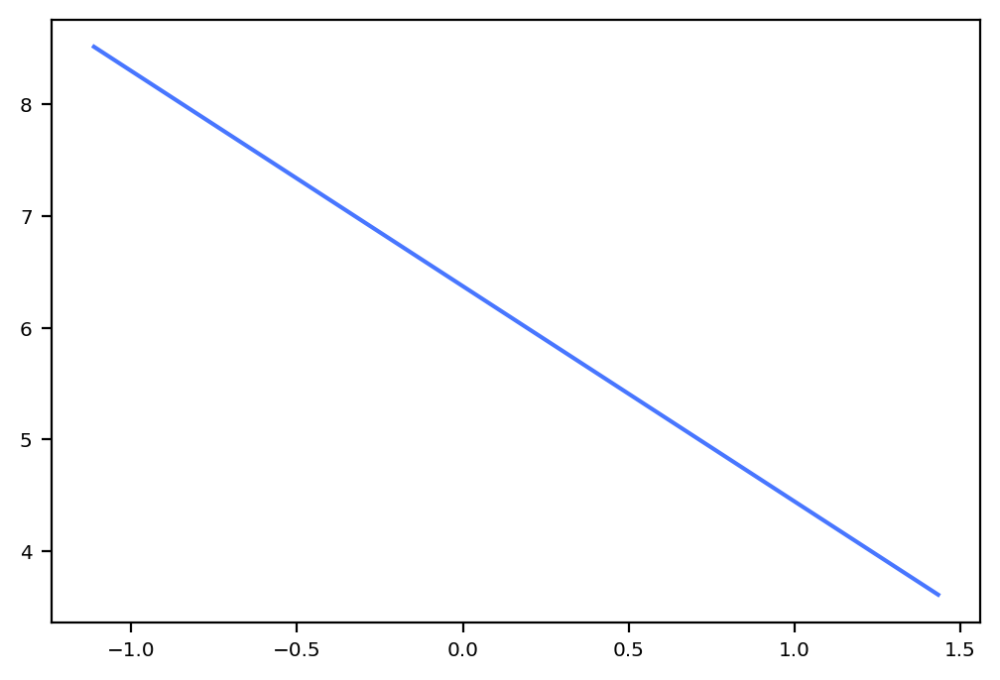

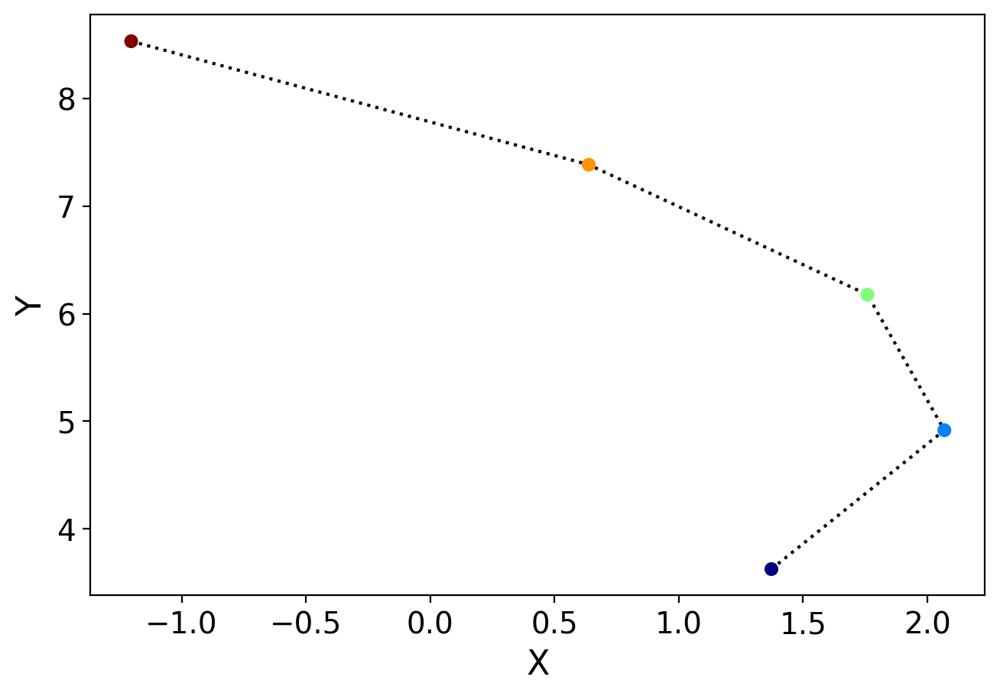

True


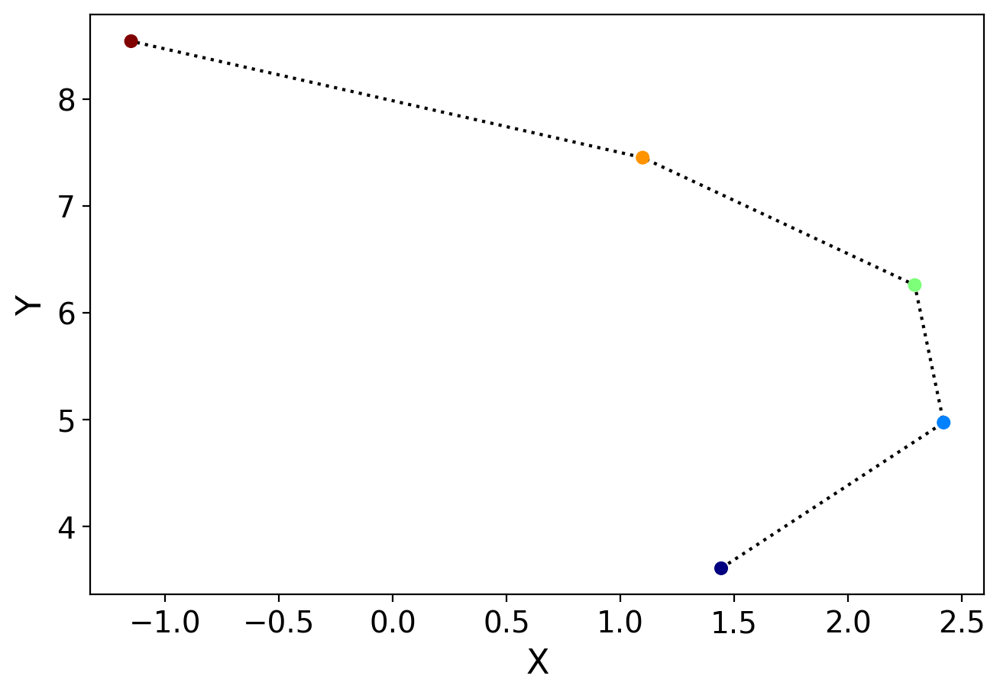

True


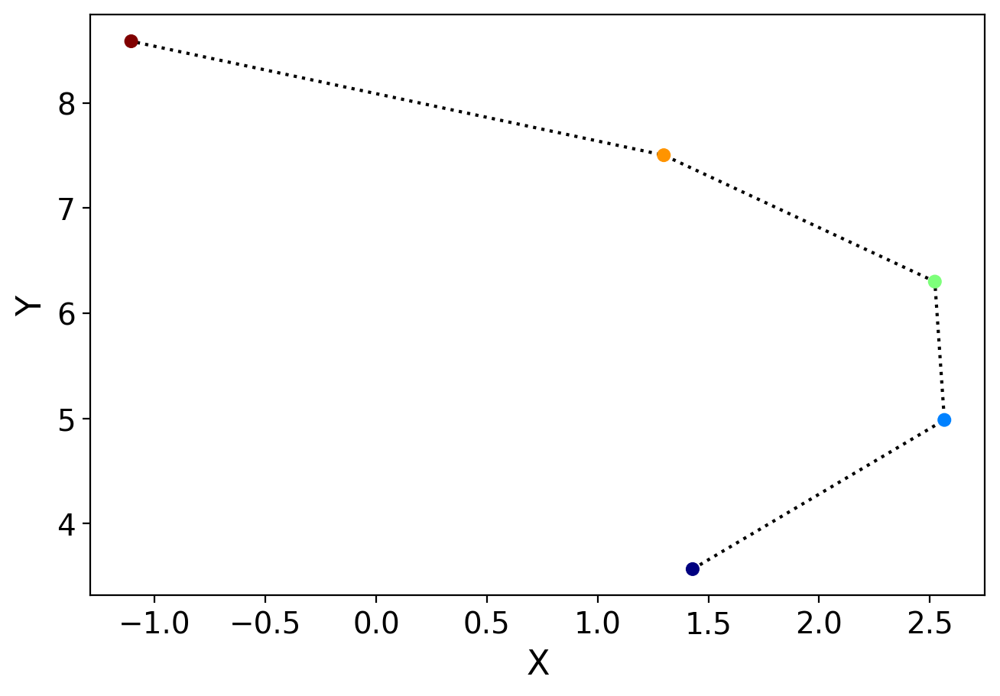

True


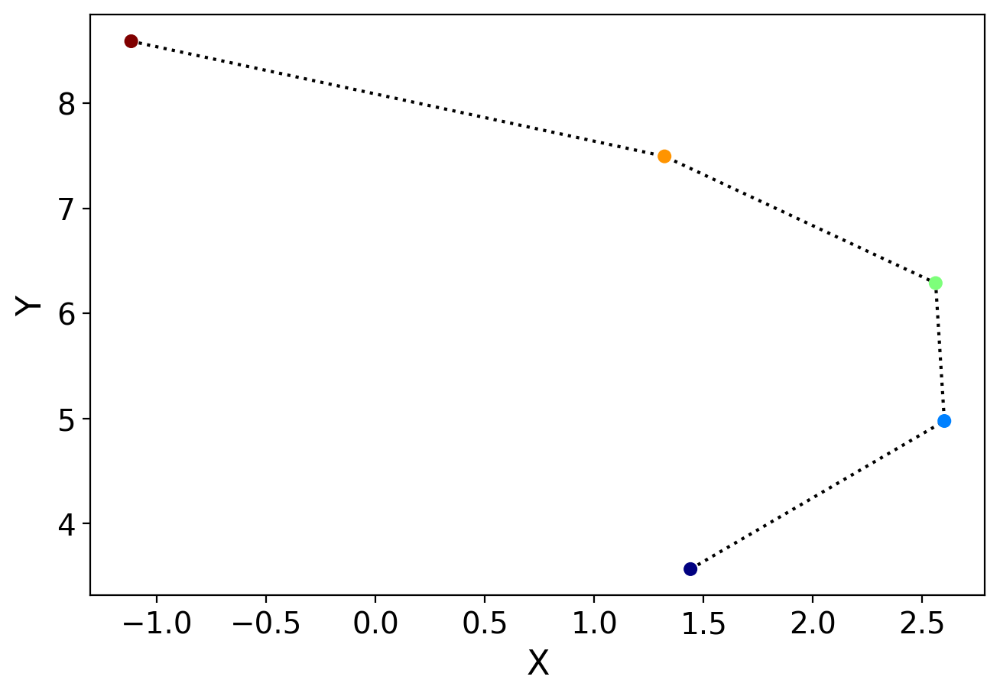

True


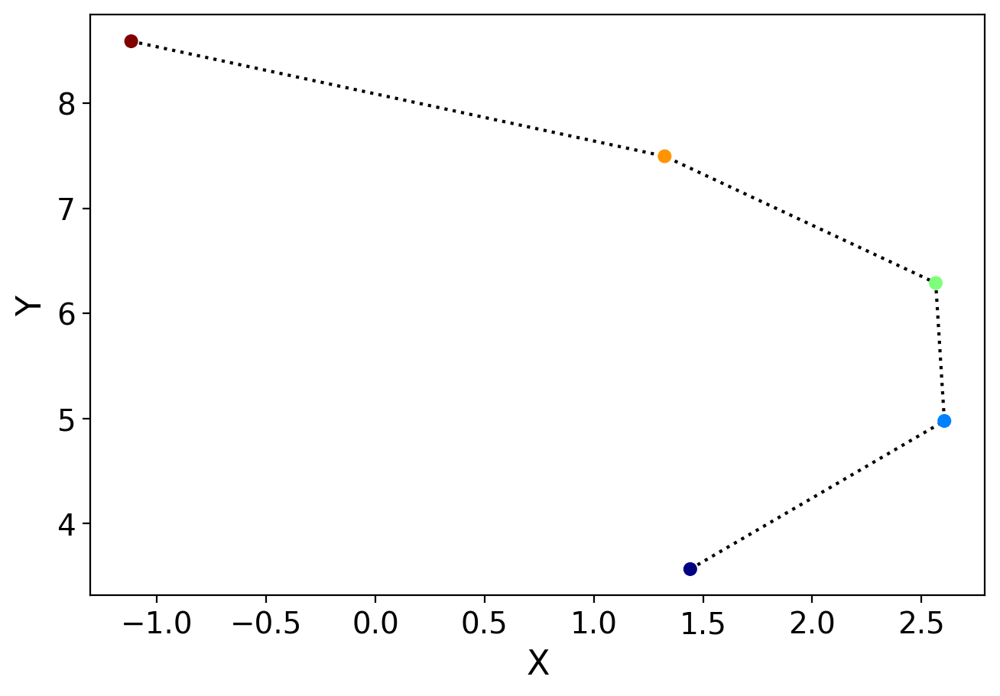

True


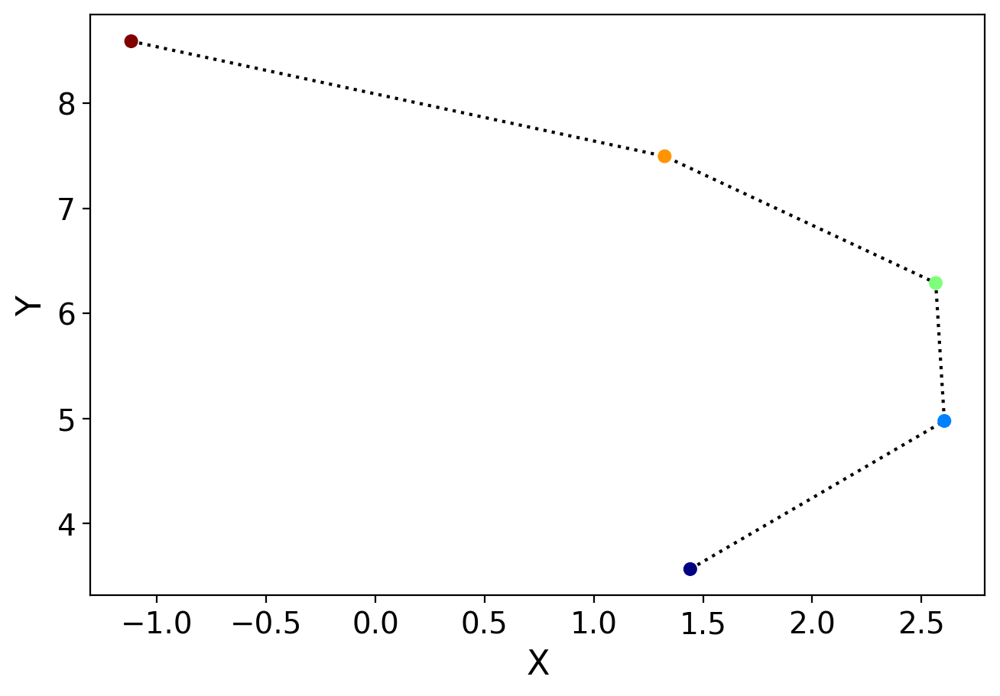

False
X0: 10
[[-2.78439762 -5.53281601 -3.69139774  4.31822057 -0.45845619 -2.88183166
   0.02248402 -0.23376387 -2.66292842  0.81702636]
 [-3.3507317  -4.57166342  0.42668591  3.34560842  0.05146822 -3.3494607
   0.43923871 -0.16975461 -2.02102321  0.22593729]
 [-3.91706577 -3.61051084  4.54476956  2.37299626  0.56139263 -3.81708974
   0.85599341 -0.10574535 -1.379118   -0.36515177]
 [-4.48339985 -2.64935825  8.66285321  1.40038411  1.07131704 -4.28471878
   1.2727481  -0.0417361  -0.73721279 -0.95624083]
 [-5.04973392 -1.68820566 12.78093687  0.42777195  1.58124145 -4.75234782
   1.6895028   0.02227316 -0.09530758 -1.5473299 ]]


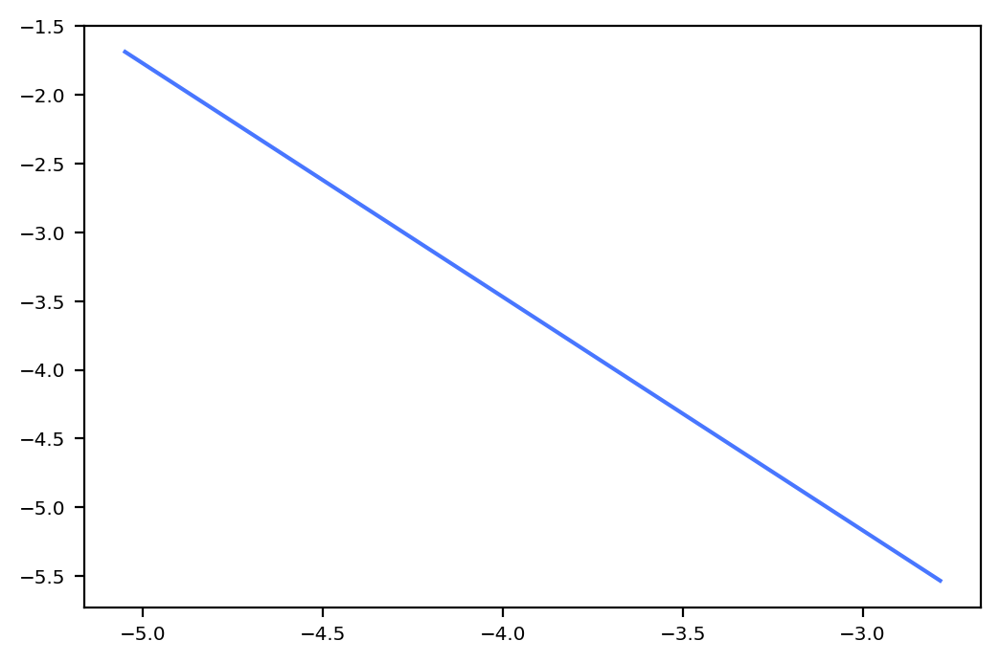

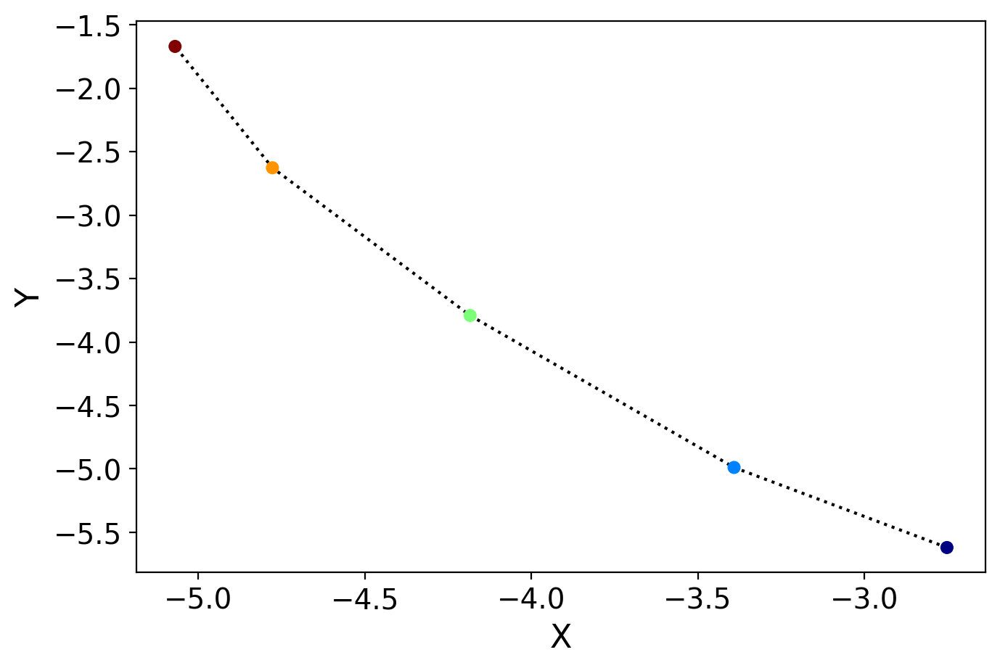

True


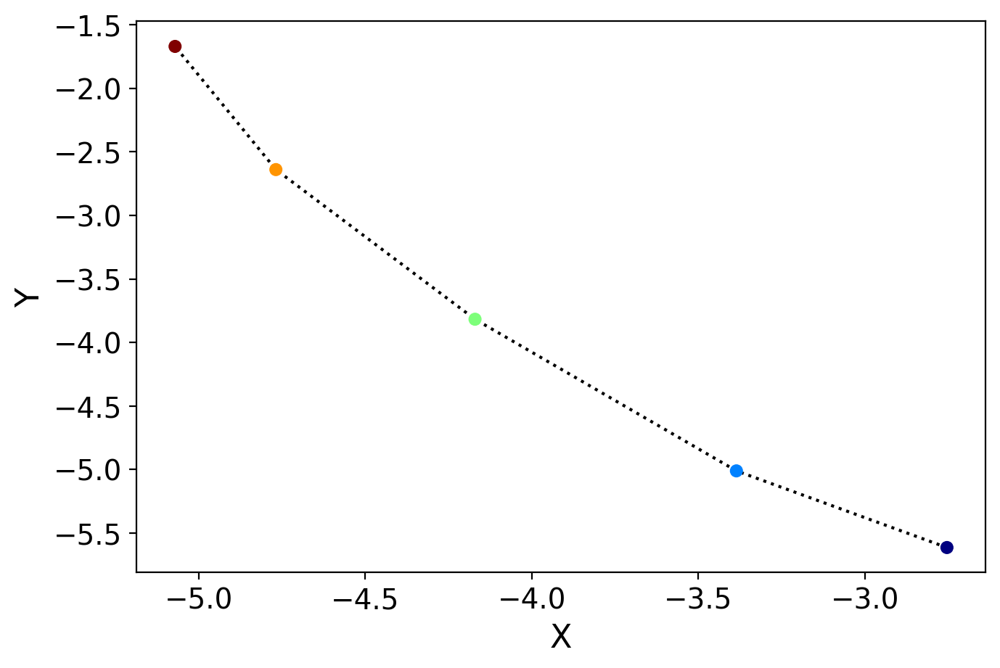

True


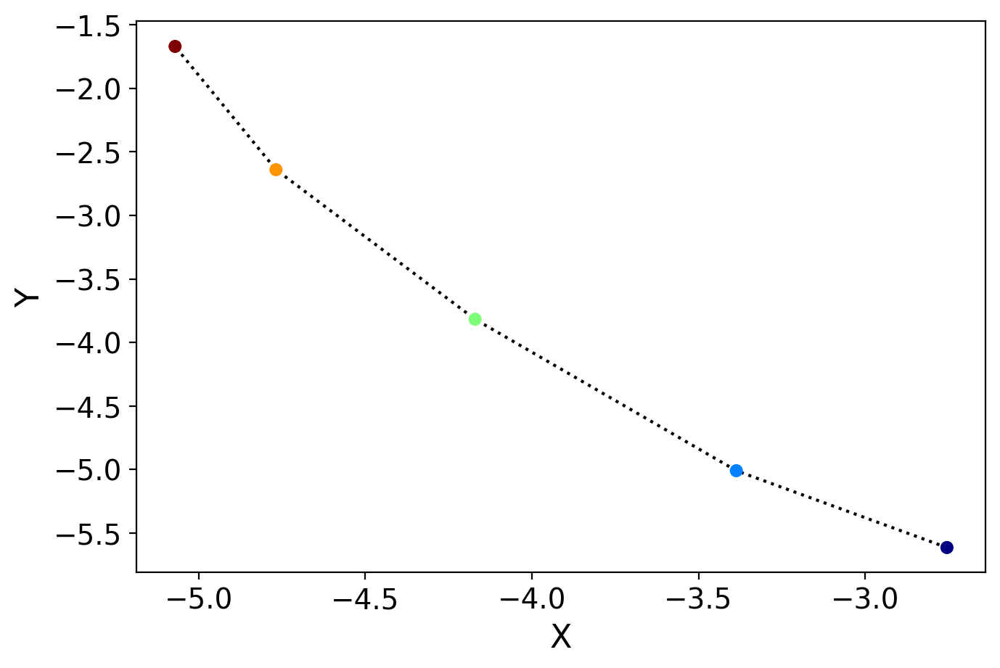

True


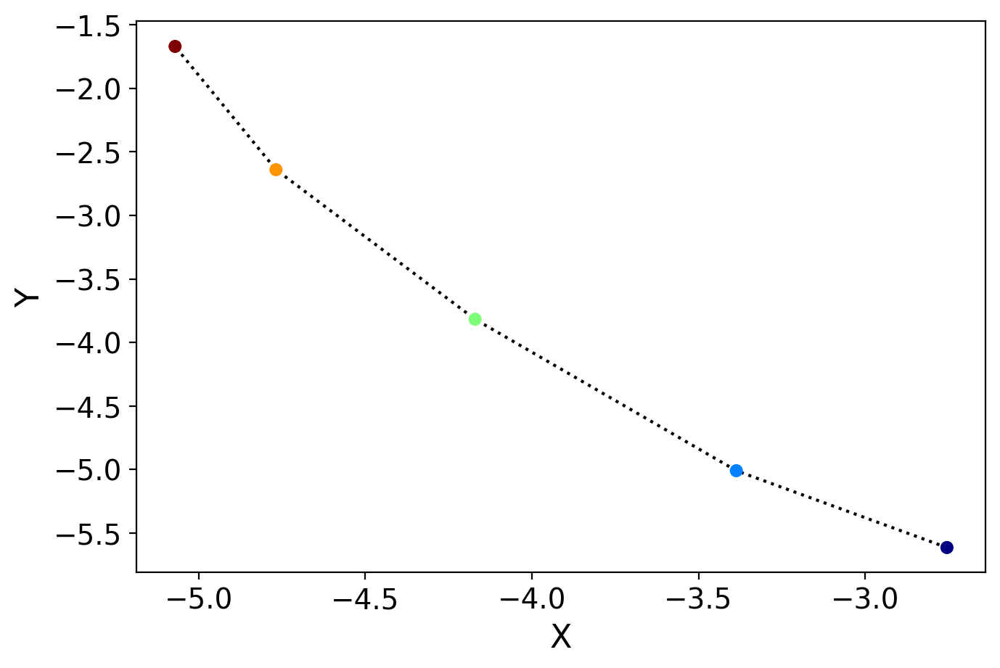

False
X0: 85
[[ 1.54887576  3.29132762 -3.47398405 -0.4660305   0.22386552  1.45782401
   0.37346906 -0.4558213  -0.21713447  0.78995756]
 [ 0.92091681  4.59967062 -1.09305638 -1.7915012   0.9533466   0.95358512
   0.24285876 -0.65364907 -0.09690444  0.46497917]
 [ 0.29295786  5.90801361  1.28787129 -3.11697191  1.68282768  0.44934622
   0.11224846 -0.85147684  0.02332559  0.14000078]
 [-0.33500108  7.2163566   3.66879896 -4.44244261  2.41230876 -0.05489267
  -0.01836183 -1.04930461  0.14355561 -0.1849776 ]
 [-0.96296003  8.5246996   6.04972663 -5.76791331  3.14178984 -0.55913156
  -0.14897213 -1.24713238  0.26378564 -0.50995599]]


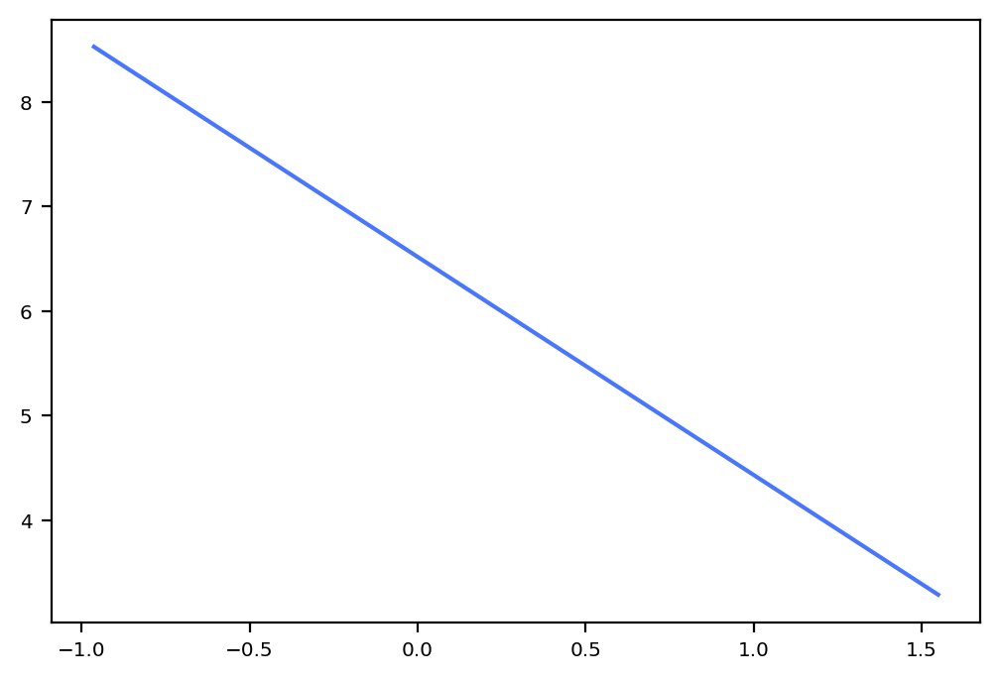

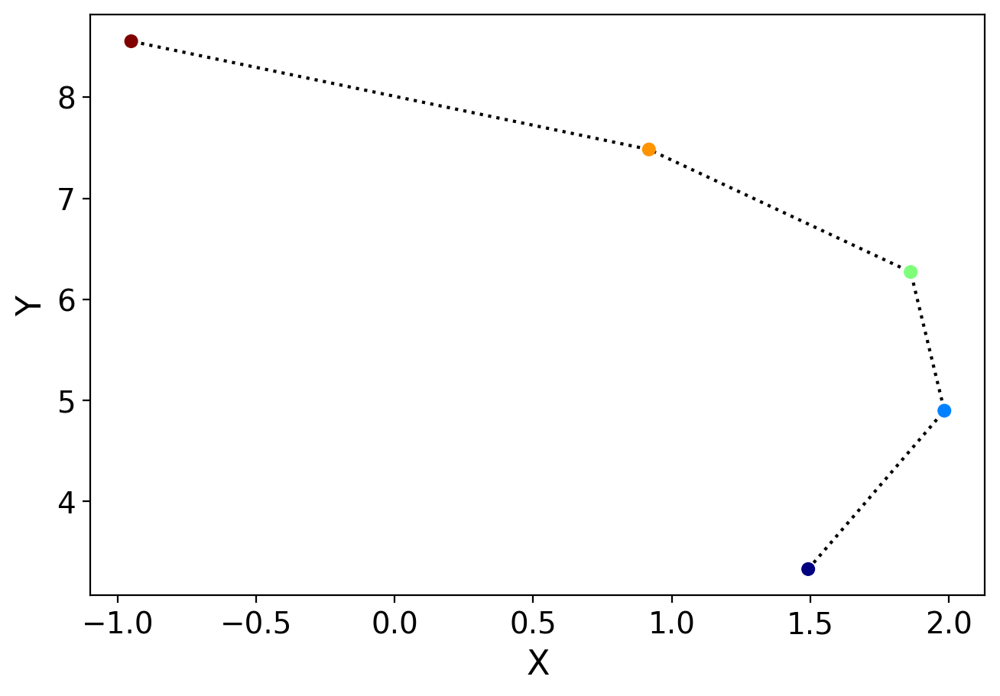

True


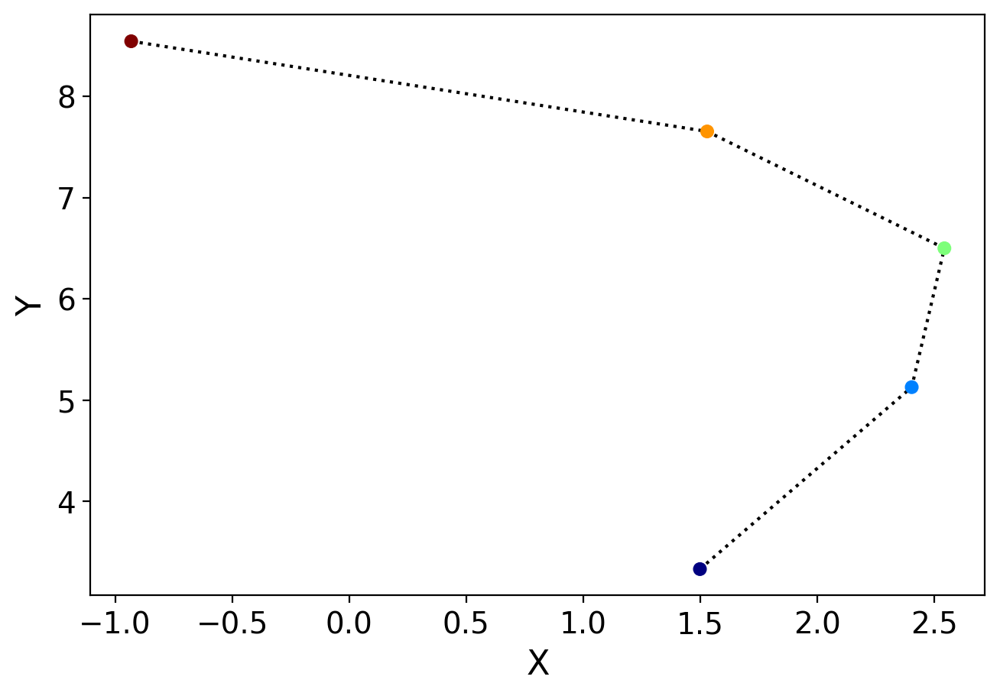

True


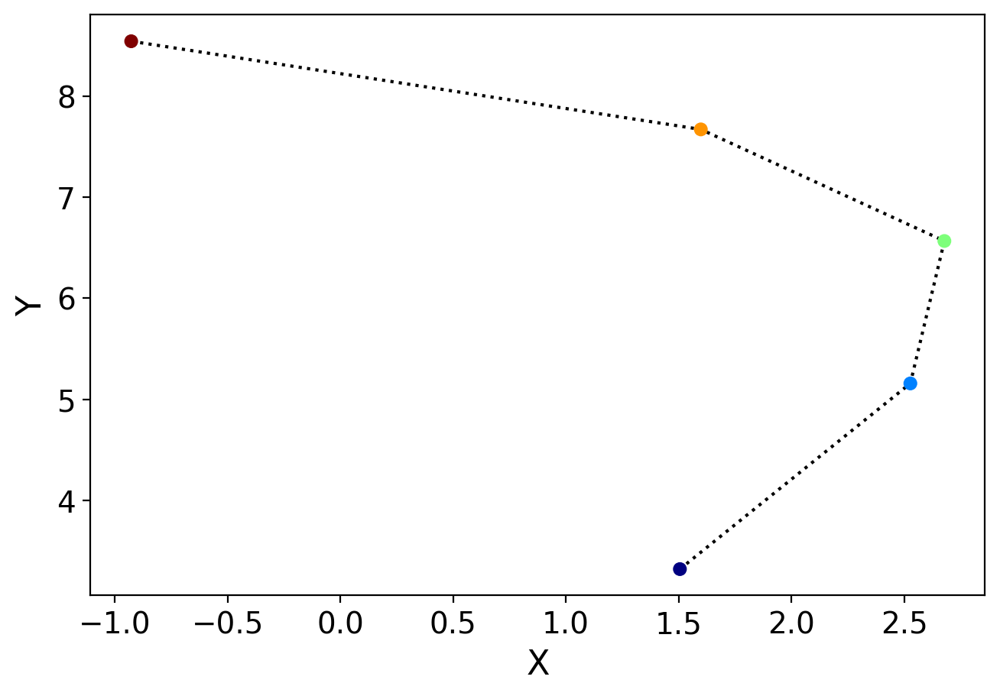

True


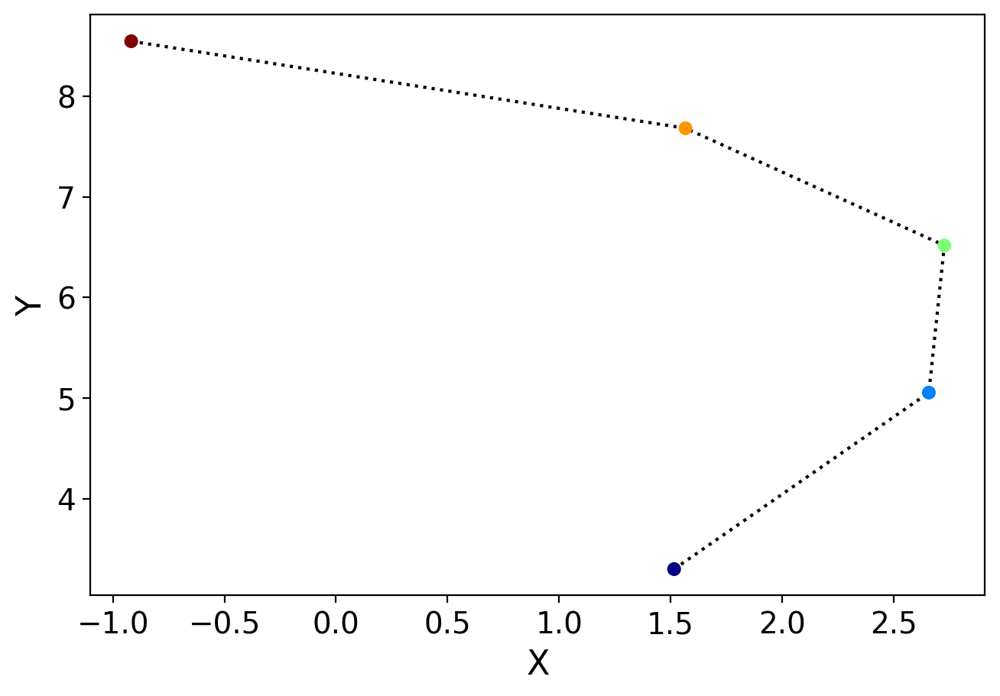

True


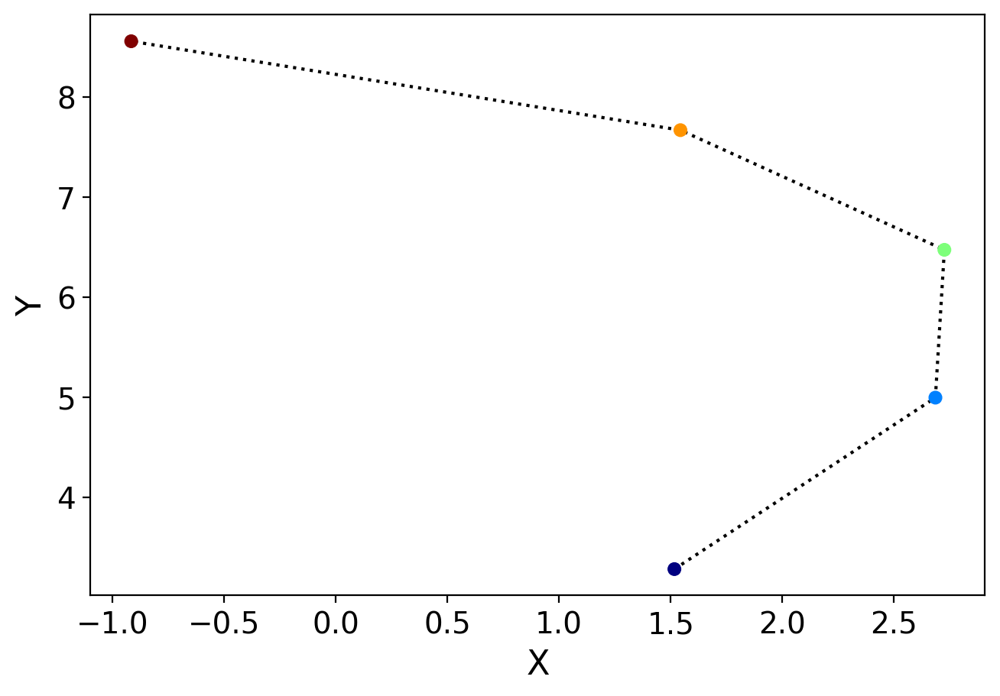

True


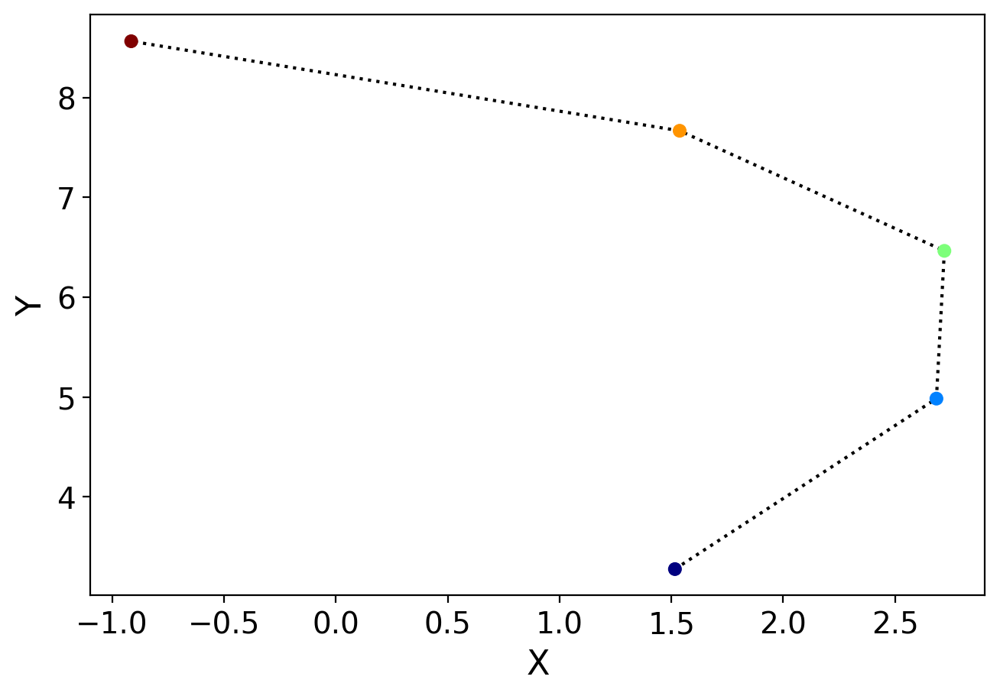

False
X0: 15
[[-2.33864317 -4.96866923 -3.53930252  4.0776758  -0.04423643 -3.2662949
  -0.25927009 -0.76723276 -1.66431739  0.63229748]
 [-3.31079914 -4.28261487  0.37399883  3.1840854   0.51732389 -4.23104738
   0.22151156 -0.73806172 -1.40435431  0.21006613]
 [-4.2829551  -3.59656051  4.28730019  2.29049499  1.07888422 -5.19579987
   0.70229321 -0.70889068 -1.14439124 -0.21216522]
 [-5.25511106 -2.91050616  8.20060154  1.39690458  1.64044454 -6.16055235
   1.18307486 -0.67971964 -0.88442816 -0.63439657]
 [-6.22726702 -2.2244518  12.11390289  0.50331418  2.20200486 -7.12530483
   1.66385651 -0.65054859 -0.62446509 -1.05662792]]


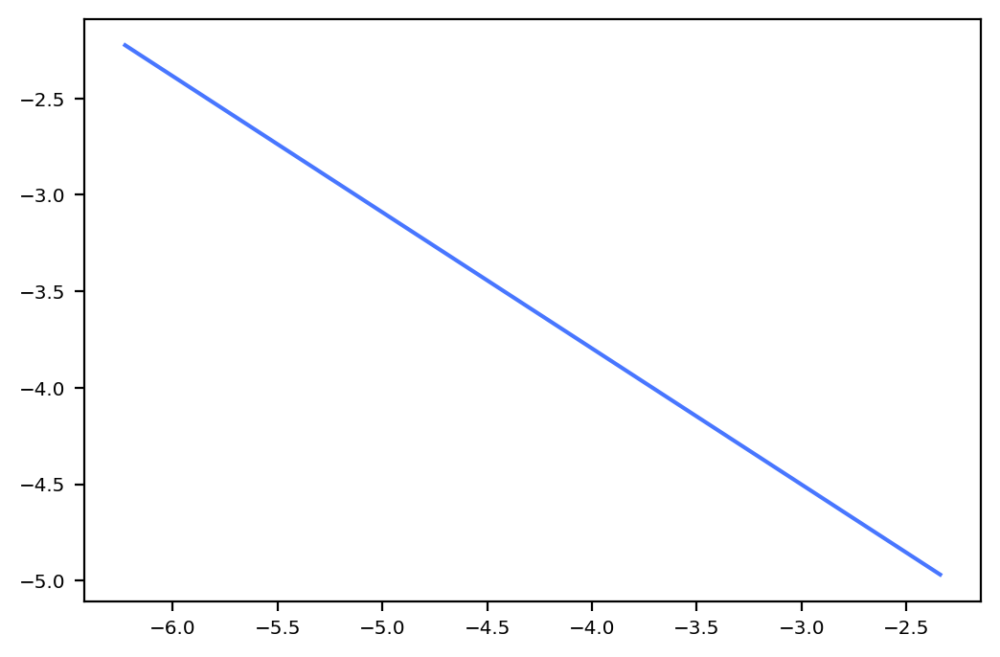

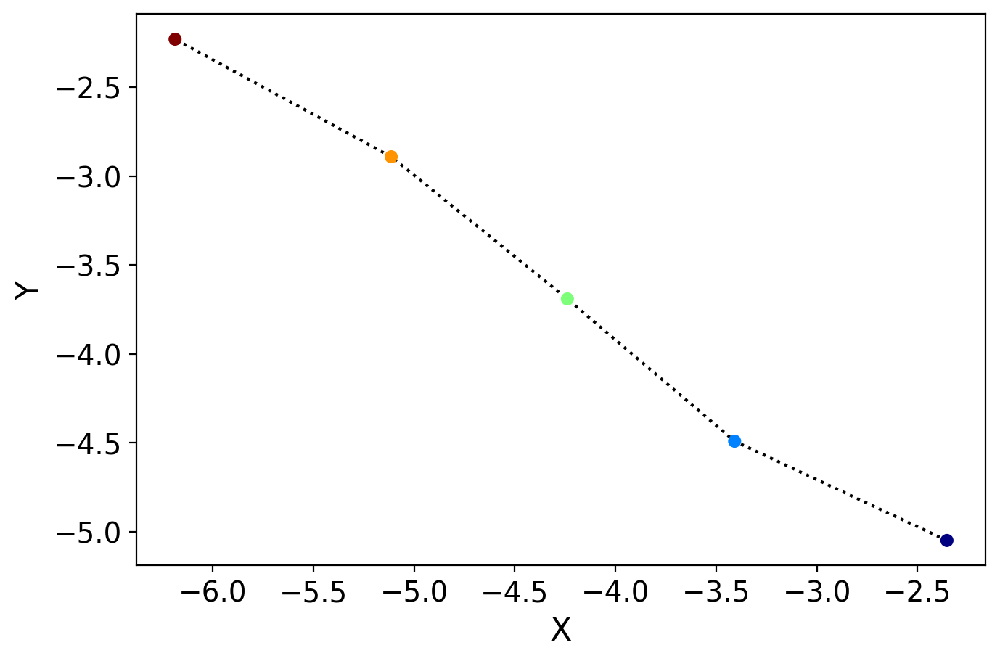

True


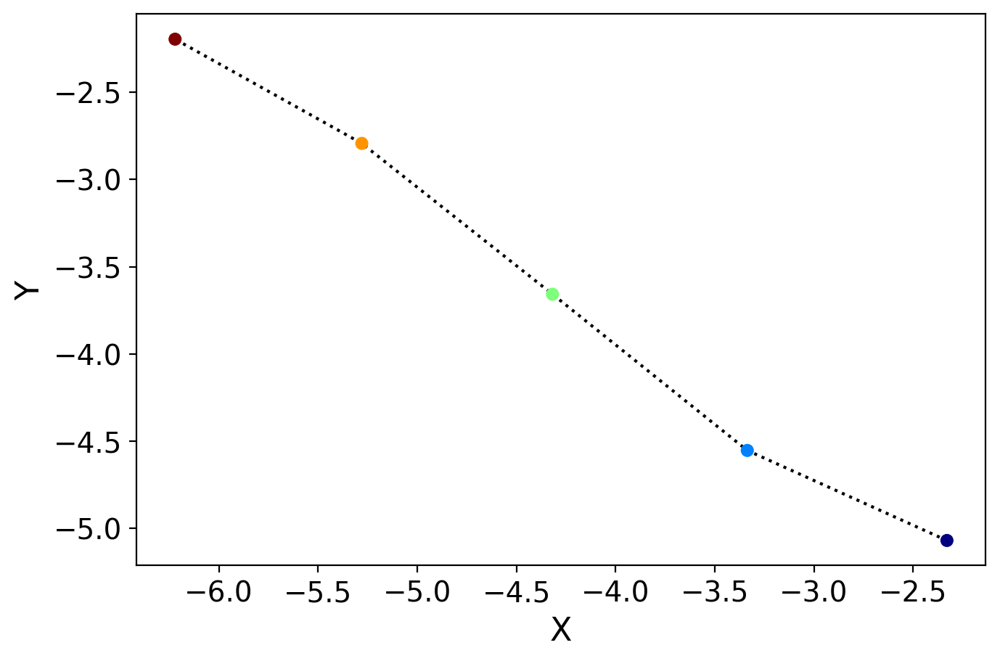

True


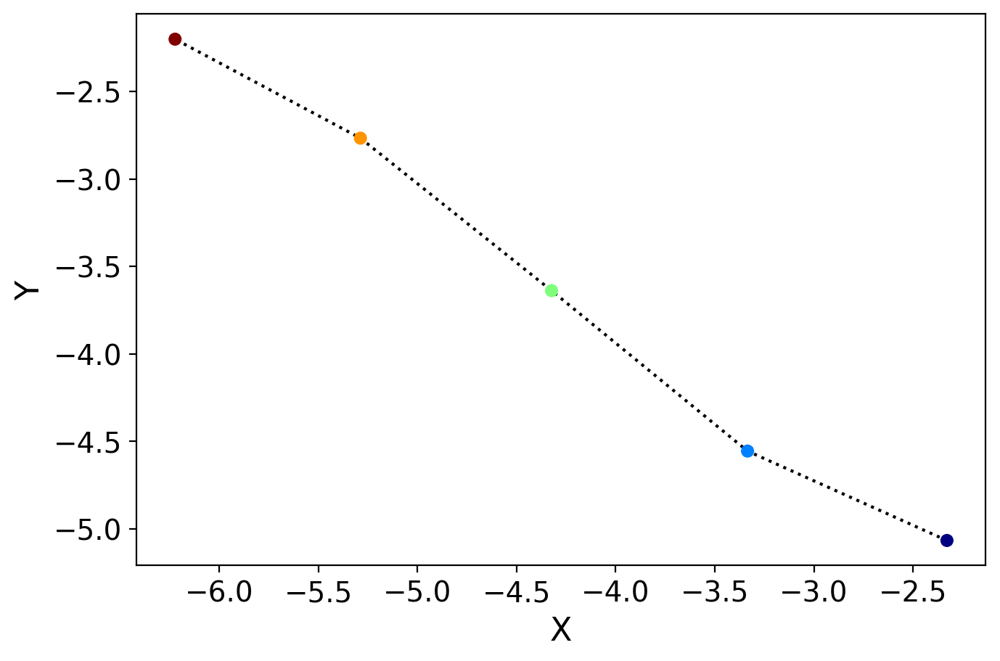

True


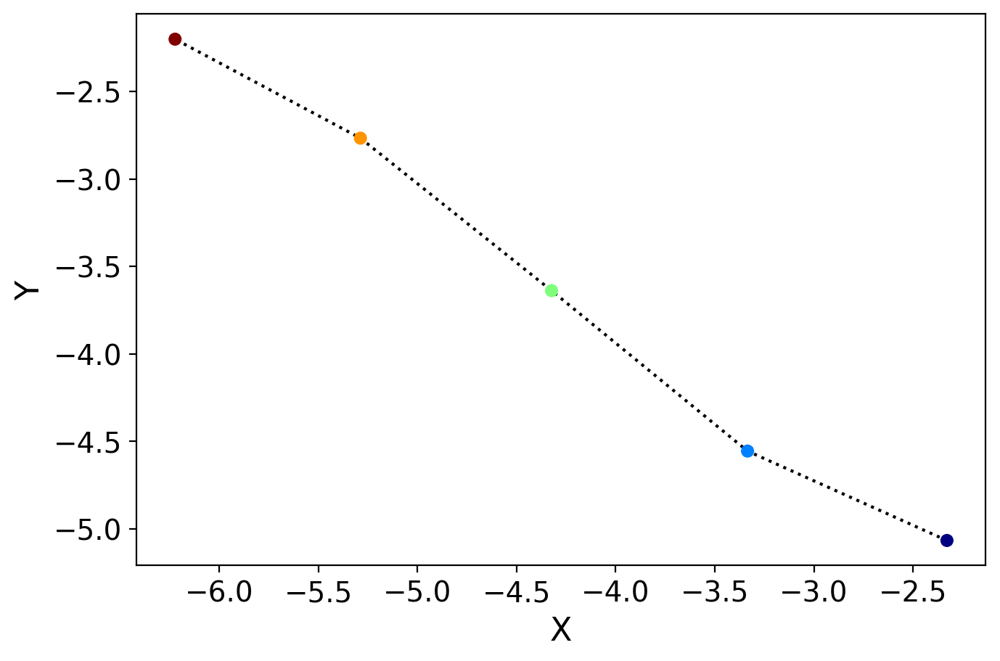

False


In [483]:
DC_trajs_list = []
for i in range(len(model_list)):
    model = model_list[i]
    DC_trajs = []
    
    for j in range(2): 
        path = np.where(model.labels_ == j)[0]

        traj_cl0=[]
        E_state_cl0=[]
        M_state_cl0=[]
        for index in path:
            traj_arr = coords_DC_list[i][index]
            root_state=traj_arr[0,:]
            end_state=traj_arr[-1,:]

            traj_cl0.append(traj_arr)
            E_state_cl0.append(root_state)
            M_state_cl0.append(end_state)

        E_state_mean0=np.mean(np.array(E_state_cl0),axis=0)
        M_state_mean0=np.mean(np.array(M_state_cl0),axis=0)

        X0=traj_cl0
        x1=E_state_mean0
        x2=M_state_mean0

        print("X0: " + str(len(X0)))
        #print(len(X0))
        
        nrc=5

        FP=FindPath2(nrc, traj_w=10,sf=1)
        path_DC_traj, data_rc0=FP.fit(x1,x2,X0)
        DC_trajs.append(path_DC_traj)
        
    DC_trajs_list.append(DC_trajs)

In [484]:
# MAP DC clusters to RC representation
DC_to_RC_trajs = []
for trial in DC_trajs_list:
    cluster_trajs = []
    for traj in trial:
        traj_keep = []
        for coord in traj:
            temp_coord = getNNeighbors(coord, dose12.obsm['X_DC'], k=1)[0][0]
            traj_keep.append(temp_coord)
        cluster_trajs.append(traj_keep)
    DC_to_RC_trajs.append(cluster_trajs)

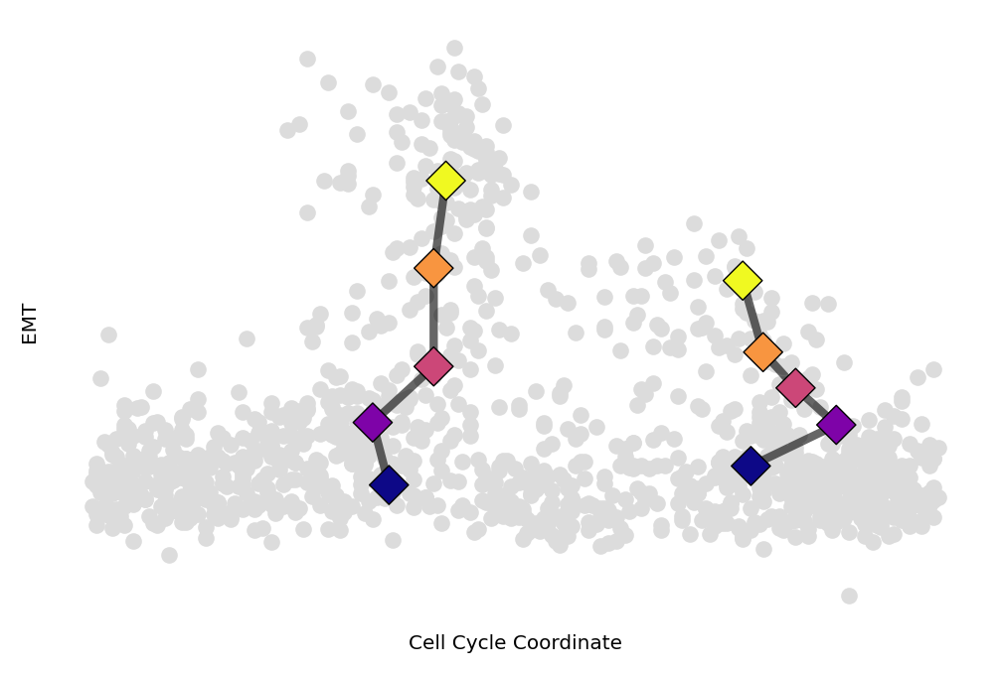

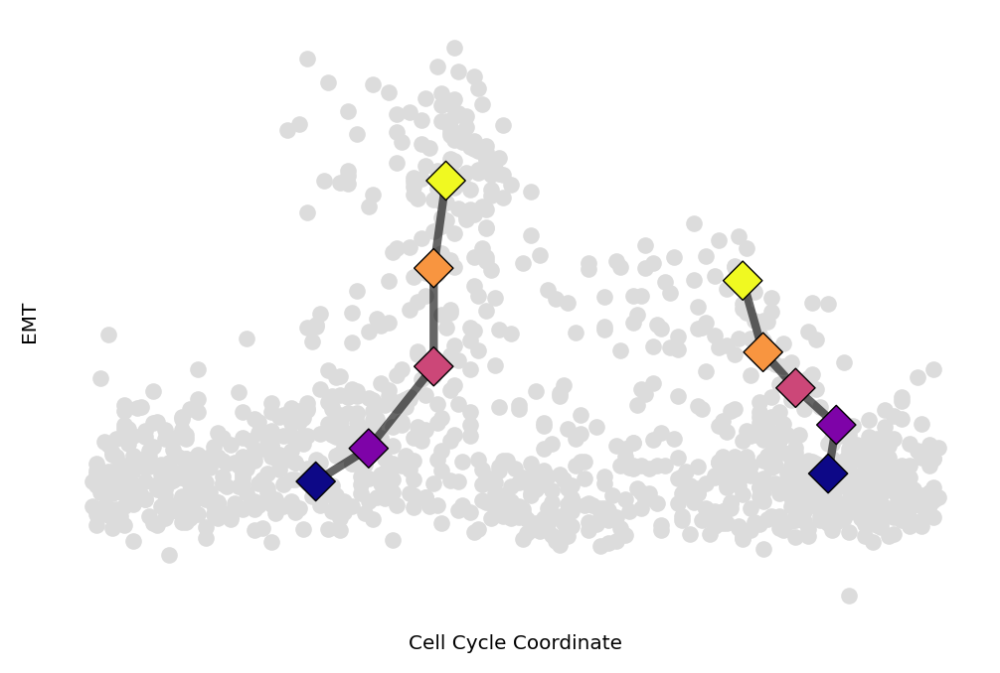

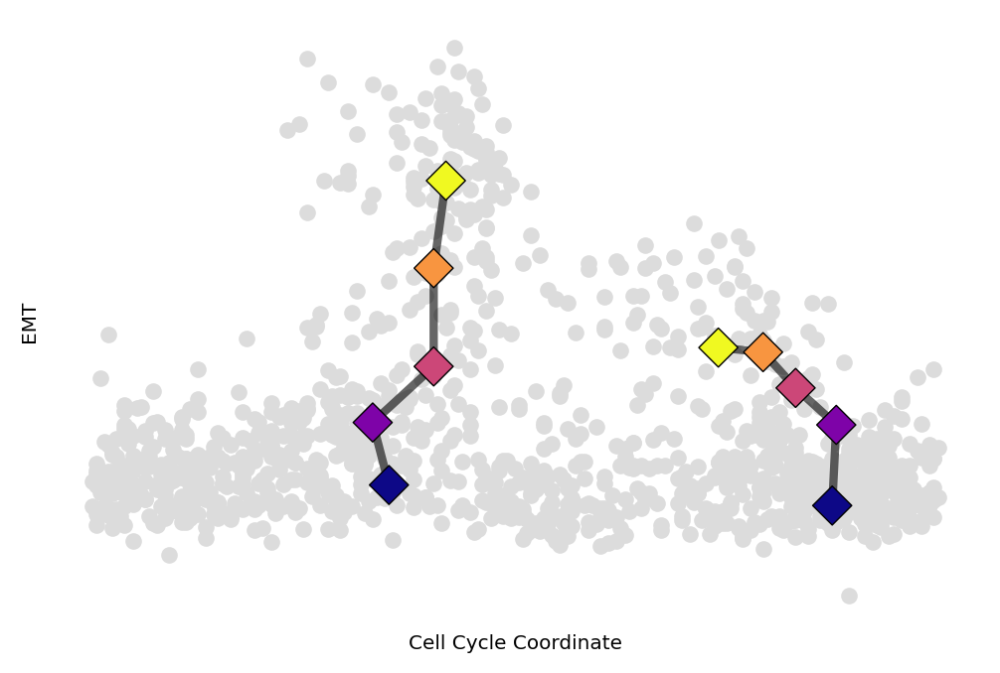

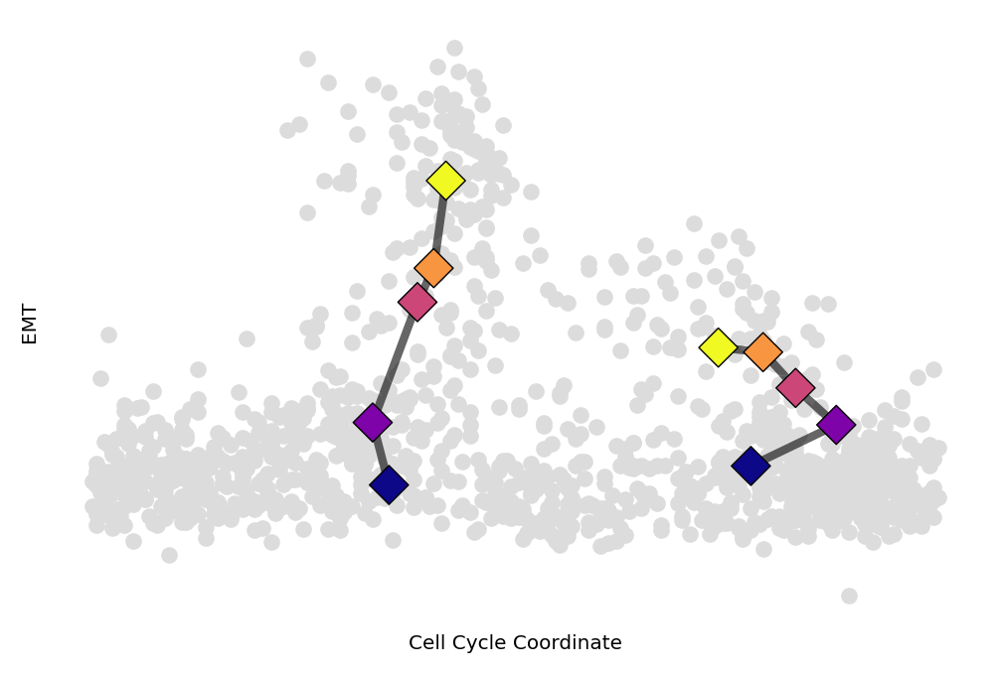

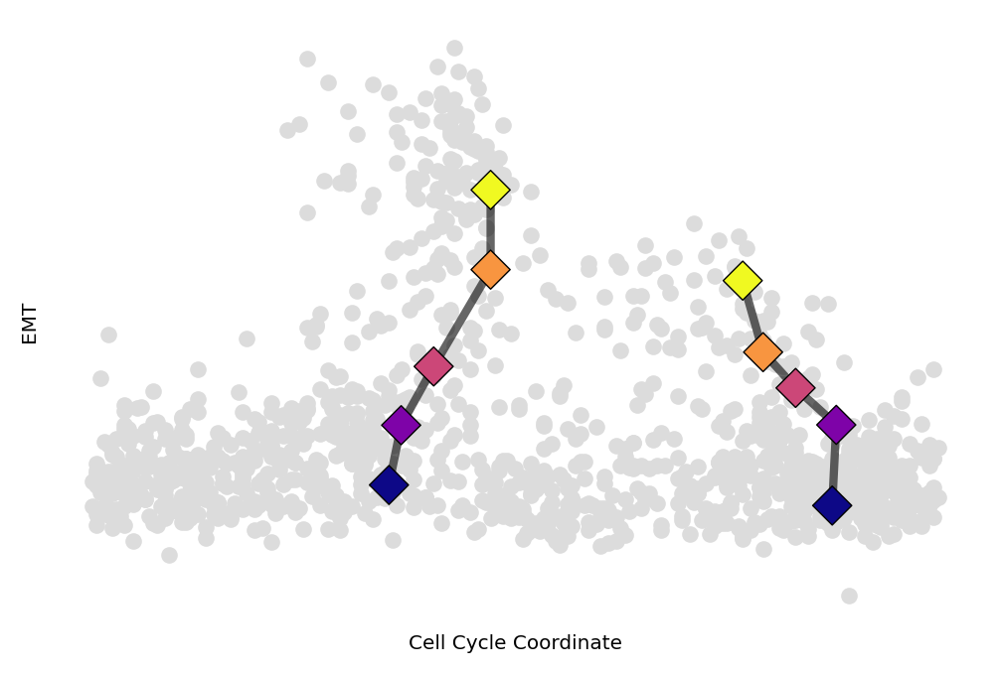

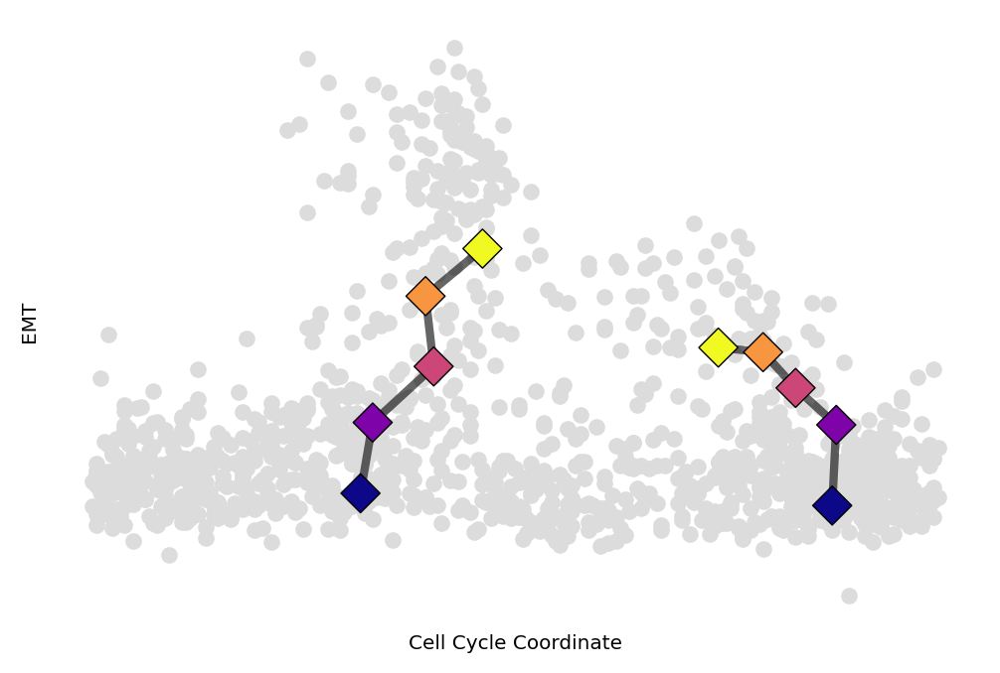

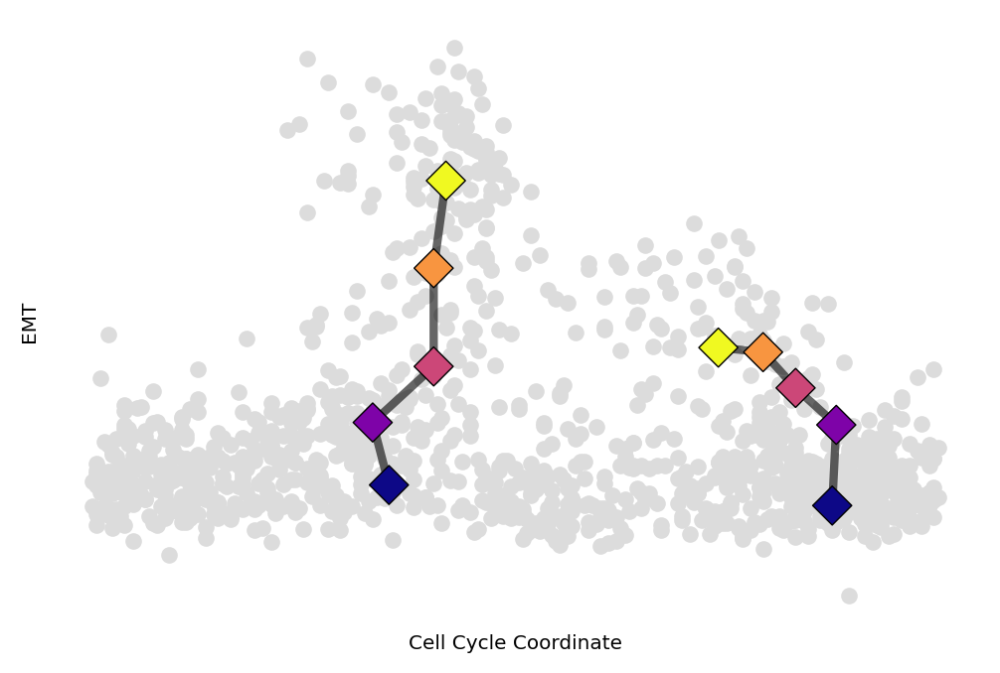

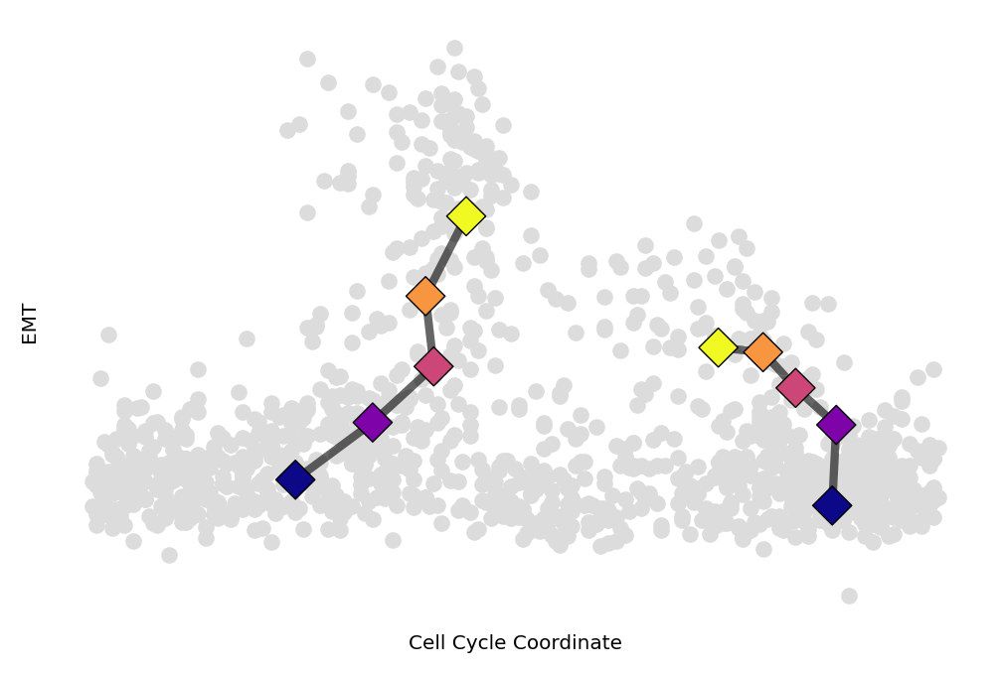

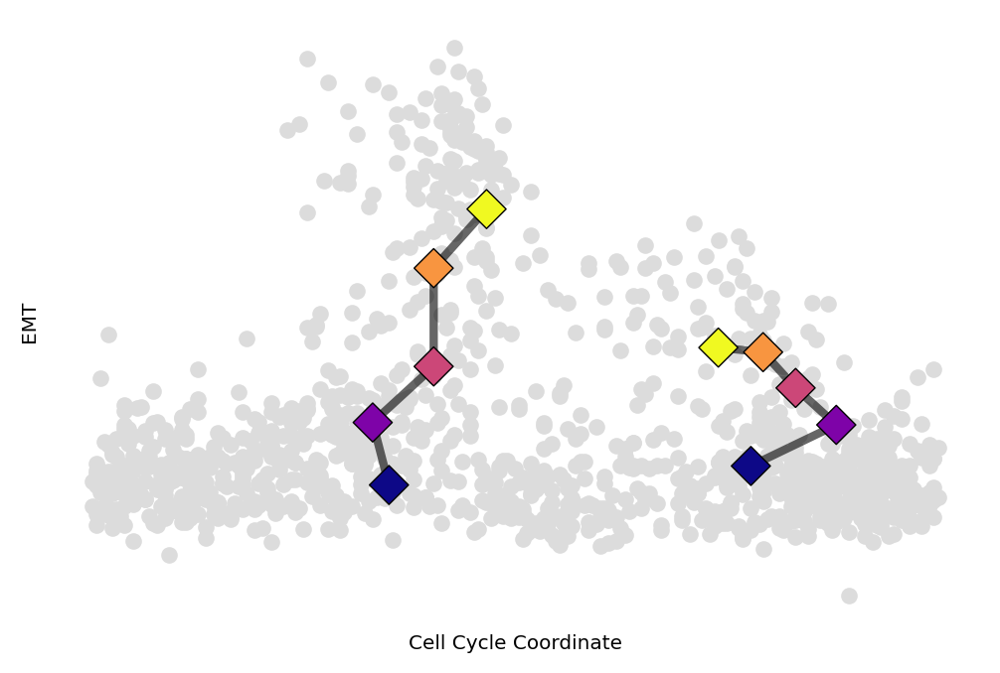

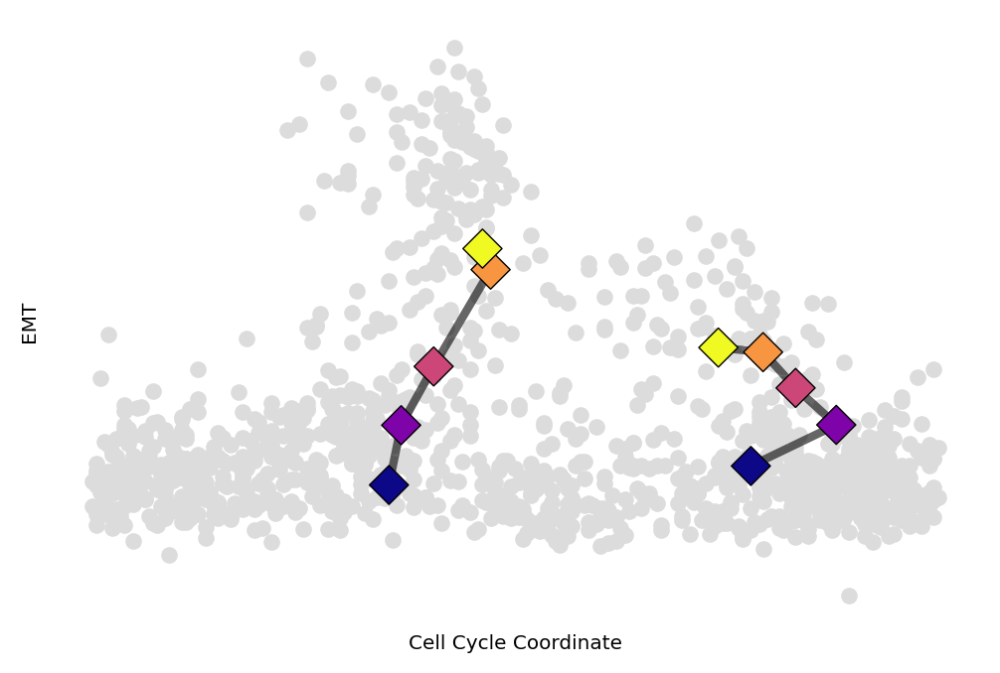

In [488]:
i=0
for trial in DC_to_RC_trajs:
    plt.subplot(1,1,1,frame_on=False)
    plt.scatter(dose12.obsm['X_RC'][:,0],
                dose12.obsm['X_RC'][:,1],
                s=30,
                color='gainsboro', zorder=1)
    for traj in trial:
        if dose12.obsm['X_RC'][traj[0],0] < 50:
            symbol = 'o'
        else:
            symbol = 'D'
        plt.plot(dose12.obsm['X_RC'][traj,0],
                dose12.obsm['X_RC'][traj,1],
                color='black',
                linewidth=3,
                zorder=2,
                alpha=0.6)
        plt.scatter(dose12.obsm['X_RC'][traj,0],
                    dose12.obsm['X_RC'][traj,1],
                    c=range(len(traj)),
                    s=100,
                    edgecolor='black',
                    facecolors='none',
                    cmap='plasma',
                    zorder=2,
                    marker=symbol)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel("Cell Cycle Coordinate")
    plt.ylabel("EMT")
    #plt.savefig("../plots/new_CCC/dose12/RC_trajs/trial_"+str(i)+"_trajs_colored.png", dpi=300)
    plt.show()
    i+=1